## Installations

In [1]:
!pip install tslearn

In [2]:
!pip install kaggle

  Using cached kaggle-1.6.8.tar.gz (84 kB)
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.8/162.8 kB 1.2 MB/s eta 0:00:00a 0:00:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.2/78.2 kB 505.4 kB/s eta 0:00:00a 0:00:01
  Created wheel for kaggle: filename=kaggle-1.6.8-py3-none-any.whl size=111962 sha256=f3f6e950b2e8069818d16329fa501ff54a034b6d002de43d1fbae73610870831
  Stored in directory: /home/ariel/.cache/pip/wheels/90/a0/a1/c8af89a81821187aef4675b6e8c18f40a8cdbe8b00fd0e2d76
Successfully built kaggle


In [3]:
!pip install statsmodels

## Imports

In [2]:
import pandas as pd
from tqdm import tqdm
import time
import os
import os
import re
from collections import Counter
import pickle
import lichess.api
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from tslearn.clustering import TimeSeriesKMeans
from tslearn.clustering import TimeSeriesKMeans
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np
from tslearn.clustering import TimeSeriesKMeans, KShape, KernelKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from matplotlib.patches import ConnectionPatch
import matplotlib.pyplot as plt
import numpy as np
import scipy.spatial.distance as dist
from warnings import filterwarnings
from random import sample
from datetime import datetime, timezone
import os
import pandas as pd

from tslearn.utils import to_time_series_dataset
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.clustering import TimeSeriesKMeans, silhouette_score


try:
  from tslearn.clustering import TimeSeriesKMeans
  from tslearn.clustering import silhouette_score
except:
  import sys
  !{sys.executable} -m pip install tslearn
  from tslearn.clustering import TimeSeriesKMeans
  from tslearn.clustering import silhouette_score

import time
from sklearn import metrics
# Avoid showing warnings to keep the notebook outputs clean.
filterwarnings("ignore")

/home/ariel/anaconda3/envs/ml/lib/python3.12/site-packages/tslearn/bases/bases.py:15: UserWarning: h5py not installed, hdf5 features will not be supported.
Install h5py to use hdf5 features: http://docs.h5py.org/
  warn(h5py_msg)


## Methods

In [3]:
def read_file(file):
    df=pd.read_csv(file)

    return df


def get_all_players(df):
    all_whites=list(set(sorted(df["White"])))
    all_whites=sorted(all_whites)
    all_black=list(set(sorted(df["Black"])))
    all_black=sorted(all_black)
    all_players=list(set(all_whites+all_black))
    return all_players
def get_events_for_player(df,player):
    return Counter(list(df[(df["White"]==player)|(df["Black"]==player)]["Event"]))
def get_games_for_player(df,player):
    return df[(df["White"]==player)|(df["Black"]==player)]

def get_years_for_player(df,player):
    return dict(Counter(list(df[(df["White"]==player)|(df["Black"]==player)]["Year"])))
def get_years_for_player_game(df,player,game):
    return dict(Counter(list(df[((df["White"]==player)|(df["Black"]==player))&(df["Event"]==game)]["Year"])))
def get_players(df):
    w=list(df["White"])
    b=list(df["Black"])
    all=list(set((w+b)))
    return all

def get_games_for_player(df,player):
    player_black_df=df[df["Black"]==player]
    player_black_df=player_black_df[["UTCDate","BlackElo","UTCTime"]]
    player_black_df.rename(columns={'BlackElo':'Elo'},inplace=True)

    player_white_df=df[df["White"]==player]
    player_white_df=player_white_df[["UTCDate","WhiteElo","UTCTime"]]
    player_white_df.rename(columns={'WhiteElo':'Elo'},inplace=True)

    return pd.concat([player_black_df,player_white_df]).sort_values(by='UTCDate')


def date_to_num(date_str):
    # Parse the date string to datetime object
    date_obj = datetime.strptime(date_str, "%Y.%m.%d %H:%M:%S")

    # Convert the datetime object to Unix timestamp (seconds since epoch)
    unix_timestamp = date_obj.replace(tzinfo=timezone.utc).timestamp()
    return unix_timestamp

def get_players_atleast_x_games_type(x,game_type,df):

    df_c=(df[df["Event"]==" Blitz "])
    w=dict(df_c["White"].value_counts())
    b=dict(df_c["Black"].value_counts())
    all={}
    all=w
    for k,v in b.items():
        all[k]=all.get(k,0)+v
    h=[]
    for k,v in w.items():
        if v>200:
            h.append(k)
    len(h)

    #
    df=df[(df["White"].isin(h))|(df["Black"].isin(h))]

    #
    df1=df[(df["White"].isin(h))&(df["Black"].isin(h))]
    df1=df1[["White","WhiteElo","UTCDate","UTCTime"]].rename(columns={"White":"Player","WhiteElo":"Elo"})

    df2=df[(df["White"].isin(h))&(~df["Black"].isin(h))]
    df2=df2[["White","WhiteElo","UTCDate","UTCTime"]].rename(columns={"White":"Player","WhiteElo":"Elo"})

    #
    df3=df[(~df["White"].isin(h))&(df["Black"].isin(h))]
    df3=df3[["Black","BlackElo","UTCDate","UTCTime"]].rename(columns={"Black":"Player","BlackElo":"Elo"})

    #
    df4=df[(df["White"].isin(h))&(df["Black"].isin(h))]
    df4=df4[["Black","BlackElo","UTCDate","UTCTime"]].rename(columns={"Black":"Player","BlackElo":"Elo"})

    #
    df=pd.concat([df1,df2,df3,df4])
    return df



## Get dataset

In [8]:
!mkdir -p data
!mkdir -p data/fics
!mkdir -p data/fics/raw
!mkdir -p data/fics/dataset_raw
!mkdir -p data/lichess
!mkdir -p data/lichess/raw
!mkdir -p data/lichess/dataset_raw


In [7]:
# Api key for kaggle
api_token = {"username":"arielzilber","key":"7f0cfa2d136af50998e08583c84cc892"}
!mkdir -p /home/ariel/.kaggle
import json

with open('/home/ariel/.kaggle/kaggle.json', 'w') as file:
  json.dump(api_token, file)

In [ ]:
!kaggle datasets download arielzilber/chess-games-for-uni-course -p ./data/lichess/dataset_raw

100%|█████████████████████████████████████▉| 1.45G/1.45G [01:05<00:00, 22.7MB/s]
100%|██████████████████████████████████████| 1.45G/1.45G [01:05<00:00, 23.7MB/s]


In [1]:
!kaggle datasets download arielzilber/fcis-standard-2009-to-2023 -p ./data/fics/dataset_raw

... resuming from 163577856 bytes (2466331412 bytes left) ...
 14%|█████▎                                 | 343M/2.45G [03:07<26:26, 1.43MB/s]^C
 14%|█████▎                                 | 343M/2.45G [03:07<36:08, 1.05MB/s]
User cancelled operation


In [5]:
!ls data/lichess/dataset_raw
!unzip data/lichess/dataset_raw/chess-games-for-uni-course.zip
!mv chess_games data/lichess/dataset_raw/
!ls data/lichess/dataset_raw

unzip:  cannot find or open data/lichess/dataset_raw/chess-games-for-uni-course.zip, data/lichess/dataset_raw/chess-games-for-uni-course.zip.zip or data/lichess/dataset_raw/chess-games-for-uni-course.zip.ZIP.
mv: cannot stat 'chess_games': No such file or directory


## EDA

#### Win rate

In [3]:
df=read_file("data/fics/dataset_raw/chess-games.csv")

In [9]:
df

,Black,BlackClock,BlackElo,BlackIsComp,BlackRD,Date,ECO,Event,FICSGamesDBGameNo,Moves,...,Site,Time,TimeControl,White,WhiteClock,WhiteElo,WhiteRD,WhiteIsComp,EloDiff,RelativeEloDiff
0,LochChessMonster,0:15:00.000,1745,Yes,25.4,2022.09.12,B12,FICS rated standard game,512494043,e4|c6|d4|d5|e5|Bf5|Nc3|Qb6|a3|Qd8|Nf3|Nd7|h3|N...,...,FICS freechess.org,08:40:00,900+0,Mundt,0:15:00.000,1602,38.9,NaN,-143,-4.27
1,ImBeliever,0:15:00.000,1861,?,34.8,2022.09.12,D02,FICS rated standard game,512494029,d4|d5|e3|Bf5|Nf3|f6|Be2|h6|b3|e6|Bb2|Bd6|Nbd2|...,...,FICS freechess.org,08:44:00,900+0,loomba,0:15:00.000,1901,32.6,NaN,40,1.06
2,hecklepeckle,0:15:00.000,1619,?,34.2,2022.09.12,C50,FICS rated standard game,512494019,e4|e5|Nf3|Nc6|Bc4|Bd6|Nc3|Nf6|d3|O-O|a3|Be7|h3...,...,FICS freechess.org,08:39:00,900+0,BestMatz,0:15:00.000,1606,44.5,NaN,-13,-0.40
3,circum,0:15:00.000,1440,?,28.8,2022.09.12,C10,FICS rated standard game,512494013,e4|e6|Nc3|d5|d4|Be7|e5|Nd7|Nf3|c6|h3|Nb6|Rh2|B...,...,FICS freechess.org,08:32:00,900+0,rusalka,0:15:00.000,1618,25.5,NaN,178,5.82
4,vandi,0:15:00.000,1939,?,29.6,2022.09.12,A00,FICS rated standard game,512494009,g4,...,FICS freechess.org,08:47:00,900+0,Achonk,0:15:00.000,1938,35.4,NaN,-1,-0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18492769,DonatiNair,0:15:00.000,1775,NaN,na,2013.12.12,A02,FICS rated standard game,347372700,f4|e6|e4|Nc6|Nf3|Nf6|Nc3|d5|exd5|Nxd5|Nxd5|Qxd...,...,FICS freechess.org,10:19:00,900+0,Romagnoli,0:15:00.000,1691,na,NaN,-84,-2.42
18492770,compaqMayank,0:15:00.000,1612,NaN,na,2013.12.12,A45,FICS rated standard game,347372693,d4|Nf6|g3|e6|Bg2|d5|Nc3|b6|Bf4|Bb7|Nb5|Bd6|Nxd...,...,FICS freechess.org,10:01:00,900+0,FredMICH,0:15:00.000,1517,na,NaN,-95,-3.04
18492771,mortalaffront,0:13:00.000,1867,NaN,na,2013.12.12,A00,FICS rated standard game,347372688,g3|Nc6|Bg2|b6|e3|Bb7|Ne2|e5|b3|g6|Bb2|Bg7|O-O|...,...,FICS freechess.org,10:21:00,780+5,rojmedi,0:13:00.000,1748,na,NaN,-119,-3.29
18492772,KarnatakaDon,0:15:00.000,1186,NaN,na,2013.12.12,C25,FICS rated standard game,347372683,e4|e5|Nc3|d6|Bc4|Nf6|d3|h6|a3|a6|Nge2|Be7|O-O|...,...,FICS freechess.org,10:23:00,900+0,Divljak,0:15:00.000,1855,na,NaN,669,22.00


In [7]:
df=df.drop(columns=['Unnamed: 0.1', 'Unnamed: 0'])

In [8]:
df["EloDiff"] = df["WhiteElo"] - df["BlackElo"]
df["RelativeEloDiff"] = (
    ((df["WhiteElo"] / (df[["WhiteElo", "BlackElo"]].median(axis=1))) - 1.0) * 100.0
).round(2)
display(df.head())

,Black,BlackClock,BlackElo,BlackIsComp,BlackRD,Date,ECO,Event,FICSGamesDBGameNo,Moves,...,Site,Time,TimeControl,White,WhiteClock,WhiteElo,WhiteRD,WhiteIsComp,EloDiff,RelativeEloDiff
0,LochChessMonster,0:15:00.000,1745,Yes,25.4,2022.09.12,B12,FICS rated standard game,512494043,e4|c6|d4|d5|e5|Bf5|Nc3|Qb6|a3|Qd8|Nf3|Nd7|h3|N...,...,FICS freechess.org,08:40:00,900+0,Mundt,0:15:00.000,1602,38.9,NaN,-143,-4.27
1,ImBeliever,0:15:00.000,1861,?,34.8,2022.09.12,D02,FICS rated standard game,512494029,d4|d5|e3|Bf5|Nf3|f6|Be2|h6|b3|e6|Bb2|Bd6|Nbd2|...,...,FICS freechess.org,08:44:00,900+0,loomba,0:15:00.000,1901,32.6,NaN,40,1.06
2,hecklepeckle,0:15:00.000,1619,?,34.2,2022.09.12,C50,FICS rated standard game,512494019,e4|e5|Nf3|Nc6|Bc4|Bd6|Nc3|Nf6|d3|O-O|a3|Be7|h3...,...,FICS freechess.org,08:39:00,900+0,BestMatz,0:15:00.000,1606,44.5,NaN,-13,-0.40
3,circum,0:15:00.000,1440,?,28.8,2022.09.12,C10,FICS rated standard game,512494013,e4|e6|Nc3|d5|d4|Be7|e5|Nd7|Nf3|c6|h3|Nb6|Rh2|B...,...,FICS freechess.org,08:32:00,900+0,rusalka,0:15:00.000,1618,25.5,NaN,178,5.82
4,vandi,0:15:00.000,1939,?,29.6,2022.09.12,A00,FICS rated standard game,512494009,g4,...,FICS freechess.org,08:47:00,900+0,Achonk,0:15:00.000,1938,35.4,NaN,-1,-0.03


In [10]:
def win_rate_by_elo_diff(elo_diff):
    try:
        win_freq=Counter(df[df["EloDiff"] > elo_diff]["Result"])
        white_won=win_freq["1-0"]
        draw=win_freq["1/2-1/2"]
        black_won=win_freq["0-1"]
        total=white_won+draw+black_won
        white_wins_proportion = white_won / total
        white_loss_proportion = black_won / total
        draw_proportion = draw / total
        return pd.DataFrame({
            'total':[total],
            'white_won':[white_won],
            'white_wins_proportion':[white_wins_proportion],
            'white_loss_proportion':[white_loss_proportion],
            'black_won':[black_won],
            'draw':[draw],
            'draw_proportion':[draw_proportion],
        })
    except Exception as err:
           return pd.DataFrame({
            'total':[],
            'white_won':[],
            'white_wins_proportion':[],
            'white_loss_proportion':[],
            'black_won':[],
            'draw':[],
            'draw_proportion':[],
        })

In [11]:
frames=[]
for diff in np.arange(600,3601, 200):
    frames.append(win_rate_by_elo_diff(diff))

frames_df=pd.concat(frames)

In [12]:
win_freq2=Counter(df[df["EloDiff"] > 20]["Result"])
white_won2=win_freq2["1-0"]
draw2=win_freq2["1/2-1/2"]
black_won2=win_freq2["0-1"]
total2=white_won2+draw2+black_won2
white_wins_proportion2 = white_won2 / total2
white_loss_proportion2 = black_won2 / total2
draw_proportion2 = draw2 / total2
print(
    f"Out of {total2} games:\n  White won {white_won2} games "
    f"({white_wins_proportion2:.2%}).\n  White lost {black_won2} games "
    f"({white_loss_proportion2:.2%}).\n"
    f"  White draw {draw2} games ({draw_proportion2:.2%}).  "
)

Out of 8139709 games:
  White won 5506728 games (67.65%).
  White lost 2279695 games (28.01%).
  White draw 353286 games (4.34%).  


In [13]:
win_freq2=Counter(df[df["EloDiff"] > 20]["Result"])
white_won2=win_freq2["1-0"]
draw2=win_freq2["1/2-1/2"]
black_won2=win_freq2["0-1"]
total2=white_won2+draw2+black_won2
white_wins_proportion2 = white_won2 / total2
white_loss_proportion2 = black_won2 / total2
draw_proportion2 = draw2 / total2
print(
    f"Out of {total2} games:\n  White won {white_won2} games "
    f"({white_wins_proportion2:.2%}).\n  White lost {black_won2} games "
    f"({white_loss_proportion2:.2%}).\n"
    f"  White draw {draw2} games ({draw_proportion2:.2%}).  "
)

Out of 8139709 games:
  White won 5506728 games (67.65%).
  White lost 2279695 games (28.01%).
  White draw 353286 games (4.34%).  


#### Elo distributions

In [14]:
def get_elo_freq(df):
    freq_elo_black=Counter(list(df["BlackElo"]))
    freq_elo_white=Counter(list(df["WhiteElo"]))
    both={}
    for k,v in freq_elo_black.items():
        both[k]=v

    for k,v in freq_elo_white.items():
        both[k]=both.get(k,0)+v
    keys=list(both.keys())
    vals=list(both.values())
    frame=pd.DataFrame({
        'Elo':keys,
        'Count':vals,
    }).sort_values('Count',ascending=True)
    return frame

Text(0, 0.5, 'Count')

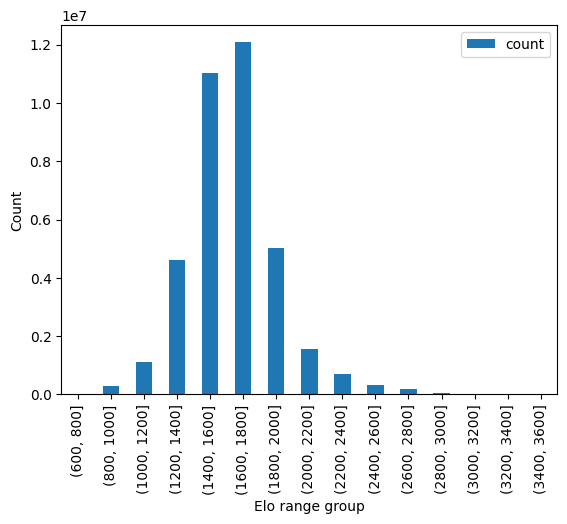

In [15]:
elo_freq=get_elo_freq(df)
elo_freq=elo_freq[["Elo","Count"]]
rating_bins = np.arange(600,3601, 200)
cuts=pd.cut(elo_freq["Elo"], bins=rating_bins)
elo_freq["group"]=cuts
groups=elo_freq.groupby('group').sum(["count"]).drop(columns="Elo")["Count"]
elo_freq=pd.DataFrame.from_dict({'group':list(groups.index.astype(str)),'count':list(groups.values)})
ax=elo_freq.plot(kind='bar',x='group',y='count')
ax.set_xlabel("Elo range group")
ax.set_ylabel("Count")

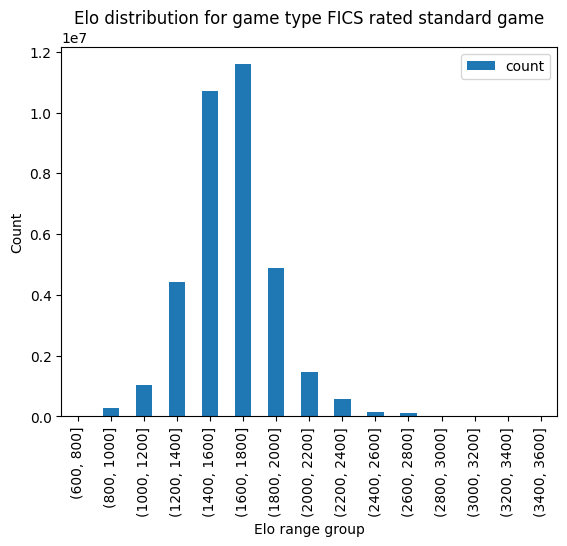

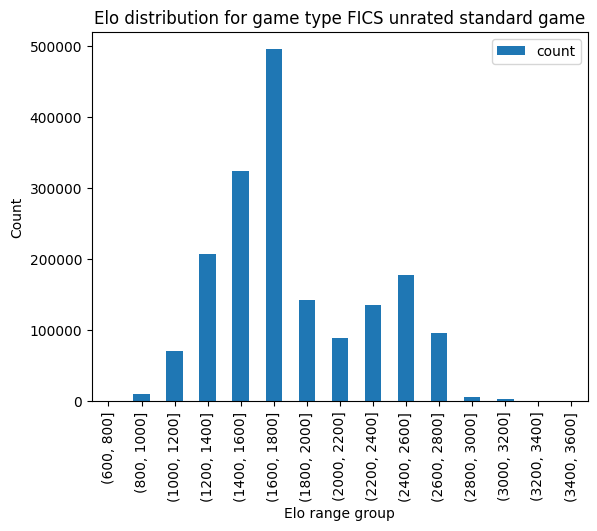

In [17]:
events=list(set(list(df["Event"])))


for e in events:
    df_e=df[df["Event"]==e]

    elo_freq=get_elo_freq(df_e)
    elo_freq=elo_freq[["Elo","Count"]]
    rating_bins = np.arange(600,3601, 200)
    cuts=pd.cut(elo_freq["Elo"], bins=rating_bins)
    elo_freq["group"]=cuts
    groups=elo_freq.groupby('group').sum(["count"]).drop(columns="Elo")["Count"]
    elo_freq=pd.DataFrame.from_dict({'group':list(groups.index.astype(str)),'count':list(groups.values)})
    ax=elo_freq.plot(kind='bar',x='group',y='count')
    ax.set_xlabel("Elo range group")
    ax.set_ylabel("Count")
    ax.set_title(f"Elo distribution for game type {e}")

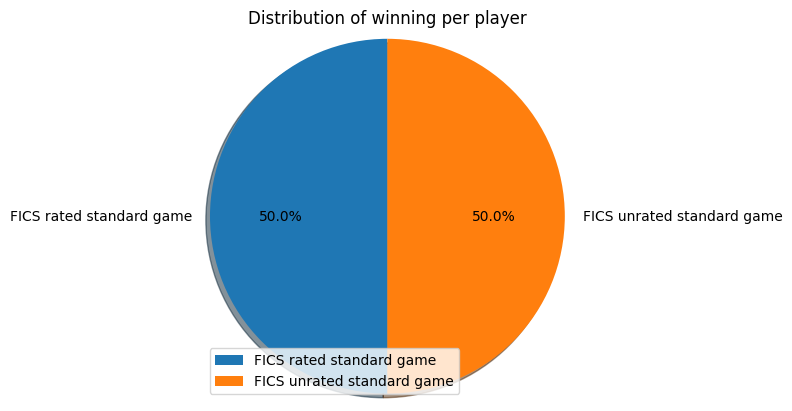

In [16]:
import matplotlib.pyplot as plt


by_event={e:len(df["Event"]==e) for e in list(set(list(df["Event"])))}
# defining labels
activities = list(by_event.keys())

# portion covered by each label
slices = list(by_event.values())

# color for each label
colors = ['r', 'y', 'g', 'b']

# plotting the pie chart
plt.pie(slices, labels = activities,
        startangle=90, shadow = True,
        radius = 1.2, autopct = '%1.1f%%')

# plotting legend
plt.legend()
plt.title("Distribution of winning per player")


# showing the plot
plt.show()


#### Number of games distributions

<BarContainer object of 7 artists>

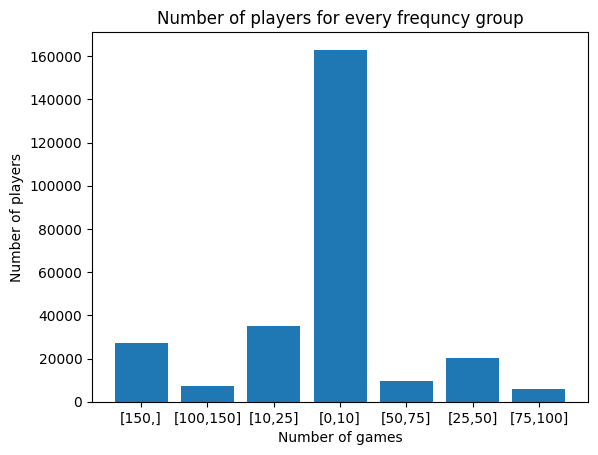

In [18]:
from collections import Counter
white_freq=Counter(list(df["White"]))
black_freq=Counter(list(df["Black"]))
all_freq=white_freq

for k,v in black_freq.items():
    all_freq[k]=all_freq.get(k,0)+v

count_freq={}
for k,v in all_freq.items():
    if v <=10:
        count_freq["[0,10]"]=count_freq.get("[0,10]",0)+1
    elif v <=25:
        count_freq["[10,25]"]=count_freq.get("[10,25]",0)+1
    elif v <=50:
        count_freq["[25,50]"]=count_freq.get("[25,50]",0)+1
    elif v <=75:
        count_freq["[50,75]"]=count_freq.get("[50,75]",0)+1
    elif v <=100:
        count_freq["[75,100]"]=count_freq.get("[75,100]",0)+1
    elif v <=150:
        count_freq["[100,150]"]=count_freq.get("[100,150]",0)+1
    else:
        count_freq["[150,]"]=count_freq.get("[150,]",0)+1

x = list(count_freq.keys())
y = list(count_freq.values())
plt.xlabel('Number of games')
plt.ylabel('Number of players')
plt.title('Number of players for every frequncy group')
plt.bar( x, y)


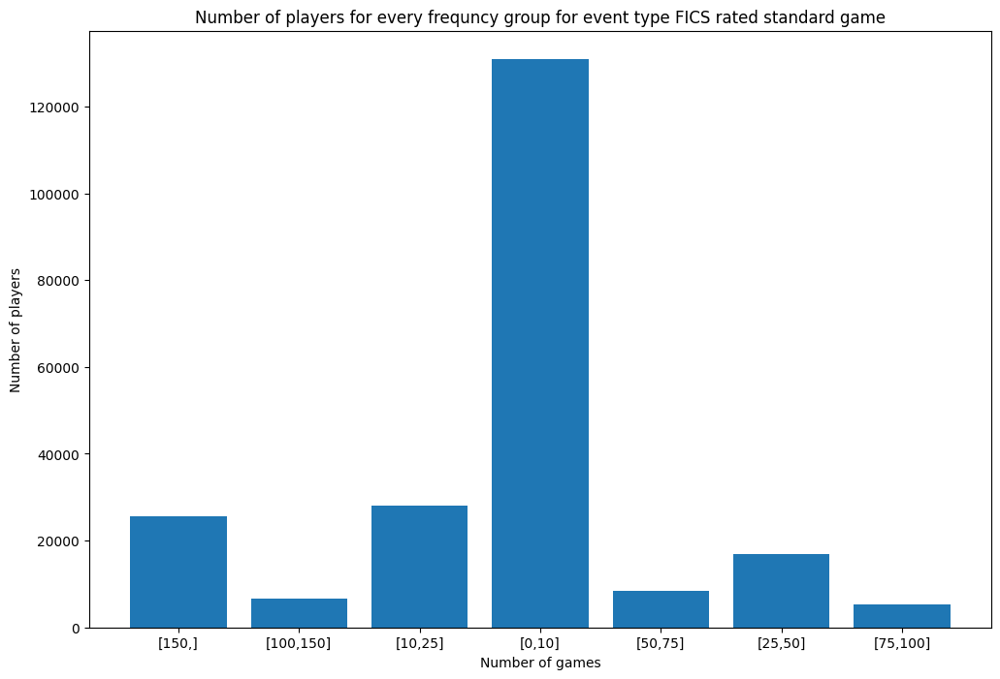

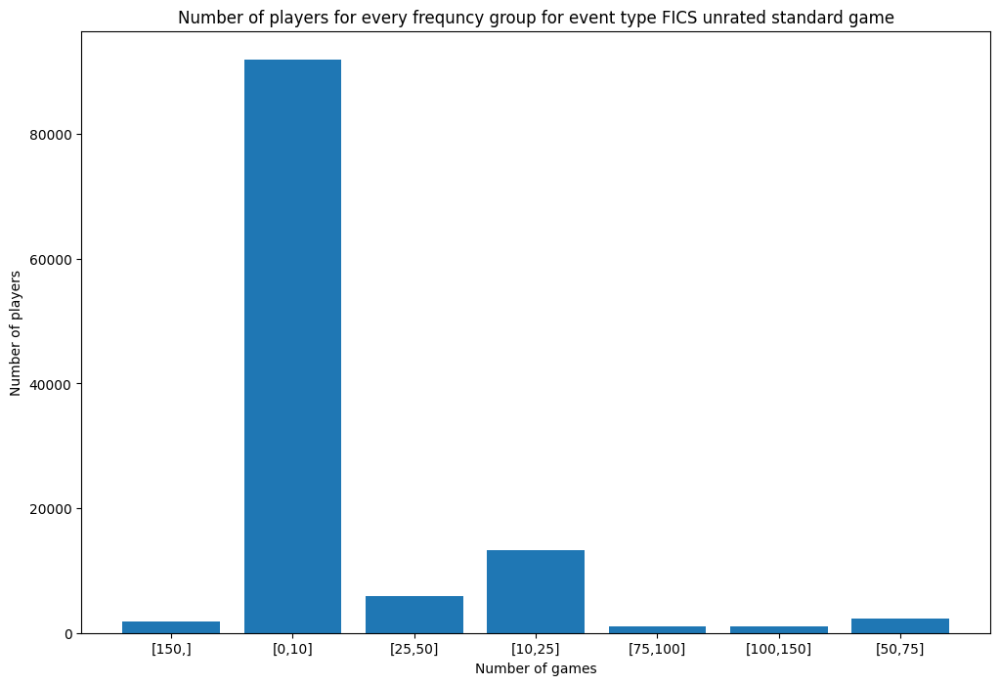

In [19]:
from collections import Counter

events=list(set(list(df["Event"])))


for e in events:
    df_e=df[df["Event"]==e]
    white_freq=Counter(list(df_e["White"]))
    black_freq=Counter(list(df_e["Black"]))
    all_freq=white_freq

    for k,v in black_freq.items():
        all_freq[k]=all_freq.get(k,0)+v

    count_freq={}
    for k,v in all_freq.items():
        if v <=10:
            count_freq["[0,10]"]=count_freq.get("[0,10]",0)+1
        elif v <=25:
            count_freq["[10,25]"]=count_freq.get("[10,25]",0)+1
        elif v <=50:
            count_freq["[25,50]"]=count_freq.get("[25,50]",0)+1
        elif v <=75:
            count_freq["[50,75]"]=count_freq.get("[50,75]",0)+1
        elif v <=100:
            count_freq["[75,100]"]=count_freq.get("[75,100]",0)+1
        elif v <=150:
            count_freq["[100,150]"]=count_freq.get("[100,150]",0)+1
        else:
            count_freq["[150,]"]=count_freq.get("[150,]",0)+1
    plt.figure(figsize=(12, 8))
    x = list(count_freq.keys())
    y = list(count_freq.values())
    plt.xlabel('Number of games')
    plt.ylabel('Number of players')
    plt.title(f'Number of players for every frequncy group for event type {e}')
    plt.bar( x, y)


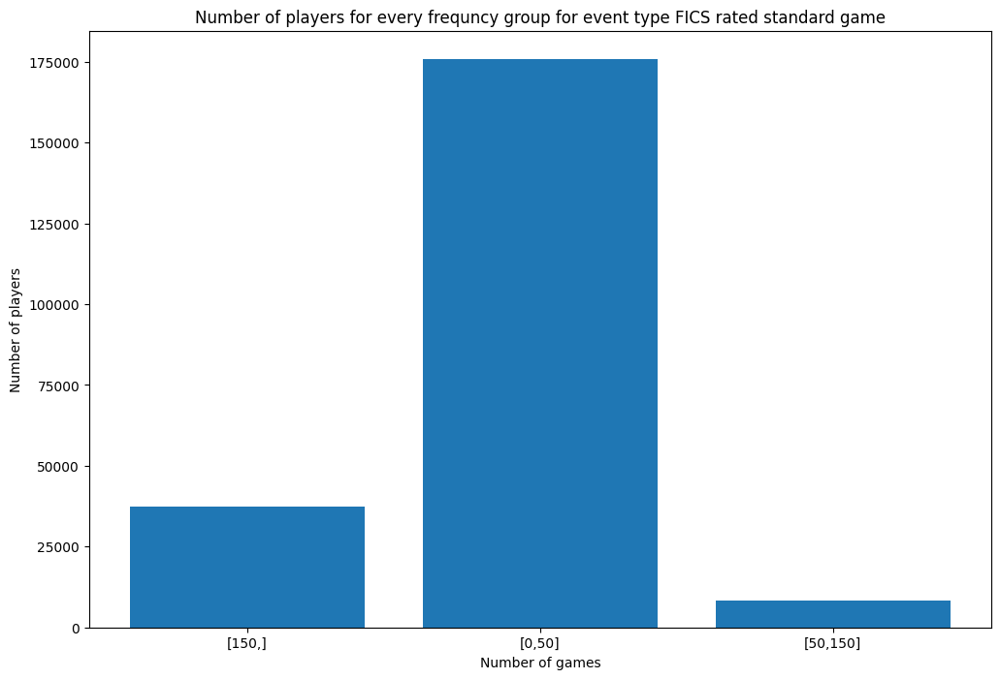

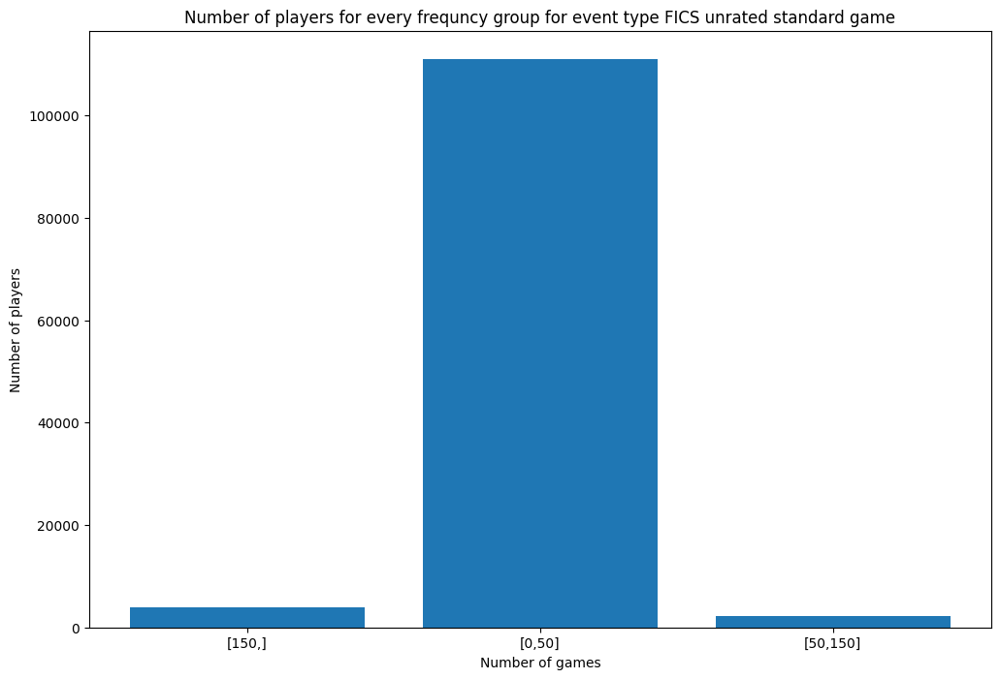

In [20]:
from collections import Counter

events=list(set(list(df["Event"])))


for e in events:
    df_e=df[df["Event"]==e]
    white_freq=Counter(list(df_e["White"]))
    black_freq=Counter(list(df_e["Black"]))
    all_freq=white_freq

    for k,v in black_freq.items():
        all_freq[k]=all_freq.get(k,0)+v

    count_freq={}
    for k,v in all_freq.items():
        if v <=50:
            count_freq["[0,50]"]=count_freq.get("[0,50]",0)+1
        elif v <=75:
            count_freq["[50,150]"]=count_freq.get("[50,150]",0)+1
        else:
            count_freq["[150,]"]=count_freq.get("[150,]",0)+1
    plt.figure(figsize=(12, 8))
    x = list(count_freq.keys())
    y = list(count_freq.values())
    plt.xlabel('Number of games')
    plt.ylabel('Number of players')
    plt.title(f'Number of players for every frequncy group for event type {e}')
    plt.bar( x, y)


### Choose game type to work with

In [62]:
df=read_file("data/fics/dataset_raw/chess-games.csv")

: 

: 

In [ ]:
df=df[df["Event"]=="FICS rated standard game"]
df.to_csv("data/fics/dataset_raw/chess-games-rated.csv")

In [ ]:
df=read_file("data/fics/dataset_raw/chess-games-rated.csv")

In [ ]:
df=df.drop(columns="Event")
df=df.drop(columns="Site")
df=df.drop(columns="Round")
df=df.drop(columns="WhiteIsComp")
df=df.drop(columns="BlackIsComp")
df.to_csv("data/fics/dataset_raw/chess-games-rated-clean.csv")


In [ ]:
df=read_file("data/fics/dataset_raw/chess-games-rated-clean.csv")

In [ ]:
w=dict(df["White"].value_counts())
b=dict(df["Black"].value_counts())
print()
all={}

all=w

for k,v in b.items():
    all[k]=all.get(k,0)+v
h=[]
for k,v in w.items():
    if v>200:
        h.append(k)
len(h)

21374

In [ ]:
df=df[(df["White"].isin(h))|(df["Black"].isin(h))]
df.to_csv("data/fics/dataset_raw/chess-games-rated-clean-filtered.csv")


In [3]:
df=read_file("data/fics/dataset_raw/chess-games-rated-clean-filtered.csv")

In [ ]:
df=df.drop(columns="FICSGamesDBGameNo")

In [4]:
df

,Unnamed: 0,Player,Elo,Date,Time
0,0,Mundt,1602,2022.09.12,08:40:00
1,1,loomba,1901,2022.09.12,08:44:00
2,2,BestMatz,1606,2022.09.12,08:39:00
3,3,rusalka,1618,2022.09.12,08:32:00
4,4,Achonk,1938,2022.09.12,08:47:00
...,...,...,...,...,...
31240388,17287423,IrishPirate,1861,2013.12.12,10:25:00
31240389,17287424,DonatiNair,1775,2013.12.12,10:19:00
31240390,17287425,compaqMayank,1612,2013.12.12,10:01:00
31240391,17287426,mortalaffront,1867,2013.12.12,10:21:00


In [12]:
df.to_csv("data/fics/dataset_raw/chess-games-rated-clean-filtered.csv")


In [5]:
#
try:
    df=df[(df["White"].isin(h))|(df["Black"].isin(h))]

    #
    df1=df[(df["White"].isin(h))&(df["Black"].isin(h))]
    df1=df1[["White","WhiteElo","UTCDate","UTCTime"]].rename(columns={"White":"Player","WhiteElo":"Elo"})

    df2=df[(df["White"].isin(h))&(~df["Black"].isin(h))]
    df2=df2[["White","WhiteElo","UTCDate","UTCTime"]].rename(columns={"White":"Player","WhiteElo":"Elo"})

    #
    df3=df[(~df["White"].isin(h))&(df["Black"].isin(h))]
    df3=df3[["Black","BlackElo","UTCDate","UTCTime"]].rename(columns={"Black":"Player","BlackElo":"Elo"})

    #
    df4=df[(df["White"].isin(h))&(df["Black"].isin(h))]
    df4=df4[["Black","BlackElo","UTCDate","UTCTime"]].rename(columns={"Black":"Player","BlackElo":"Elo"})

    #
    df=pd.concat([df1,df2,df3,df4])
except Exception as err:
    df=df[(df["White"].isin(h))|(df["Black"].isin(h))]

    #
    df1=df[(df["White"].isin(h))&(df["Black"].isin(h))]
    df1=df1[["White","WhiteElo","Date","Time"]].rename(columns={"White":"Player","WhiteElo":"Elo"})

    df2=df[(df["White"].isin(h))&(~df["Black"].isin(h))]
    df2=df2[["White","WhiteElo","Date","Time"]].rename(columns={"White":"Player","WhiteElo":"Elo"})

    #
    df3=df[(~df["White"].isin(h))&(df["Black"].isin(h))]
    df3=df3[["Black","BlackElo","Date","Time"]].rename(columns={"Black":"Player","BlackElo":"Elo"})

    #
    df4=df[(df["White"].isin(h))&(df["Black"].isin(h))]
    df4=df4[["Black","BlackElo","Date","Time"]].rename(columns={"Black":"Player","BlackElo":"Elo"})

    #
    df=pd.concat([df1,df2,df3,df4])


KeyError: 'White'

In [7]:
df.to_csv("data/fics/dataset_raw/chess-games-rated-clean-filtered.csv")


In [11]:
df["Year"]=df["Date"].apply(lambda r:int(r.split(".")[0]))
df["Month"]=df["Date"].apply(lambda r:int(r.split(".")[1]))
df["Day"]=df["Date"].apply(lambda r:int(r.split(".")[2]))
df=df[df["Year"]>=2015]
df=df[df["Year"]<=2019]


In [13]:
df.to_csv("data/fics/dataset_raw/chess-games-rated-clean-filtered-2015-2019.csv")


In [14]:
players_freq=dict(df["Player"].value_counts())
players=[]

for k,v in players_freq.items():
    if v>200:
        players.append(k)


In [15]:
len(players)

6329

In [16]:
df=df[(df["Player"].isin(players))]
df.to_csv("data/fics/dataset_raw/chess-games-rated-clean-filtered-2015-2019.csv")


In [17]:
len(df)

9202889

In [18]:
players=list(set(df["Player"]))
players_dict = {p: df[df['Player'] == p] for p in tqdm(players)}

100%|██████████| 6329/6329 [24:59<00:00,  4.22it/s]


In [19]:
with open("data/fics/dataset_raw/players_dict.pkl", 'wb') as f:
    pickle.dump(players_dict, f)

In [21]:
# order dates
for k,v in tqdm(players_dict.items()):
    curr=players_dict[k]
    curr["Timestamp"]=(curr["Date"]+" "+curr["Time"]).apply(lambda r:date_to_num(r))
    curr=curr.sort_values(by="Timestamp")
    players_dict[k]=curr.reset_index().drop(columns="index")



100%|██████████| 6329/6329 [00:40<00:00, 156.03it/s]


In [22]:
with open("data/fics/dataset_raw/players_dict.pkl", 'wb') as f:
    pickle.dump(players_dict, f)

In [23]:
with open("data/fics/dataset_raw/players_dict.pkl", 'rb') as f:
    players_dict=pickle.load( f)

In [24]:
for k,v in tqdm(players_dict.items()):
   players_dict[k]=players_dict[k][["Elo","Timestamp"]]

100%|██████████| 6329/6329 [00:01<00:00, 5572.17it/s]


## Cluster

In [25]:
def get_samples(players_dict,offset,num_samples):
    samples={}
    for p in players_dict:
        v=players_dict[p]
        samples[p]=list(v[(v.index<=offset+num_samples)&(v.index>=offset)]["Elo"])
    return samples

def dp(dist_mat):
    """
    Find minimum-cost path through matrix `dist_mat` using dynamic programming.

    The cost of a path is defined as the sum of the matrix entries on that
    path. See the following for details of the algorithm:

    - http://en.wikipedia.org/wiki/Dynamic_time_warping
    - https://www.ee.columbia.edu/~dpwe/resources/matlab/dtw/dp.m

    The notation in the first reference was followed, while Dan Ellis's code
    (second reference) was used to check for correctness. Returns a list of
    path indices and the cost matrix.
    """

    N, M = dist_mat.shape

    # Initialize the cost matrix
    cost_mat = np.zeros((N + 1, M + 1))
    for i in range(1, N + 1):
        cost_mat[i, 0] = np.inf
    for i in range(1, M + 1):
        cost_mat[0, i] = np.inf

    # Fill the cost matrix while keeping traceback information
    traceback_mat = np.zeros((N, M))
    for i in range(N):
        for j in range(M):
            penalty = [
                cost_mat[i, j],      # match (0)
                cost_mat[i, j + 1],  # insertion (1)
                cost_mat[i + 1, j]]  # deletion (2)
            i_penalty = np.argmin(penalty)
            cost_mat[i + 1, j + 1] = dist_mat[i, j] + penalty[i_penalty]
            traceback_mat[i, j] = i_penalty

    # Traceback from bottom right
    i = N - 1
    j = M - 1
    path = [(i, j)]
    while i > 0 or j > 0:
        tb_type = traceback_mat[i, j]
        if tb_type == 0:
            # Match
            i = i - 1
            j = j - 1
        elif tb_type == 1:
            # Insertion
            i = i - 1
        elif tb_type == 2:
            # Deletion
            j = j - 1
        path.append((i, j))

    # Strip infinity edges from cost_mat before returning
    cost_mat = cost_mat[1:, 1:]
    return (path[::-1], cost_mat)


def kmeans_silhoutte(X_train,metric,max_k=10):
    silhoutte_score = []
    for i in range(2,max_k):
        start = time.time()
        model= TimeSeriesKMeans(n_clusters=i,metric=metric,n_jobs=-1,random_state=0)
        y_pred = model.fit_predict(X_train)
        score = silhouette_score(X_train, y_pred, metric=metric)
        silhoutte_score.append(score)
        stop = time.time()
        duration = stop - start
        print(f"K = {i}.", f"Took {duration:.2f} seconds to calculate.")

    return silhoutte_score

def kmeans_calinski_harabasz(X_train,metric,max_k=10):
    scores = []
    for i in range(2,max_k):
        start = time.time()
        model= TimeSeriesKMeans(n_clusters=i,metric=metric,n_jobs=-1,random_state=0)
        y_pred = model.fit_predict(X_train)
        score = metrics.calinski_harabasz_score(X_ss, y_pred_ss)
        scores.append(score)
        stop = time.time()
        duration = stop - start
        print(f"K = {i}.", f"Took {duration:.2f} seconds to calculate.")

    return scores



def kmeans_wcsss(X_train,metric,max_k=10):
    wcss = []
    for i in range(2,max_k):
        start = time.time()
        model= TimeSeriesKMeans(n_clusters=i,metric=metric,n_jobs=-1,random_state=0)
        model.fit_predict(X_train)
        wcss.append(model.inertia_)
        stop = time.time()
        duration = stop - start
        print(f"K = {i}.", f"Took {duration:.2f} seconds to calculate.")
    return wcss

def kmeans_cluster(n_clusters,algo,X_train,metric):
    model= TimeSeriesKMeans(n_clusters=n_clusters,
                        metric=metric,
                        n_jobs=-1,
                        random_state=0)
    y_pred = model.fit_predict(X_train)
    model.to_pickle(f"./tsl/models/{algo}.pkl")



    for yi in range(len(np.unique(y_pred))):
      for xx in X_train[y_pred == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)


      plt.plot(model.cluster_centers_[yi].ravel(), "r-")
      plt.xlim(0, X_train.shape[1])
      plt.ylim(-5, 5)
      plt.text(0.55, 0.85,'Cluster %d' % (yi + 1), transform=plt.gca().transAxes)
      plt.title("kmeans")
      plt.tight_layout()
      plt.show();


    for i in range(len(np.unique(y_pred))):
      count = (sum(y_pred == i)/len(y_pred))*100
      print(f"The {count:.2f}% of the observations fall into Cluster {i + 1}")

    return y_pred

In [26]:
# create required directory structure
dir_paths = ['./tsl', './tsl/models', './tsl/plots']

for dir_path in dir_paths:
    if not os.path.exists(dir_path):
        os.makedirs(dir_path)

In [34]:

df_c=(df[df["Event"]==" Blitz "])
w=dict(df_c["White"].value_counts())
b=dict(df_c["Black"].value_counts())

all={}

all=w

for k,v in b.items():
    all[k]=all.get(k,0)+v
h=[]
for k,v in w.items():
    if v>200:
        h.append(k)
len(h)

KeyError: 'Event'

In [ ]:
#
df=df[(df["White"].isin(h))|(df["Black"].isin(h))]

#
df1=df[(df["White"].isin(h))&(df["Black"].isin(h))]
df1=df1[["White","WhiteElo","UTCDate","UTCTime"]].rename(columns={"White":"Player","WhiteElo":"Elo"})

df2=df[(df["White"].isin(h))&(~df["Black"].isin(h))]
df2=df2[["White","WhiteElo","UTCDate","UTCTime"]].rename(columns={"White":"Player","WhiteElo":"Elo"})

#
df3=df[(~df["White"].isin(h))&(df["Black"].isin(h))]
df3=df3[["Black","BlackElo","UTCDate","UTCTime"]].rename(columns={"Black":"Player","BlackElo":"Elo"})

#
df4=df[(df["White"].isin(h))&(df["Black"].isin(h))]
df4=df4[["Black","BlackElo","UTCDate","UTCTime"]].rename(columns={"Black":"Player","BlackElo":"Elo"})

#
df=pd.concat([df1,df2,df3,df4])

In [ ]:
players=list(set(df["Player"]))
players_dict = {p: df[df['Player'] == p] for p in tqdm(players)}

100%|███████████████████████████████████████| 6798/6798 [15:09<00:00,  7.47it/s]


In [ ]:
with open("data/lichess/dataset_raw/players_dict.pkl", 'wb') as f:
    pickle.dump(players_dict, f)

In [ ]:
# order dates
for k,v in tqdm(players_dict.items()):
    curr=players_dict[k]
    curr["Timestamp"]=(curr["UTCDate"]+" "+curr["UTCTime"]).apply(lambda r:date_to_num(r))
    curr=curr.sort_values(by="Timestamp")
    players_dict[k]=curr.reset_index().drop(columns="index")



100%|██████████████████████████████████████| 6798/6798 [00:14<00:00, 456.07it/s]


In [ ]:
with open("data/lichess/dataset_raw/players_dict.pkl", 'wb') as f:
    pickle.dump(players_dict, f)

In [8]:
with open("data/lichess/dataset_raw/players_dict.pkl", 'rb') as f:
    players_dict=pickle.load( f)

In [ ]:
for k,v in tqdm(players_dict.items()):
   players_dict[k]=players_dict[k][["Elo","Timestamp"]]

100%|█████████████████████████████████████| 6798/6798 [00:00<00:00, 7571.80it/s]


In [6]:
def get_samples(players_dict,offset,num_samples):
    samples={}
    for p in players_dict:
        try:
            v=players_dict[p]
            arr=list(v[(v.index<offset+num_samples)&(v.index>=offset)]["Elo"])
            samples[p]=arr
        except Exception as err:
            print(err)
            pass
        
    for p in list(samples.keys()):
        if len(samples[p])!=num_samples:
            del samples[p]

    
    return samples

def dp(dist_mat):
    """
    Find minimum-cost path through matrix `dist_mat` using dynamic programming.

    The cost of a path is defined as the sum of the matrix entries on that
    path. See the following for details of the algorithm:

    - http://en.wikipedia.org/wiki/Dynamic_time_warping
    - https://www.ee.columbia.edu/~dpwe/resources/matlab/dtw/dp.m

    The notation in the first reference was followed, while Dan Ellis's code
    (second reference) was used to check for correctness. Returns a list of
    path indices and the cost matrix.
    """

    N, M = dist_mat.shape

    # Initialize the cost matrix
    cost_mat = np.zeros((N + 1, M + 1))
    for i in range(1, N + 1):
        cost_mat[i, 0] = np.inf
    for i in range(1, M + 1):
        cost_mat[0, i] = np.inf

    # Fill the cost matrix while keeping traceback information
    traceback_mat = np.zeros((N, M))
    for i in range(N):
        for j in range(M):
            penalty = [
                cost_mat[i, j],      # match (0)
                cost_mat[i, j + 1],  # insertion (1)
                cost_mat[i + 1, j]]  # deletion (2)
            i_penalty = np.argmin(penalty)
            cost_mat[i + 1, j + 1] = dist_mat[i, j] + penalty[i_penalty]
            traceback_mat[i, j] = i_penalty

    # Traceback from bottom right
    i = N - 1
    j = M - 1
    path = [(i, j)]
    while i > 0 or j > 0:
        tb_type = traceback_mat[i, j]
        if tb_type == 0:
            # Match
            i = i - 1
            j = j - 1
        elif tb_type == 1:
            # Insertion
            i = i - 1
        elif tb_type == 2:
            # Deletion
            j = j - 1
        path.append((i, j))

    # Strip infinity edges from cost_mat before returning
    cost_mat = cost_mat[1:, 1:]
    return (path[::-1], cost_mat)


def kmeans_silhoutte(X_train,metric,max_k=10):
    silhoutte_score = []
    for i in range(2,max_k):
        start = time.time()
        model= TimeSeriesKMeans(n_clusters=i,metric=metric,n_jobs=-1,random_state=0)
        y_pred = model.fit_predict(X_train)
        score = silhouette_score(X_train, y_pred, metric=metric)
        silhoutte_score.append(score)
        stop = time.time()
        duration = stop - start
        print(f"K = {i}.", f"Took {duration:.2f} seconds to calculate.")

    return silhoutte_score

def kmeans_calinski_harabasz(X_train,metric,max_k=10):
    scores = []
    for i in range(2,max_k):
        start = time.time()
        model= TimeSeriesKMeans(n_clusters=i,metric=metric,n_jobs=-1,random_state=0)
        y_pred = model.fit_predict(X_train)
        score = metrics.calinski_harabasz_score(X_ss, y_pred_ss)
        scores.append(score)
        stop = time.time()
        duration = stop - start
        print(f"K = {i}.", f"Took {duration:.2f} seconds to calculate.")

    return scores



def kmeans_wcsss(X_train,metric,max_k=10):
    wcss = []
    for i in range(2,max_k):
        start = time.time()
        model= TimeSeriesKMeans(n_clusters=i,metric=metric,n_jobs=-1,random_state=0)
        model.fit_predict(X_train)
        print(model.inertia_)
        wcss.append(model.inertia_)
        stop = time.time()
        duration = stop - start
        print(f"K = {i}.", f"Took {duration:.2f} seconds to calculate.")
    return wcss

def kmeans_cluster(n_clusters,algo,X_train,metric):
    model= TimeSeriesKMeans(n_clusters=n_clusters,
                        metric=metric,
                        n_jobs=-1,
                        random_state=0)
    y_pred = model.fit_predict(X_train)
    model.to_pickle(f"./tsl/models/{algo}.pkl")



    for yi in range(len(np.unique(y_pred))):
      for xx in X_train[y_pred == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)


      plt.plot(model.cluster_centers_[yi].ravel(), "r-")
      plt.xlim(0, X_train.shape[1])
      plt.ylim(-5, 5)
      plt.text(0.55, 0.85,'Cluster %d' % (yi + 1), transform=plt.gca().transAxes)
      plt.title("kmeans")
      plt.tight_layout()
      plt.show();


    for i in range(len(np.unique(y_pred))):
      count = (sum(y_pred == i)/len(y_pred))*100
      print(f"The {count:.2f}% of the observations fall into Cluster {i + 1}")

    return y_pred

In [44]:
# create required directory structure
dir_paths = ['./tsl', './tsl/models', './tsl/plots']

for dir_path in dir_paths:
    if not os.path.exists(dir_path):
        os.makedirs(dir_path)

In [31]:
players_dict

{'ZWIIT':       Elo     Timestamp
 0    1720  1.457407e+09
 1    1867  1.457407e+09
 2    1701  1.457408e+09
 3    1805  1.457410e+09
 4    1812  1.457413e+09
 ..    ...           ...
 342  1629  1.490862e+09
 343  1622  1.491589e+09
 344  1623  1.491591e+09
 345  1615  1.491593e+09
 346  1623  1.491595e+09
 
 [347 rows x 2 columns],
 'malick':       Elo     Timestamp
 0    1637  1.420086e+09
 1    1622  1.420086e+09
 2    1611  1.420215e+09
 3    1621  1.421384e+09
 4    1607  1.421385e+09
 ..    ...           ...
 450  1824  1.577608e+09
 451  1817  1.577712e+09
 452  1818  1.577713e+09
 453  1827  1.577794e+09
 454  1820  1.577795e+09
 
 [455 rows x 2 columns],
 'belberg':       Elo     Timestamp
 0    1380  1.420212e+09
 1    1395  1.421049e+09
 2    1376  1.421050e+09
 3    1366  1.421055e+09
 4    1385  1.421126e+09
 ..    ...           ...
 359  1584  1.573141e+09
 360  1565  1.573144e+09
 361  1572  1.573366e+09
 362  1593  1.574417e+09
 363  1598  1.575784e+09
 
 [364 rows x 2

## length 10 timeseries

In [42]:
samples={}
for p in players_dict:
    v=players_dict[p]
    arr=list(v[(v.index<50+10)&(v.index>=10)]["Elo"])
    samples[p]=arr
    print(len(samples[p]))


50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
50
5

In [36]:
len(samples)

6329

In [43]:
df=pd.DataFrame.from_dict(get_samples(players_dict,50,10)).T
df

,0,1,2,3,4,5,6,7,8,9
ZWIIT,1494,1484,1497,1509,1497,1496,1507,1524,1517,1536
malick,1636,1640,1633,1621,1610,1617,1628,1635,1640,1631
belberg,1411,1401,1393,1404,1424,1404,1389,1378,1370,1357
mjcool,1337,1334,1346,1344,1339,1334,1330,1327,1321,1315
zansirak,1583,1570,1560,1556,1543,1530,1528,1518,1506,1496
...,...,...,...,...,...,...,...,...,...,...
bellotob,1536,1533,1529,1537,1533,1542,1552,1549,1551,1550
Chessbroker,1654,1663,1668,1657,1665,1654,1663,1670,1674,1680
hannick,1663,1654,1643,1650,1663,1674,1682,1693,1707,1694
Codymaurice,1496,1502,1497,1510,1509,1505,1515,1506,1516,1512


In [44]:

%%time

# Standardizing (z-score normalization) a dataset involves rescaling the distribution of values
ss = StandardScaler()

scaled_ss = ss.fit_transform(df.T)
df_ss = pd.DataFrame(scaled_ss.T, columns=df.columns, index=df.index)
X_ss = df_ss.values
display(df_ss.head())

# Normalization
mm = MinMaxScaler()
scaled_mm = mm.fit_transform(df.T)
df_mm = pd.DataFrame(scaled_mm.T, columns=df.columns, index=df.index)
X_mm = df_mm.values
display(df_mm.head())


# convert dataframe to time_series_dataset
X = to_time_series_dataset(df.values)

# normalize time series to zero mean and unit variance
X_train = TimeSeriesScalerMeanVariance().fit_transform(X)

print(X.shape, X_train.shape)

,0,1,2,3,4,5,6,7,8,9
ZWIIT,-0.807582,-1.475006,-0.607355,0.193553,-0.607355,-0.674098,0.060068,1.194688,0.727492,1.995596
malick,0.720590,1.138323,0.407290,-0.845910,-1.994676,-1.263643,-0.114877,0.616156,1.138323,0.198423
belberg,0.936044,0.413115,-0.005229,0.569994,1.615853,0.569994,-0.214401,-0.789624,-1.207968,-1.887777
mjcool,0.464736,0.140502,1.437439,1.221283,0.680892,0.140502,-0.291811,-0.616045,-1.264514,-1.912983
zansirak,1.637057,1.153381,0.781323,0.632499,0.148823,-0.334853,-0.409264,-0.781323,-1.227793,-1.599851


,0,1,2,3,4,5,6,7,8,9
ZWIIT,0.192308,0.000000,0.250000,0.480769,0.250000,0.230769,0.442308,0.769231,0.634615,1.0
malick,0.866667,1.000000,0.766667,0.366667,0.000000,0.233333,0.600000,0.833333,1.000000,0.7
belberg,0.805970,0.656716,0.537313,0.701493,1.000000,0.701493,0.477612,0.313433,0.194030,0.0
mjcool,0.709677,0.612903,1.000000,0.935484,0.774194,0.612903,0.483871,0.387097,0.193548,0.0
zansirak,1.000000,0.850575,0.735632,0.689655,0.540230,0.390805,0.367816,0.252874,0.114943,0.0


(6329, 10, 1) (6329, 10, 1)
CPU times: user 525 ms, sys: 1e+03 ns, total: 525 ms
Wall time: 524 ms


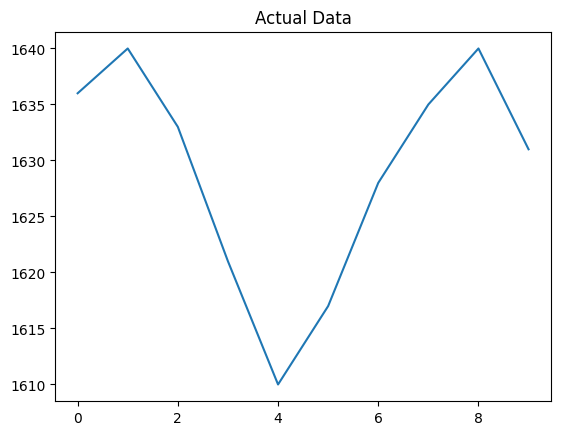

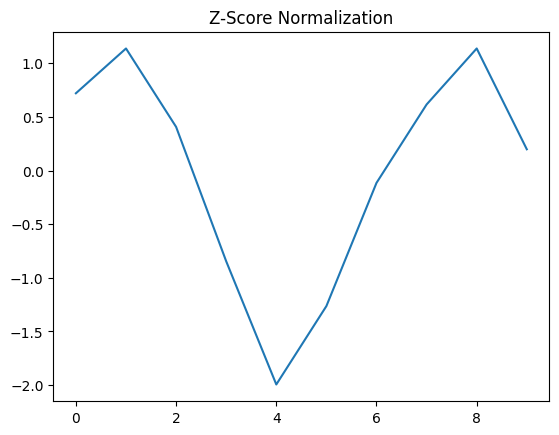

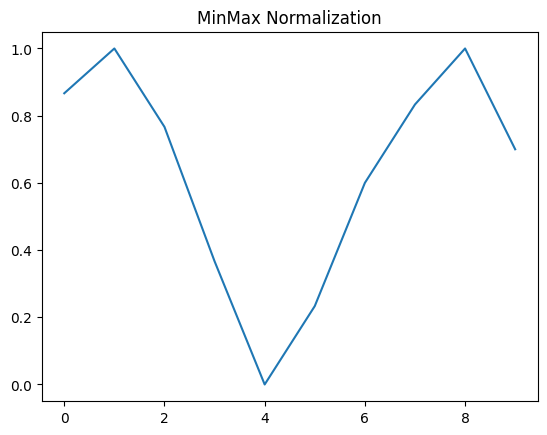

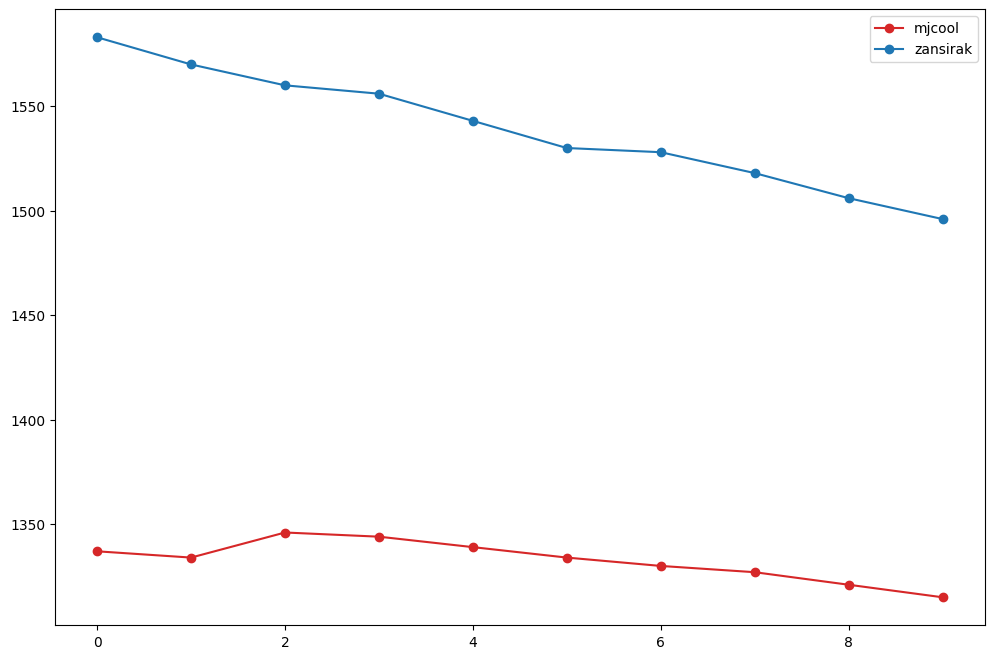

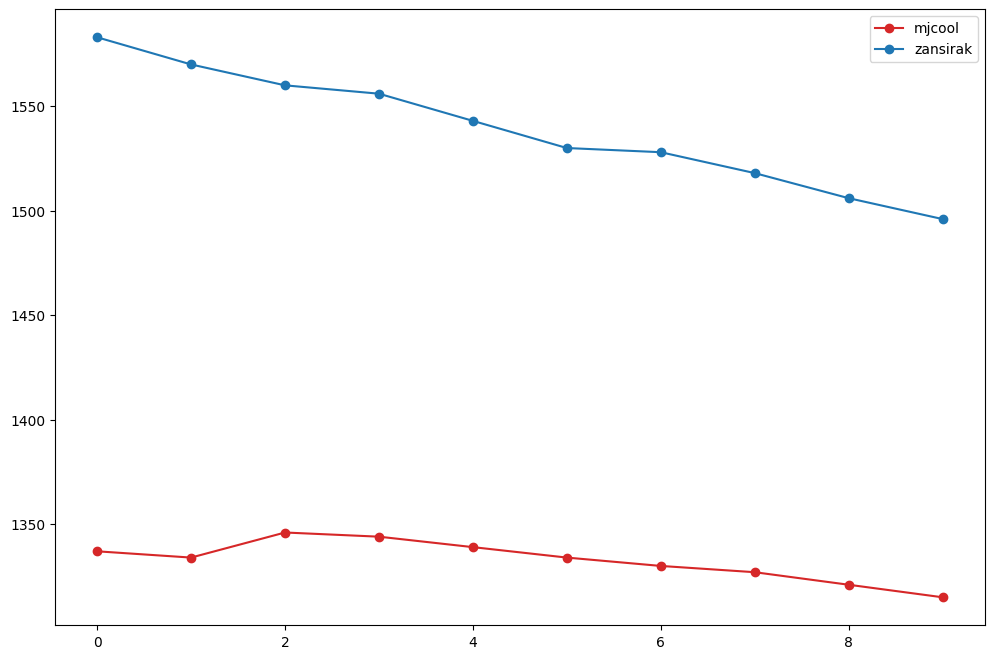

In [47]:
# Select a product Id to compare normal data with scaled data
product = "malick"

# Visualize the sales (qty) for the product
df.loc[product].plot(title="Actual Data"), plt.show()
df_ss.loc[product].plot(title="Z-Score Normalization"), plt.show()
df_mm.loc[product].plot(title="MinMax Normalization"), plt.show();


x = df.loc["mjcool"]
y = df.loc["zansirak"]

plt.figure(figsize=(12, 8))
plt.plot(x, "-o", c="C3")
plt.plot(y, "-o", c="C0")
plt.legend([x.name, y.name]);

# Select moving average sales
w = df.loc["mjcool"]
z = df.loc["zansirak"]

plt.figure(figsize=(12, 8))
plt.plot(w, "-o", c="C3")
plt.plot(z, "-o", c="C0")
plt.legend([w.name, z.name]);

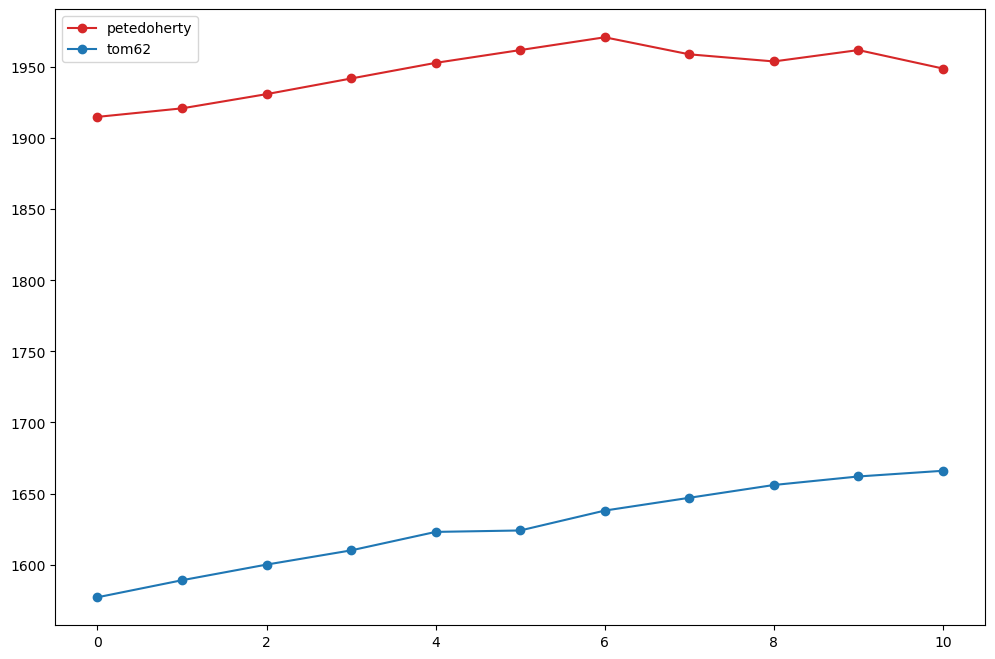

Alignment cost: 2063.0000
Normalized alignment cost: 103.1500


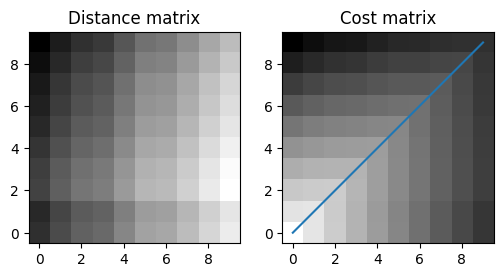

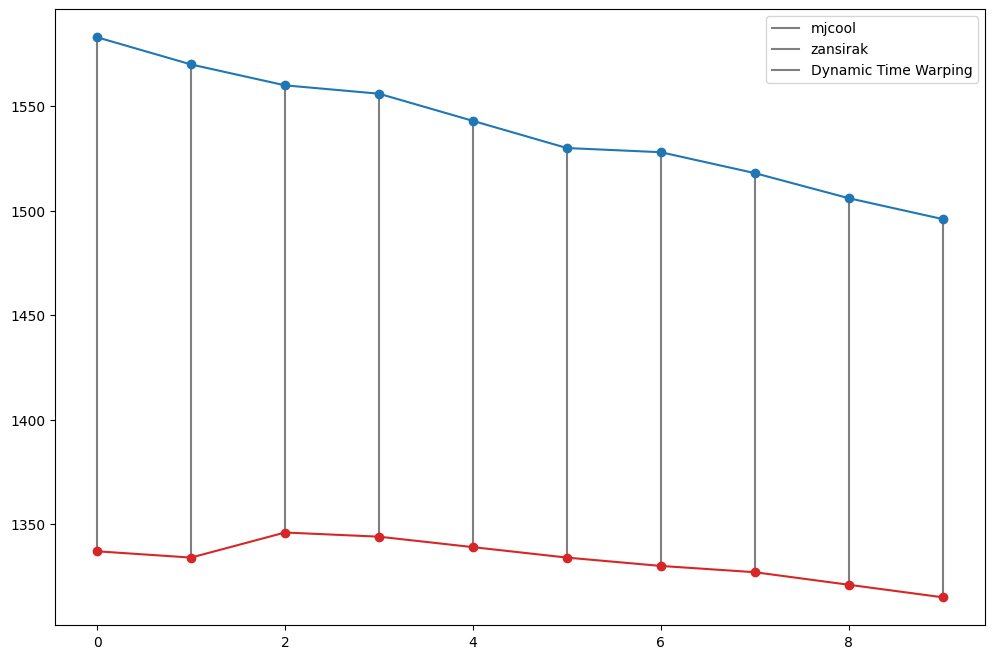

In [50]:
# Distance matrix
N = w.shape[0]
M = z.shape[0]
dist_mat = np.zeros((N, M))
for i in range(N):
    for j in range(M):
        dist_mat[i, j] = abs(x[i] - y[j])


# DTW
path, cost_mat = dp(dist_mat)
print("Alignment cost: {:.4f}".format(cost_mat[N - 1, M - 1]))
print("Normalized alignment cost: {:.4f}".format(cost_mat[N - 1, M - 1]/(N + M)))

plt.figure(figsize=(6, 4))
plt.subplot(121)
plt.title("Distance matrix")
plt.imshow(dist_mat, cmap=plt.cm.binary, interpolation="nearest", origin="lower")
plt.subplot(122)
plt.title("Cost matrix")
plt.imshow(cost_mat, cmap=plt.cm.binary, interpolation="nearest", origin="lower")
x_path, y_path = zip(*path)
plt.plot(y_path, x_path);

plt.figure(figsize=(12, 8))
for x_i, y_j in path:
    plt.plot([x_i, y_j], [w[x_i], z[y_j]], c="C7")
plt.plot(np.arange(w.shape[0]), w, "-o", c="C3")
plt.plot(np.arange(z.shape[0]), z, "-o", c="C0")
plt.legend([w.name, z.name, "Dynamic Time Warping"]);

#### dtw & normalized & wcsss

In [51]:
# dtw
wcss=kmeans_wcsss(X_train,"dtw",20)
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,20),wcss,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('WCSSS');
plt.title("WCSSS analysis For Optimal K and Optimal Model")

KeyboardInterrupt: 

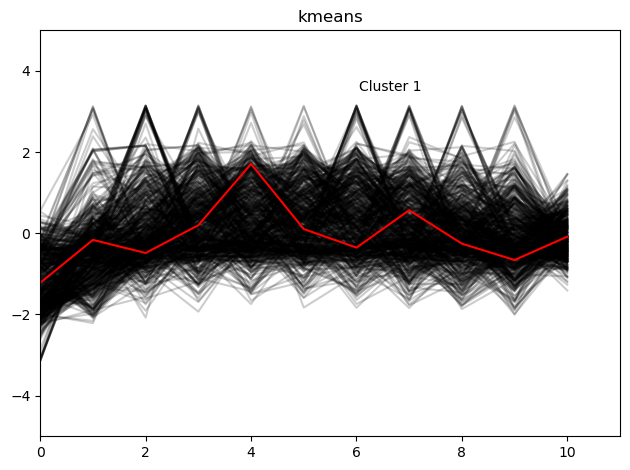

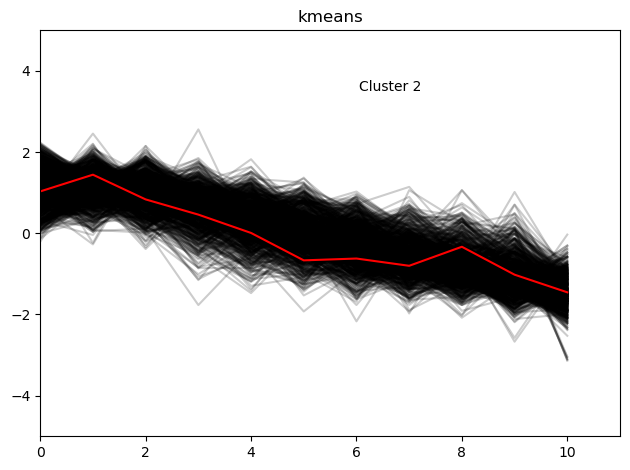

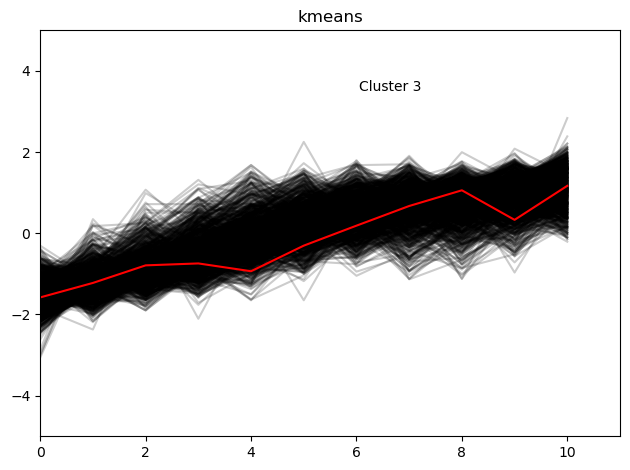

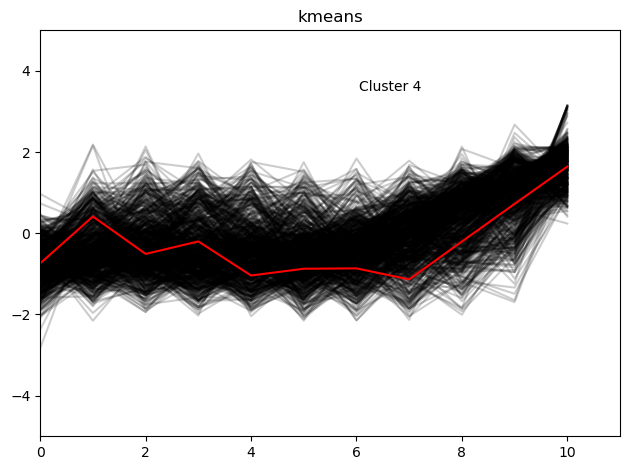

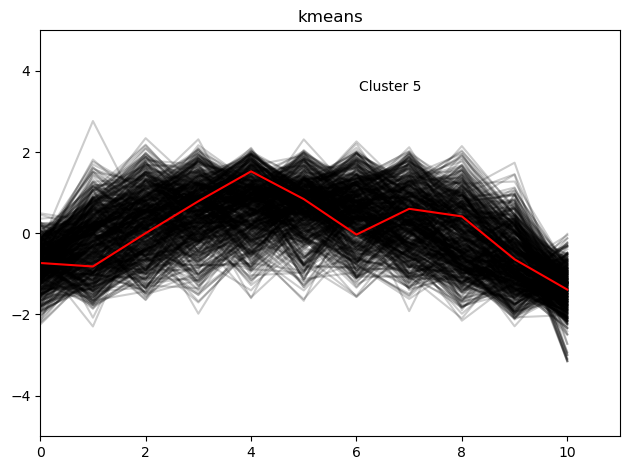

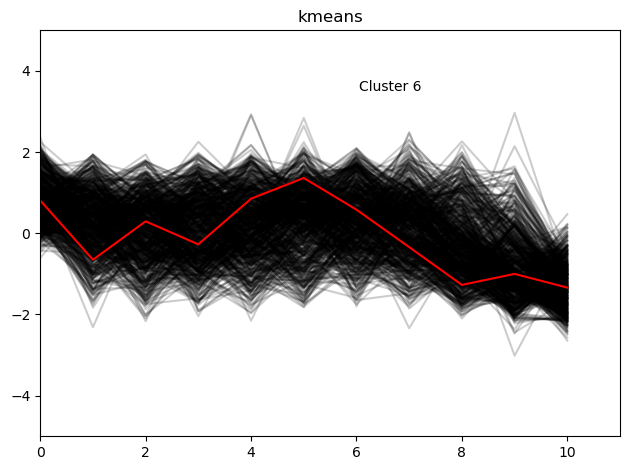

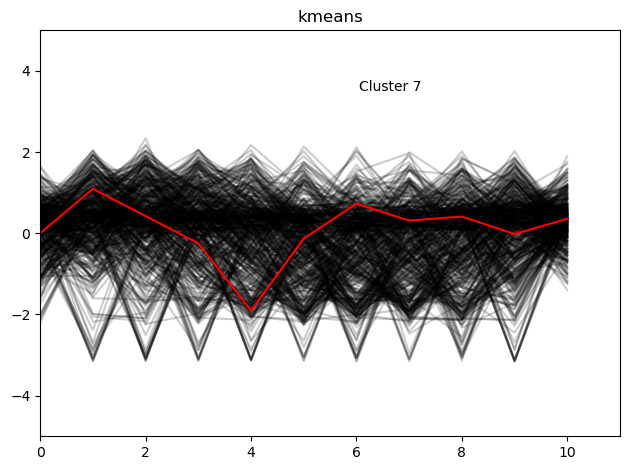

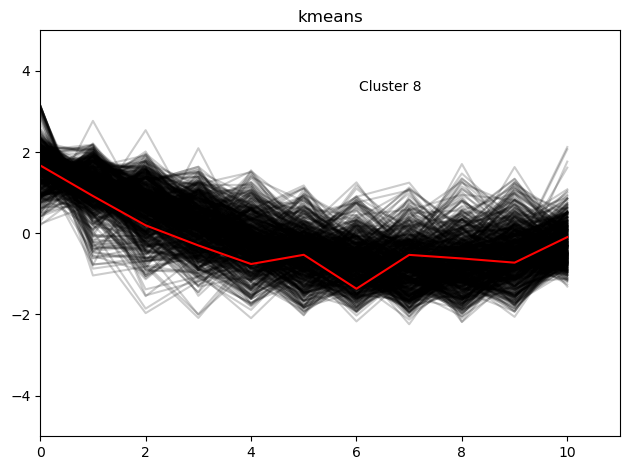

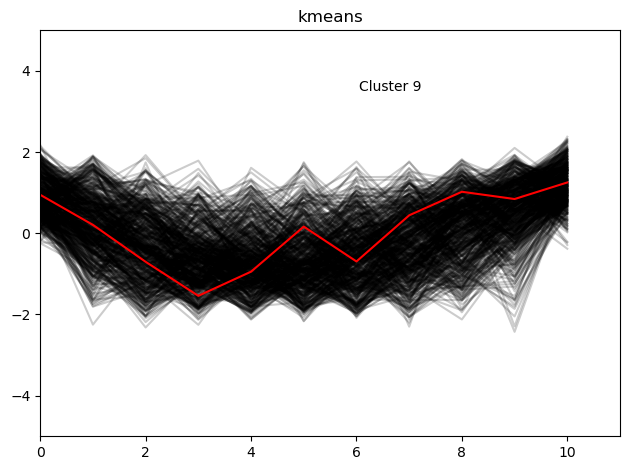

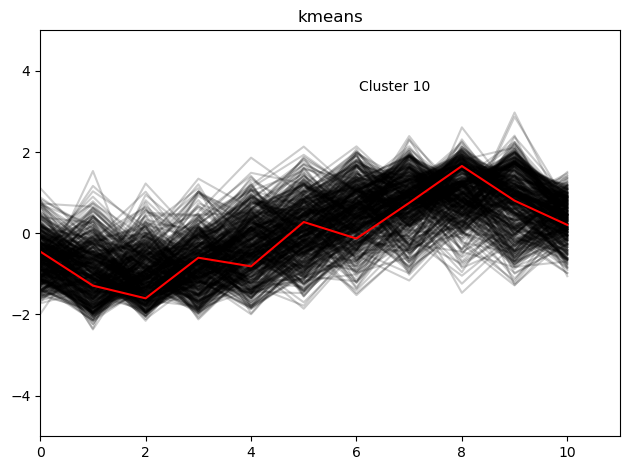

The 8.53% of the observations fall into Cluster 1
The 13.37% of the observations fall into Cluster 2
The 14.75% of the observations fall into Cluster 3
The 10.87% of the observations fall into Cluster 4
The 8.78% of the observations fall into Cluster 5
The 10.47% of the observations fall into Cluster 6
The 7.31% of the observations fall into Cluster 7
The 10.40% of the observations fall into Cluster 8
The 8.46% of the observations fall into Cluster 9
The 7.05% of the observations fall into Cluster 10


array([2, 2, 0, ..., 8, 9, 9])

In [ ]:
labels=kmeans_cluster(10,"kmeans_dtw_10",X_train,"dtw")
df["kmeans_dtw"]=labels

#### softdtw & normalized  & wcsss

In [ ]:
# softdtw
wcss=kmeans_wcsss(X_train,"softdtw",20)
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,20),wcss,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('WCSSS');
plt.title("WCSSS analysis For Optimal K and Optimal Model")

K = 2. Took 167.25 seconds to calculate.


In [ ]:
kmeans_cluster(4,"kmeans_softdtw_10",X_train,"softdtw")

#### euclidean & normalized  & wcsss

K = 2. Took 1.84 seconds to calculate.
K = 3. Took 3.94 seconds to calculate.
K = 4. Took 5.48 seconds to calculate.
K = 5. Took 6.32 seconds to calculate.
K = 6. Took 7.69 seconds to calculate.
K = 7. Took 6.03 seconds to calculate.
K = 8. Took 7.80 seconds to calculate.
K = 9. Took 7.85 seconds to calculate.
K = 10. Took 7.60 seconds to calculate.
K = 11. Took 7.82 seconds to calculate.
K = 12. Took 7.81 seconds to calculate.
K = 13. Took 7.89 seconds to calculate.
K = 14. Took 7.85 seconds to calculate.
K = 15. Took 7.61 seconds to calculate.
K = 16. Took 7.55 seconds to calculate.
K = 17. Took 7.89 seconds to calculate.
K = 18. Took 7.13 seconds to calculate.
K = 19. Took 7.88 seconds to calculate.
K = 20. Took 6.93 seconds to calculate.
K = 21. Took 7.94 seconds to calculate.
K = 22. Took 7.93 seconds to calculate.
K = 23. Took 6.10 seconds to calculate.
K = 24. Took 5.82 seconds to calculate.
K = 25. Took 7.91 seconds to calculate.
K = 26. Took 6.23 seconds to calculate.
K = 27. 

Text(0.5, 1.0, 'WCSSS analysis For Optimal K and Optimal Model')

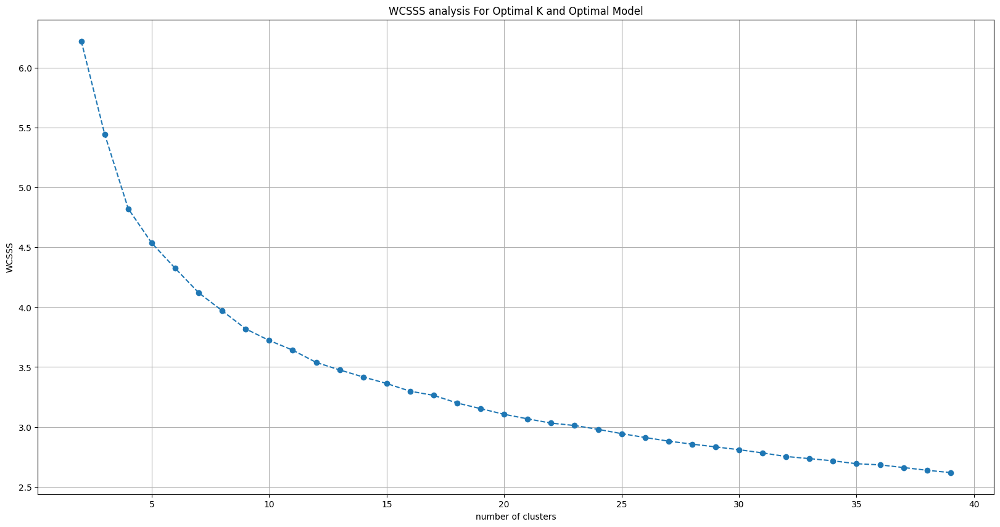

In [52]:
# dtw
wcss=kmeans_wcsss(X_train,"euclidean",40)
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,40),wcss,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('WCSSS');
plt.title("WCSSS analysis For Optimal K and Optimal Model")

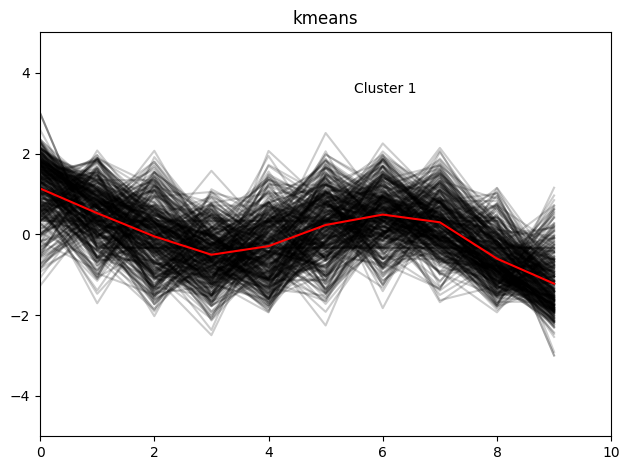

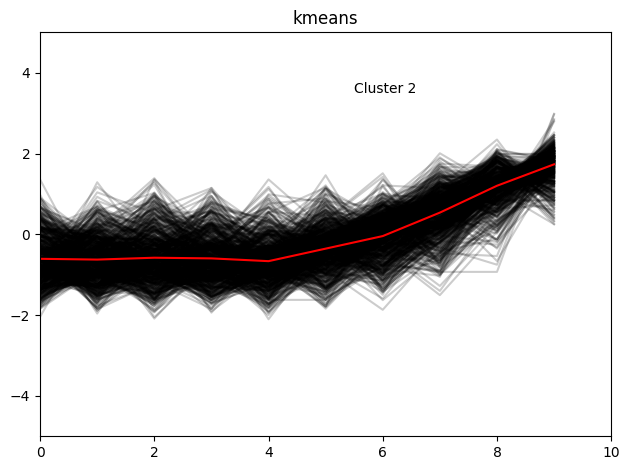

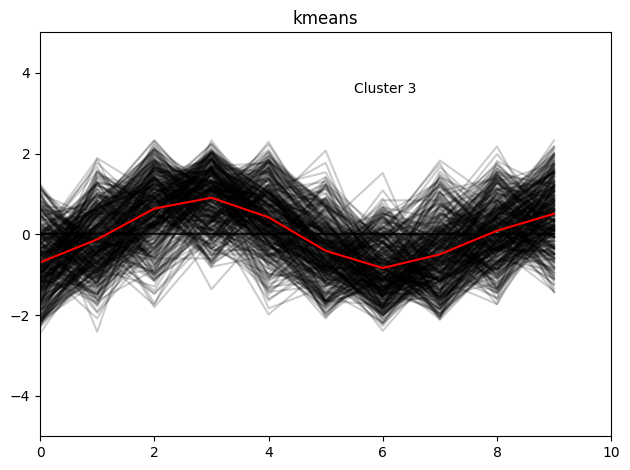

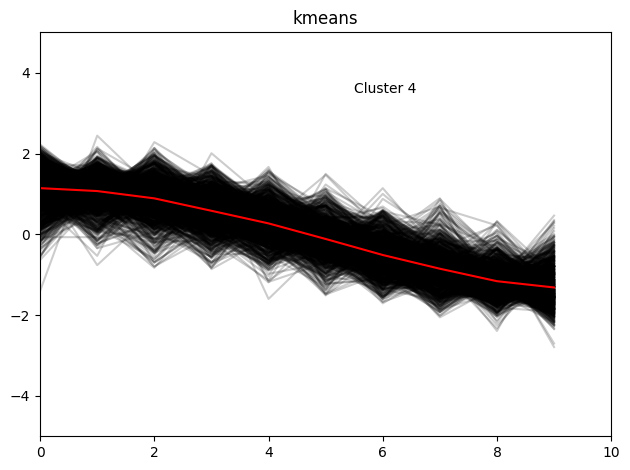

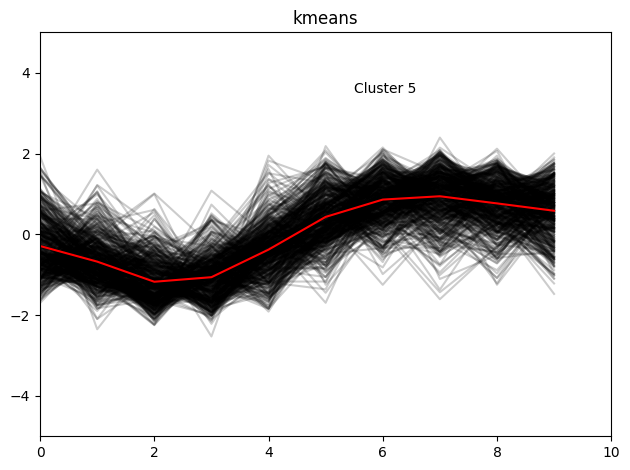

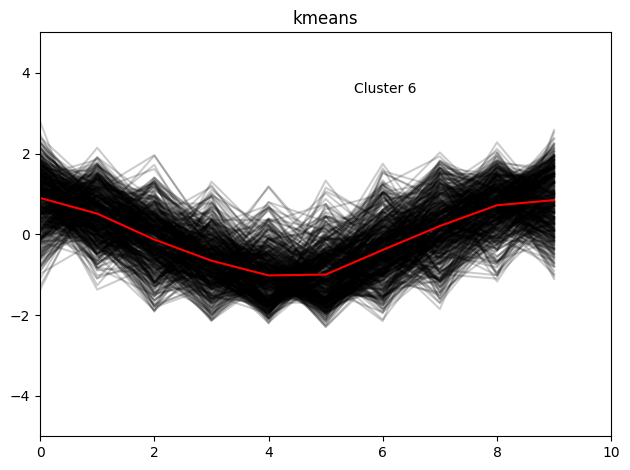

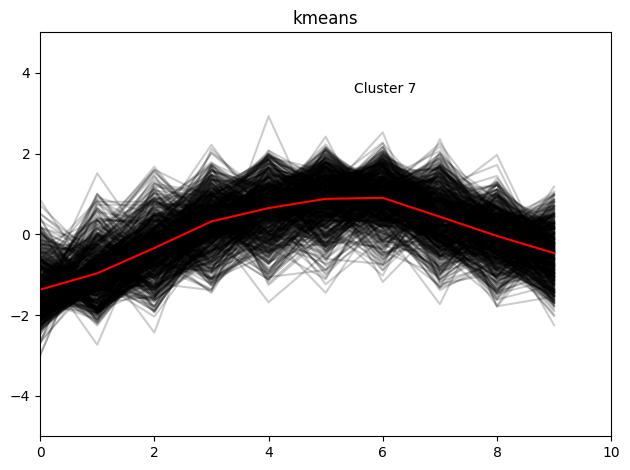

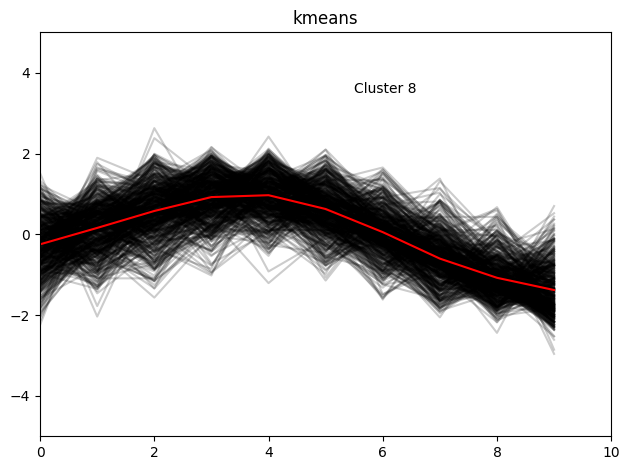

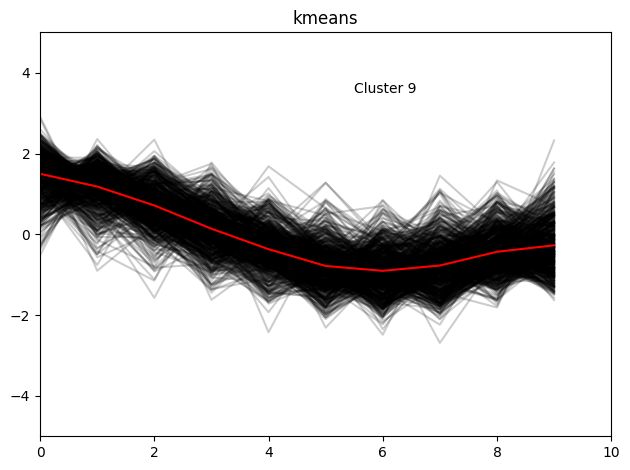

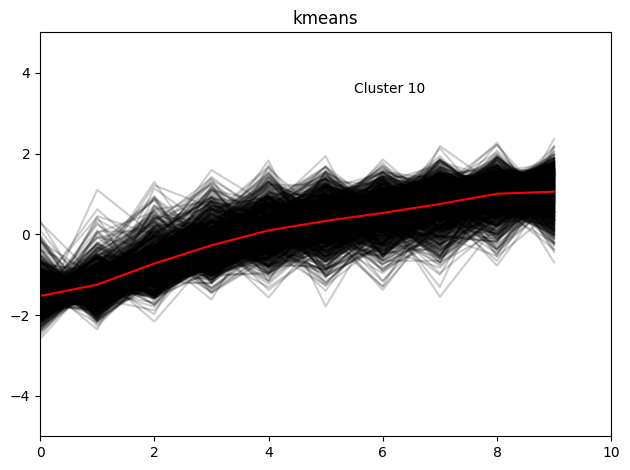

The 5.78% of the observations fall into Cluster 1
The 10.60% of the observations fall into Cluster 2
The 6.19% of the observations fall into Cluster 3
The 17.13% of the observations fall into Cluster 4
The 7.87% of the observations fall into Cluster 5
The 8.07% of the observations fall into Cluster 6
The 9.73% of the observations fall into Cluster 7
The 8.45% of the observations fall into Cluster 8
The 10.84% of the observations fall into Cluster 9
The 15.33% of the observations fall into Cluster 10


array([1, 5, 7, ..., 4, 9, 8])

In [53]:
labels=kmeans_cluster(10,"kmeans_euclidean_10",X_train,"euclidean")

#### other scoring

In [ ]:
silhoutte=kmeans_silhoutte(X_train,"dtw")
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),silhoutte,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('silhoutte');
plt.title("Silhouette analysis For Optimal K and Optimal Model")

In [ ]:
silhoutte=kmeans_silhoutte(X_train,"softdtw")
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),silhoutte,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('silhoutte');
plt.title("Silhouette analysis For Optimal K and Optimal Model")

In [ ]:
wcss=kmeans_wcsss(X,"euclidean")
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),wcss,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('WCSSS');
plt.title("WCSSS analysis For Optimal K and Optimal Model")

In [ ]:
silhoutte=kmeans_calinski_harabasz(X_train,"dtw")
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),silhoutte,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('calinski harabasz');
plt.title("calinski harabasz For Optimal K and Optimal Model")

In [ ]:
silhoutte=kmeans_calinski_harabasz(X_train,"softdtw")
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),silhoutte,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('calinski harabasz');
plt.title("calinski harabasz For Optimal K and Optimal Model")

In [ ]:
silhoutte=kmeans_calinski_harabasz(X_train,"euclidean")
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),silhoutte,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('calinski harabasz');
plt.title("calinski harabasz For Optimal K and Optimal Model")

## length 25 timeseries

In [54]:
df=pd.DataFrame.from_dict(get_samples(players_dict,50,25)).T
df

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
ZWIIT,1494,1484,1497,1509,1497,1496,1507,1524,1517,1536,...,1531,1569,1591,1555,1585,1607,1627,1639,1625,1598
malick,1636,1640,1633,1621,1610,1617,1628,1635,1640,1631,...,1644,1655,1665,1663,1666,1677,1685,1676,1672,1659
belberg,1411,1401,1393,1404,1424,1404,1389,1378,1370,1357,...,1395,1408,1397,1393,1394,1402,1396,1404,1418,1435
mjcool,1337,1334,1346,1344,1339,1334,1330,1327,1321,1315,...,1321,1331,1344,1356,1353,1350,1344,1339,1336,1338
zansirak,1583,1570,1560,1556,1543,1530,1528,1518,1506,1496,...,1558,1543,1526,1520,1525,1512,1519,1529,1514,1501
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
bellotob,1536,1533,1529,1537,1533,1542,1552,1549,1551,1550,...,1514,1527,1517,1522,1512,1519,1525,1532,1524,1532
Chessbroker,1654,1663,1668,1657,1665,1654,1663,1670,1674,1680,...,1674,1682,1673,1681,1690,1691,1683,1688,1674,1679
hannick,1663,1654,1643,1650,1663,1674,1682,1693,1707,1694,...,1674,1681,1670,1666,1669,1659,1662,1656,1651,1646
Codymaurice,1496,1502,1497,1510,1509,1505,1515,1506,1516,1512,...,1517,1515,1522,1518,1521,1527,1518,1513,1502,1495


In [55]:

%%time

# Standardizing (z-score normalization) a dataset involves rescaling the distribution of values
ss = StandardScaler()

scaled_ss = ss.fit_transform(df.T)
df_ss = pd.DataFrame(scaled_ss.T, columns=df.columns, index=df.index)
X_ss = df_ss.values
display(df_ss.head())

# Normalization
mm = MinMaxScaler()
scaled_mm = mm.fit_transform(df.T)
df_mm = pd.DataFrame(scaled_mm.T, columns=df.columns, index=df.index)
X_mm = df_mm.values
display(df_mm.head())


# convert dataframe to time_series_dataset
X = to_time_series_dataset(df.values)

# normalize time series to zero mean and unit variance
X_train = TimeSeriesScalerMeanVariance().fit_transform(X)

print(X.shape, X_train.shape)

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
ZWIIT,-1.094936,-1.309967,-1.030427,-0.772390,-1.030427,-1.051930,-0.815396,-0.449844,-0.600366,-0.191807,...,-0.299323,0.517794,0.990862,0.216751,0.861843,1.334911,1.764972,2.023009,1.721966,1.141383
malick,-0.661963,-0.456385,-0.816147,-1.432883,-1.998224,-1.638462,-1.073120,-0.713358,-0.456385,-0.918936,...,-0.250806,0.314535,0.828482,0.725693,0.879876,1.445218,1.856375,1.393823,1.188244,0.520114
belberg,0.915425,0.418991,0.021843,0.567921,1.560790,0.567921,-0.176731,-0.722809,-1.119956,-1.765321,...,0.121130,0.766495,0.220417,0.021843,0.071487,0.468634,0.170773,0.567921,1.262929,2.106868
mjcool,0.335481,0.100331,1.040931,0.884165,0.492248,0.100331,-0.213203,-0.448353,-0.918653,-1.388954,...,-0.918653,-0.134819,0.884165,1.824765,1.589615,1.354465,0.884165,0.492248,0.257098,0.413864
zansirak,2.352891,1.789376,1.355903,1.182514,0.618999,0.055485,-0.031210,-0.464683,-0.984850,-1.418323,...,1.269209,0.618999,-0.117905,-0.377988,-0.161252,-0.724767,-0.421336,0.012137,-0.638072,-1.201587


,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
ZWIIT,0.064516,0.000000,0.083871,0.161290,0.083871,0.077419,0.148387,0.258065,0.212903,0.335484,...,0.303226,0.548387,0.690323,0.458065,0.651613,0.793548,0.922581,1.000000,0.909677,0.735484
malick,0.346667,0.400000,0.306667,0.146667,0.000000,0.093333,0.240000,0.333333,0.400000,0.280000,...,0.453333,0.600000,0.733333,0.706667,0.746667,0.893333,1.000000,0.880000,0.826667,0.653333
belberg,0.714286,0.595238,0.500000,0.630952,0.869048,0.630952,0.452381,0.321429,0.226190,0.071429,...,0.523810,0.678571,0.547619,0.500000,0.511905,0.607143,0.535714,0.630952,0.797619,1.000000
mjcool,0.568182,0.500000,0.772727,0.727273,0.613636,0.500000,0.409091,0.340909,0.204545,0.068182,...,0.204545,0.431818,0.727273,1.000000,0.931818,0.863636,0.727273,0.613636,0.545455,0.590909
zansirak,1.000000,0.858696,0.750000,0.706522,0.565217,0.423913,0.402174,0.293478,0.163043,0.054348,...,0.728261,0.565217,0.380435,0.315217,0.369565,0.228261,0.304348,0.413043,0.250000,0.108696


(6329, 25, 1) (6329, 25, 1)
CPU times: user 521 ms, sys: 2 µs, total: 521 ms
Wall time: 520 ms


In [ ]:
# Select a product Id to compare normal data with scaled data
product = "dachampChi"

# Visualize the sales (qty) for the product
df.loc[product].plot(title="Actual Data"), plt.show()
df_ss.loc[product].plot(title="Z-Score Normalization"), plt.show()
df_mm.loc[product].plot(title="MinMax Normalization"), plt.show();


x = df.loc["petedoherty"]
y = df.loc["tom62"]

plt.figure(figsize=(12, 8))
plt.plot(x, "-o", c="C3")
plt.plot(y, "-o", c="C0")
plt.legend([x.name, y.name]);

# Select moving average sales
w = df.loc["petedoherty"]
z = df.loc["tom62"]

plt.figure(figsize=(12, 8))
plt.plot(w, "-o", c="C3")
plt.plot(z, "-o", c="C0")
plt.legend([w.name, z.name]);

Alignment cost: 2063.0000
Normalized alignment cost: 103.1500


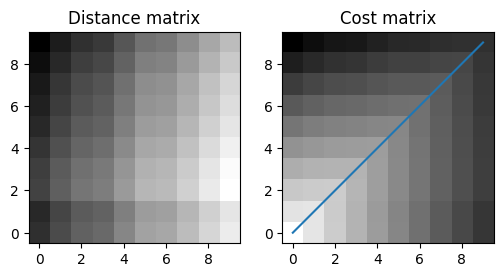

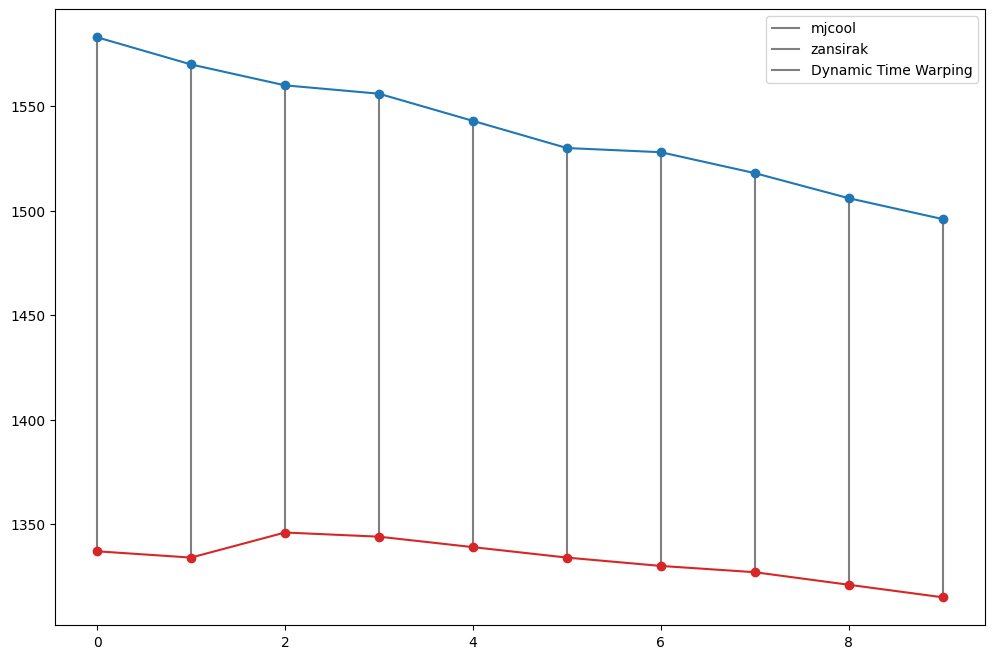

In [56]:
# Distance matrix
N = w.shape[0]
M = z.shape[0]
dist_mat = np.zeros((N, M))
for i in range(N):
    for j in range(M):
        dist_mat[i, j] = abs(x[i] - y[j])


# DTW
path, cost_mat = dp(dist_mat)
print("Alignment cost: {:.4f}".format(cost_mat[N - 1, M - 1]))
print("Normalized alignment cost: {:.4f}".format(cost_mat[N - 1, M - 1]/(N + M)))

plt.figure(figsize=(6, 4))
plt.subplot(121)
plt.title("Distance matrix")
plt.imshow(dist_mat, cmap=plt.cm.binary, interpolation="nearest", origin="lower")
plt.subplot(122)
plt.title("Cost matrix")
plt.imshow(cost_mat, cmap=plt.cm.binary, interpolation="nearest", origin="lower")
x_path, y_path = zip(*path)
plt.plot(y_path, x_path);

plt.figure(figsize=(12, 8))
for x_i, y_j in path:
    plt.plot([x_i, y_j], [w[x_i], z[y_j]], c="C7")
plt.plot(np.arange(w.shape[0]), w, "-o", c="C3")
plt.plot(np.arange(z.shape[0]), z, "-o", c="C0")
plt.legend([w.name, z.name, "Dynamic Time Warping"]);

#### dtw & normalized & wcsss

In [ ]:
wcss=kmeans_wcsss(X_train,"dtw",20)
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,20),wcss,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('WCSSS');
plt.title("WCSSS analysis For Optimal K and Optimal Model")

In [ ]:
kmeans_cluster(13,"kmeans_dtw_25",X_train,"dtw")

#### softdtw & normalized & wcsss

In [ ]:
wcss=kmeans_wcsss(X_train,"softdtw",20)
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,20),wcss,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('WCSSS');
plt.title("WCSSS analysis For Optimal K and Optimal Model")

In [ ]:
kmeans_cluster(13,"kmeans_softdtw_25",X_train,"softdtw")

#### euclidean & normalized & wcsss

K = 2. Took 1.55 seconds to calculate.
K = 3. Took 5.56 seconds to calculate.
K = 4. Took 7.57 seconds to calculate.
K = 5. Took 7.71 seconds to calculate.
K = 6. Took 5.52 seconds to calculate.
K = 7. Took 7.98 seconds to calculate.
K = 8. Took 6.41 seconds to calculate.
K = 9. Took 7.68 seconds to calculate.
K = 10. Took 7.66 seconds to calculate.
K = 11. Took 7.91 seconds to calculate.
K = 12. Took 7.19 seconds to calculate.
K = 13. Took 7.77 seconds to calculate.
K = 14. Took 7.97 seconds to calculate.
K = 15. Took 7.98 seconds to calculate.
K = 16. Took 7.74 seconds to calculate.
K = 17. Took 7.82 seconds to calculate.
K = 18. Took 7.91 seconds to calculate.
K = 19. Took 7.95 seconds to calculate.


Text(0.5, 1.0, 'WCSSS analysis For Optimal K and Optimal Model')

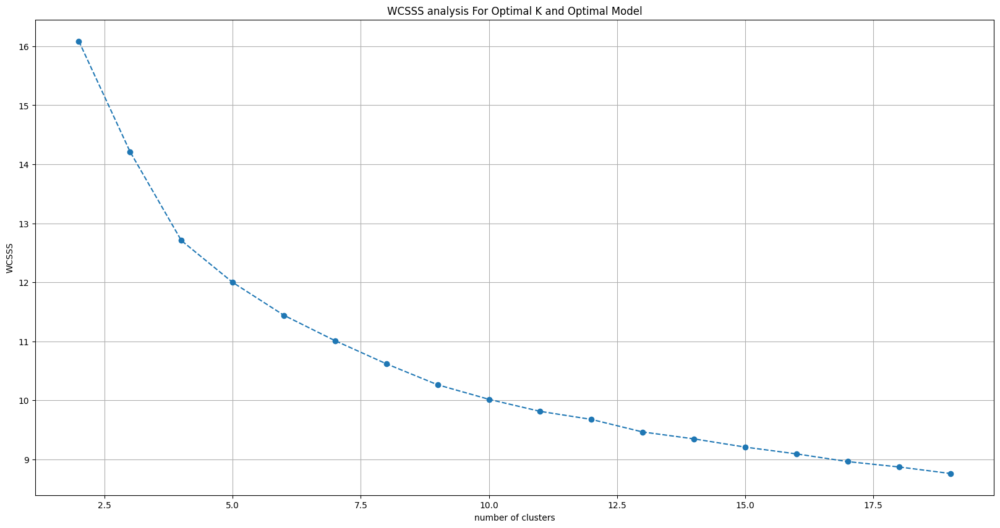

In [57]:
wcss=kmeans_wcsss(X_train,"euclidean",20)
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,20),wcss,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('WCSSS');
plt.title("WCSSS analysis For Optimal K and Optimal Model")

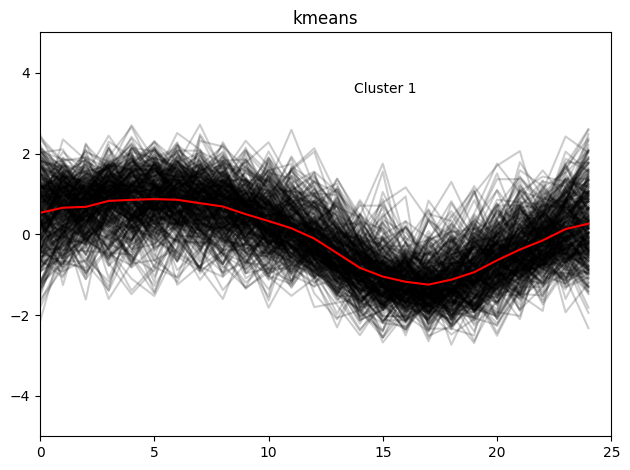

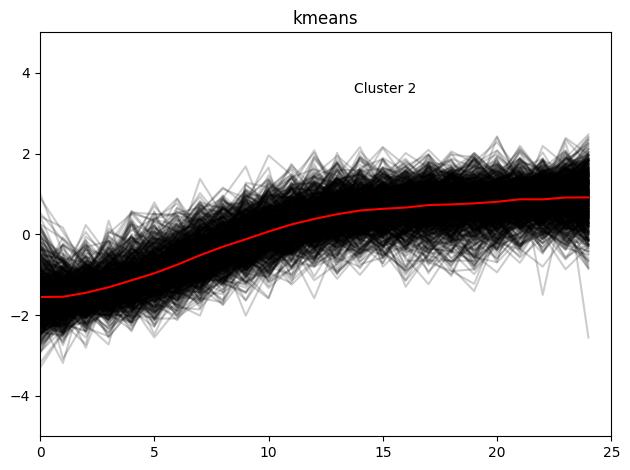

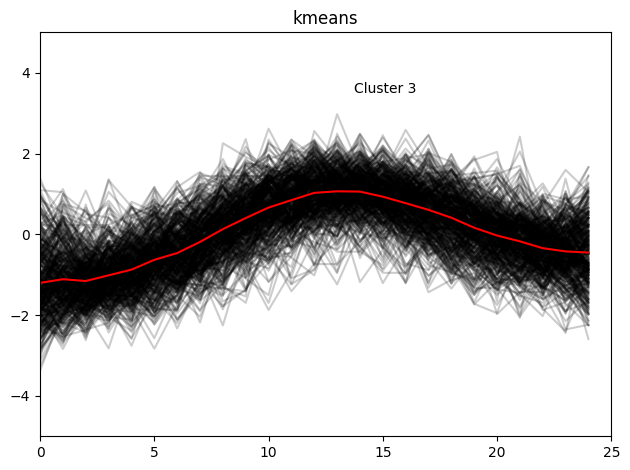

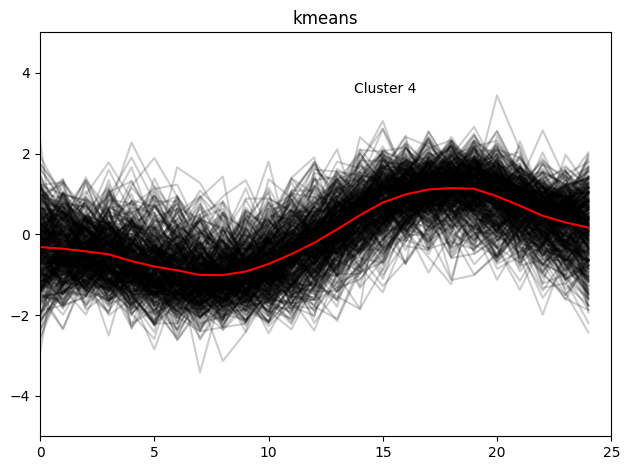

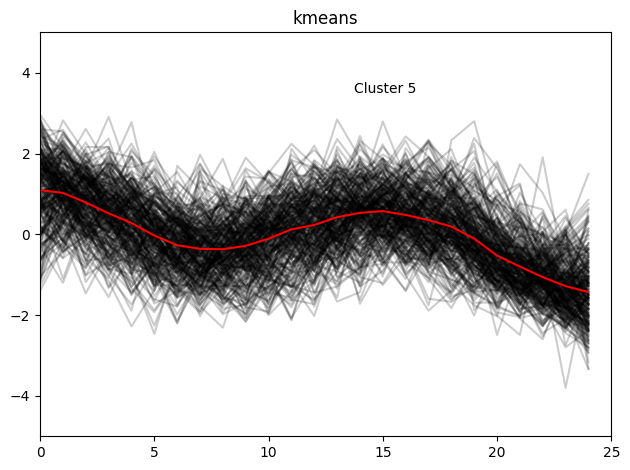

...

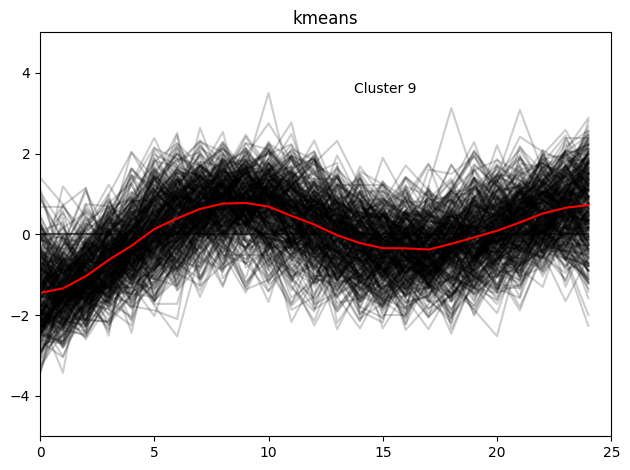

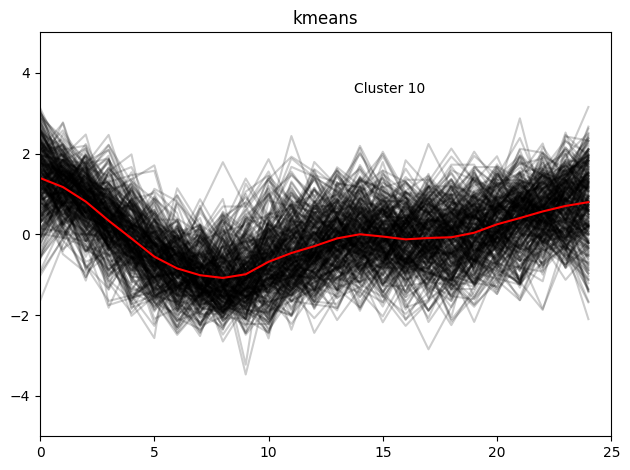

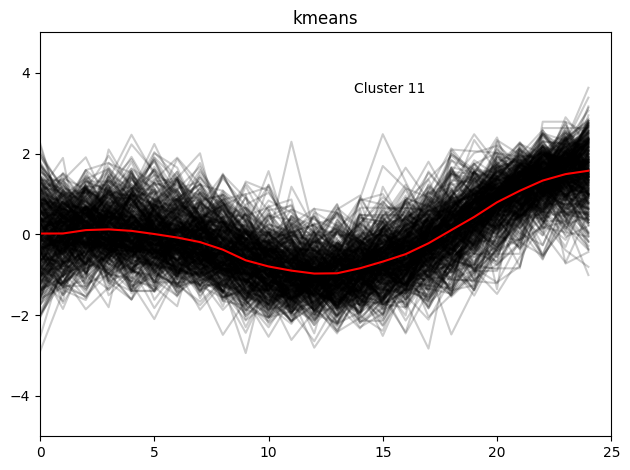

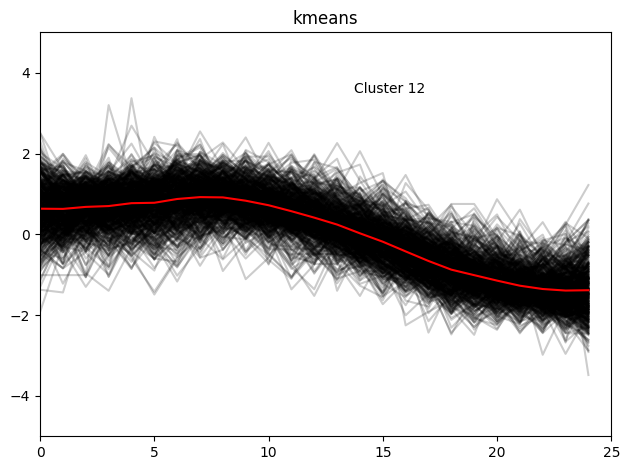

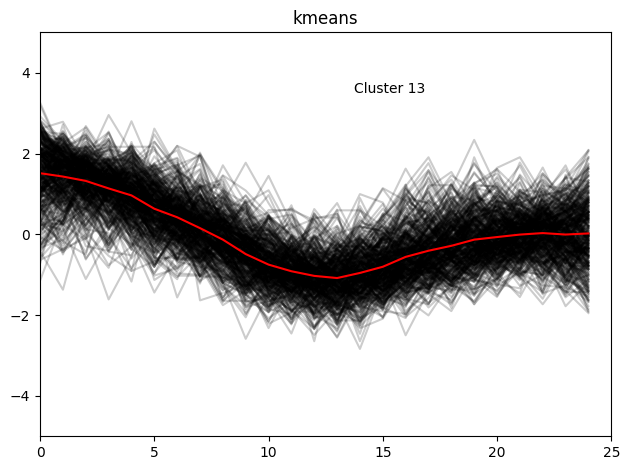

The 5.59% of the observations fall into Cluster 1
The 12.40% of the observations fall into Cluster 2
The 6.89% of the observations fall into Cluster 3
The 6.81% of the observations fall into Cluster 4
The 4.50% of the observations fall into Cluster 5
The 6.10% of the observations fall into Cluster 6
The 12.81% of the observations fall into Cluster 7
The 11.66% of the observations fall into Cluster 8
The 5.77% of the observations fall into Cluster 9
The 4.88% of the observations fall into Cluster 10
The 6.97% of the observations fall into Cluster 11
The 9.21% of the observations fall into Cluster 12
The 6.40% of the observations fall into Cluster 13


array([ 6,  6, 10, ...,  5,  2,  3])

In [58]:
kmeans_cluster(13,"kmeans_euclidean_25",X_train,"euclidean")

#### other scoring

In [ ]:
silhoutte=kmeans_silhoutte(X_train,"dtw")
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),silhoutte,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('silhoutte');
plt.title("Silhouette analysis For Optimal K and Optimal Model")

In [ ]:
silhoutte=kmeans_silhoutte(X_train,"softdtw")
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),silhoutte,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('silhoutte');
plt.title("Silhouette analysis For Optimal K and Optimal Model")

In [ ]:
wcss=kmeans_wcsss(X,"euclidean")
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),wcss,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('WCSSS');
plt.title("WCSSS analysis For Optimal K and Optimal Model")

In [ ]:
silhoutte=kmeans_calinski_harabasz(X_train,"dtw")
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),silhoutte,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('calinski harabasz');
plt.title("calinski harabasz For Optimal K and Optimal Model")

In [ ]:
silhoutte=kmeans_calinski_harabasz(X_train,"softdtw")
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),silhoutte,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('calinski harabasz');
plt.title("calinski harabasz For Optimal K and Optimal Model")

In [62]:
silhoutte=kmeans_calinski_harabasz(X_train,"euclidean")
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),silhoutte,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('calinski harabasz');
plt.title("calinski harabasz For Optimal K and Optimal Model")

NameError: name 'y_pred_ss' is not defined

## length 50 timeseries

In [78]:
df=pd.DataFrame.from_dict(get_samples(players_dict,50,50)).T
display(df.head())

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
ZWIIT,1494,1484,1497,1509,1497,1496,1507,1524,1517,1536,...,1605,1614,1622,1630,1622,1614,1607,1601,1591,1583
malick,1636,1640,1633,1621,1610,1617,1628,1635,1640,1631,...,1623,1618,1614,1625,1629,1640,1636,1647,1658,1651
belberg,1411,1401,1393,1404,1424,1404,1389,1378,1370,1357,...,1496,1517,1539,1518,1509,1523,1509,1528,1535,1549
mjcool,1337,1334,1346,1344,1339,1334,1330,1327,1321,1315,...,1375,1384,1379,1374,1371,1366,1379,1376,1389,1386
zansirak,1583,1570,1560,1556,1543,1530,1528,1518,1506,1496,...,1533,1543,1551,1545,1533,1530,1522,1532,1540,1532


In [81]:

%%time

# Standardizing (z-score normalization) a dataset involves rescaling the distribution of values
ss = StandardScaler()

scaled_ss = ss.fit_transform(df.T)
df_ss = pd.DataFrame(scaled_ss.T, columns=df.columns, index=df.index)
X_ss = df_ss.values
display(df_ss.head())

# Normalization
mm = MinMaxScaler()
scaled_mm = mm.fit_transform(df.T)
df_mm = pd.DataFrame(scaled_mm.T, columns=df.columns, index=df.index)
X_mm = df_mm.values
display(df_mm.head())


# convert dataframe to time_series_dataset
X = to_time_series_dataset(df.values)

# normalize time series to zero mean and unit variance
X_train = TimeSeriesScalerMeanVariance().fit_transform(X)

print(X.shape, X_train.shape)

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
ZWIIT,-1.773809,-2.002510,-1.705198,-1.430756,-1.705198,-1.728068,-1.476497,-1.087704,-1.247795,-0.813262,...,0.764778,0.970609,1.153570,1.336531,1.153570,0.970609,0.810518,0.673297,0.444596,0.261634
malick,-0.593650,-0.364441,-0.765556,-1.453181,-2.083504,-1.682389,-1.052066,-0.650952,-0.364441,-0.880160,...,-1.338577,-1.625087,-1.854295,-1.223973,-0.994764,-0.364441,-0.593650,0.036673,0.666996,0.265882
belberg,-0.611194,-0.759758,-0.878609,-0.715189,-0.418060,-0.715189,-0.938035,-1.101456,-1.220307,-1.413441,...,0.651603,0.963588,1.290429,0.978444,0.844737,1.052727,0.844737,1.127009,1.231004,1.438994
mjcool,-0.551177,-0.681994,-0.158725,-0.245937,-0.463966,-0.681994,-0.856418,-0.987235,-1.248870,-1.510504,...,1.105843,1.498295,1.280266,1.062237,0.931420,0.713391,1.280266,1.149449,1.716324,1.585506
zansirak,2.993129,2.260348,1.696670,1.471199,0.738418,0.005637,-0.107099,-0.670777,-1.347190,-1.910868,...,0.174740,0.738418,1.189360,0.851153,0.174740,0.005637,-0.445305,0.118372,0.569315,0.118372


,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
ZWIIT,0.064516,0.000000,0.083871,0.161290,0.083871,0.077419,0.148387,0.258065,0.212903,0.335484,...,0.780645,0.838710,0.890323,0.941935,0.890323,0.838710,0.793548,0.754839,0.690323,0.638710
malick,0.346667,0.400000,0.306667,0.146667,0.000000,0.093333,0.240000,0.333333,0.400000,0.280000,...,0.173333,0.106667,0.053333,0.200000,0.253333,0.400000,0.346667,0.493333,0.640000,0.546667
belberg,0.260870,0.217391,0.182609,0.230435,0.317391,0.230435,0.165217,0.117391,0.082609,0.026087,...,0.630435,0.721739,0.817391,0.726087,0.686957,0.747826,0.686957,0.769565,0.800000,0.860870
mjcool,0.324675,0.285714,0.441558,0.415584,0.350649,0.285714,0.233766,0.194805,0.116883,0.038961,...,0.818182,0.935065,0.870130,0.805195,0.766234,0.701299,0.870130,0.831169,1.000000,0.961039
zansirak,1.000000,0.858696,0.750000,0.706522,0.565217,0.423913,0.402174,0.293478,0.163043,0.054348,...,0.456522,0.565217,0.652174,0.586957,0.456522,0.423913,0.336957,0.445652,0.532609,0.445652


(6329, 50, 1) (6329, 50, 1)
CPU times: user 494 ms, sys: 0 ns, total: 494 ms
Wall time: 493 ms


In [ ]:


# Select a product Id to compare normal data with scaled data
product = "dachampChi"

# Visualize the sales (qty) for the product
df.loc[product].plot(title="Actual Data"), plt.show()
df_ss.loc[product].plot(title="Z-Score Normalization"), plt.show()
df_mm.loc[product].plot(title="MinMax Normalization"), plt.show();


x = df.loc["petedoherty"]
y = df.loc["tom62"]

plt.figure(figsize=(12, 8))
plt.plot(x, "-o", c="C3")
plt.plot(y, "-o", c="C0")
plt.legend([x.name, y.name]);

# Select moving average sales
w = df.loc["petedoherty"]
z = df.loc["tom62"]

plt.figure(figsize=(12, 8))
plt.plot(w, "-o", c="C3")
plt.plot(z, "-o", c="C0")
plt.legend([w.name, z.name]);



Alignment cost: 2063.0000
Normalized alignment cost: 103.1500


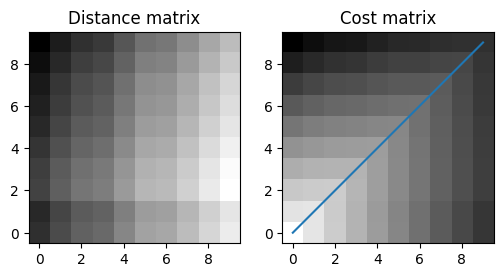

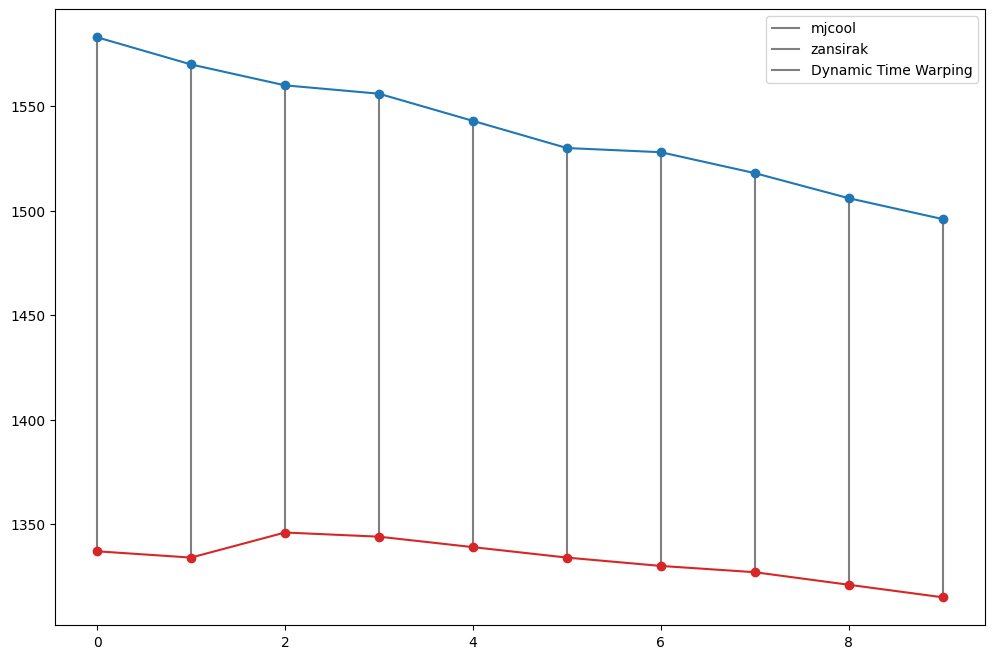

In [83]:

# Distance matrix
N = w.shape[0]
M = z.shape[0]
dist_mat = np.zeros((N, M))
for i in range(N):
    for j in range(M):
        dist_mat[i, j] = abs(x[i] - y[j])


# DTW
path, cost_mat = dp(dist_mat)
print("Alignment cost: {:.4f}".format(cost_mat[N - 1, M - 1]))
print("Normalized alignment cost: {:.4f}".format(cost_mat[N - 1, M - 1]/(N + M)))

plt.figure(figsize=(6, 4))
plt.subplot(121)
plt.title("Distance matrix")
plt.imshow(dist_mat, cmap=plt.cm.binary, interpolation="nearest", origin="lower")
plt.subplot(122)
plt.title("Cost matrix")
plt.imshow(cost_mat, cmap=plt.cm.binary, interpolation="nearest", origin="lower")
x_path, y_path = zip(*path)
plt.plot(y_path, x_path);

plt.figure(figsize=(12, 8))
for x_i, y_j in path:
    plt.plot([x_i, y_j], [w[x_i], z[y_j]], c="C7")
plt.plot(np.arange(w.shape[0]), w, "-o", c="C3")
plt.plot(np.arange(z.shape[0]), z, "-o", c="C0")
plt.legend([w.name, z.name, "Dynamic Time Warping"]);

#### dtw & normalized & wcsss

In [ ]:
wcss=kmeans_wcsss(X_train,"dtw",20)
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,20),wcss,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('WCSSS');
plt.title("WCSSS analysis For Optimal K and Optimal Model")

In [80]:
kmeans_cluster(9,"kmeans_dtw_50",X_train,"dtw")

KeyboardInterrupt: 

#### softdtw & normalized & wcsss

In [ ]:
wcss=kmeans_wcsss(X_train,"softdtw",20)
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,20),wcss,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('WCSSS');
plt.title("WCSSS analysis For Optimal K and Optimal Model")

In [ ]:
kmeans_cluster(13,"kmeans_softdtw_50",X_train,"softdtw")

#### euclidean & normalized & wcsss

In [84]:
len(X_train[0])

50

K = 2. Took 1.09 seconds to calculate.
K = 3. Took 8.05 seconds to calculate.
K = 4. Took 7.53 seconds to calculate.
K = 5. Took 7.97 seconds to calculate.
K = 6. Took 5.04 seconds to calculate.
K = 7. Took 6.31 seconds to calculate.
K = 8. Took 7.95 seconds to calculate.
K = 9. Took 7.72 seconds to calculate.
K = 10. Took 8.00 seconds to calculate.
K = 11. Took 8.05 seconds to calculate.
K = 12. Took 7.61 seconds to calculate.
K = 13. Took 6.48 seconds to calculate.
K = 14. Took 7.65 seconds to calculate.
K = 15. Took 7.87 seconds to calculate.
K = 16. Took 7.36 seconds to calculate.
K = 17. Took 7.63 seconds to calculate.
K = 18. Took 7.17 seconds to calculate.
K = 19. Took 7.42 seconds to calculate.


Text(0.5, 1.0, 'WCSSS analysis For Optimal K and Optimal Model')

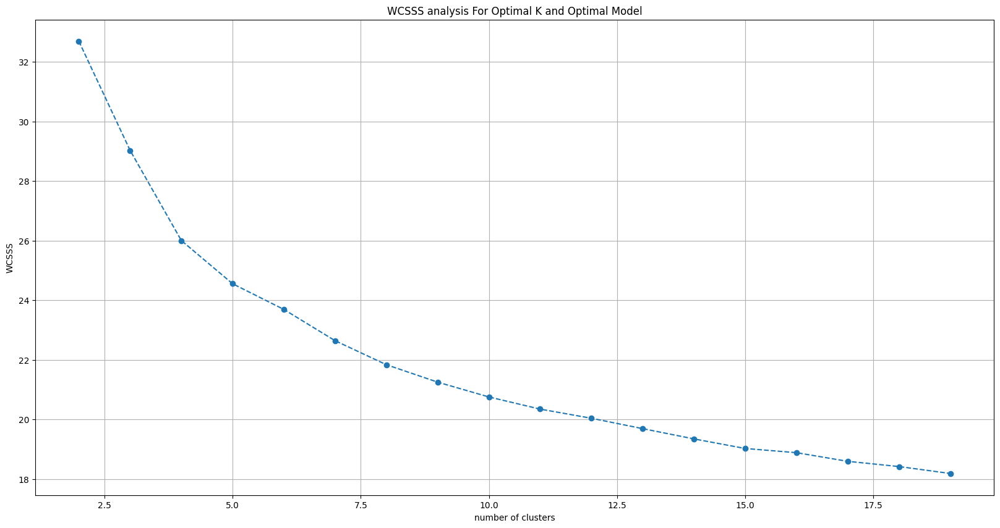

In [86]:
wcss=kmeans_wcsss(X_train,"euclidean",20)
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,20),wcss,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('WCSSS');
plt.title("WCSSS analysis For Optimal K and Optimal Model")

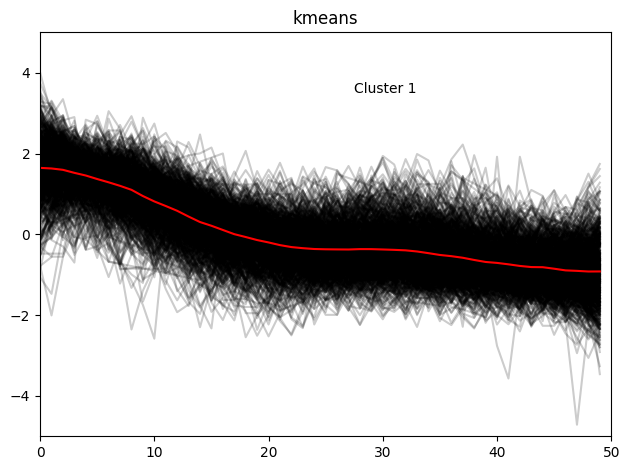

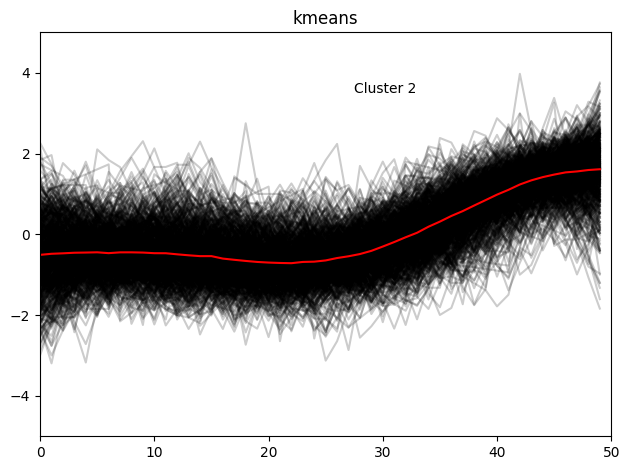

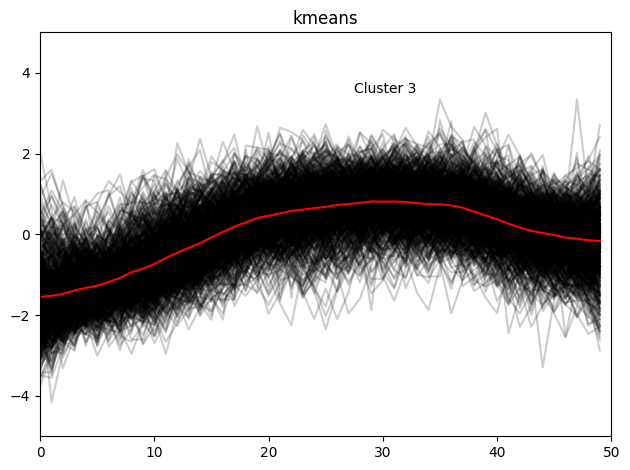

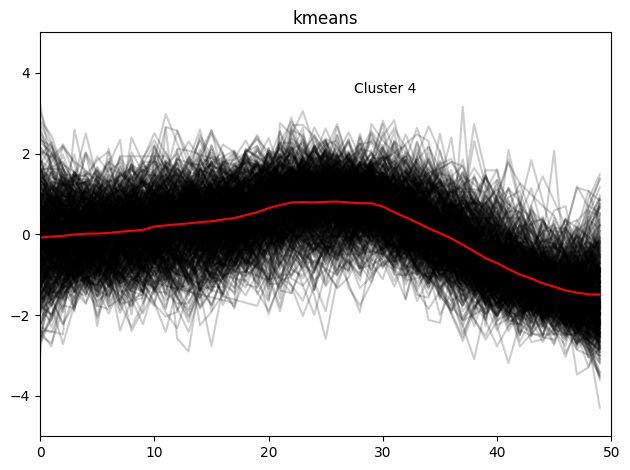

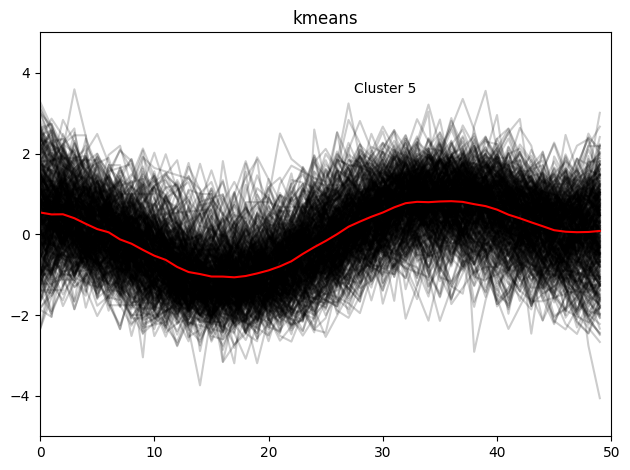

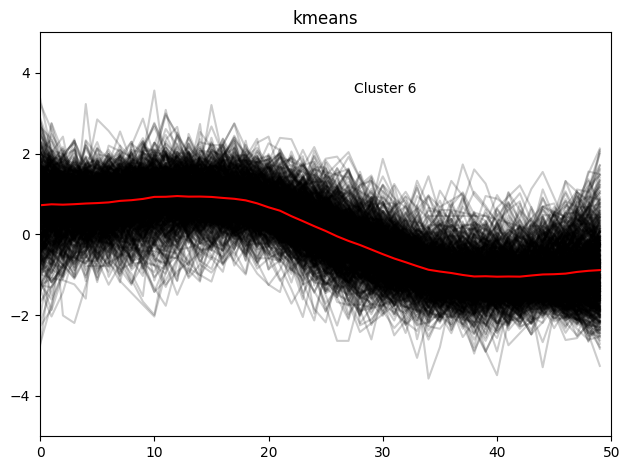

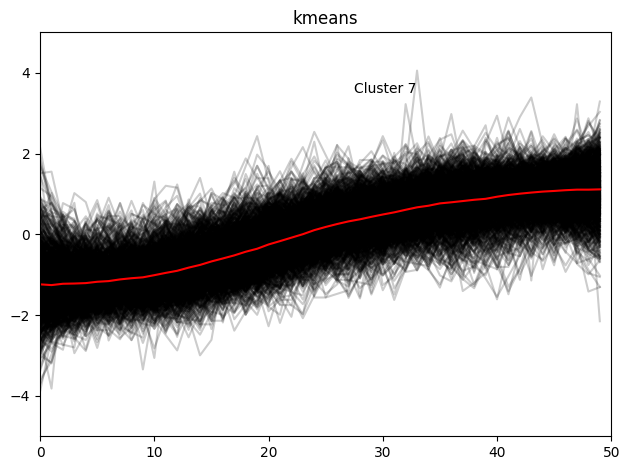

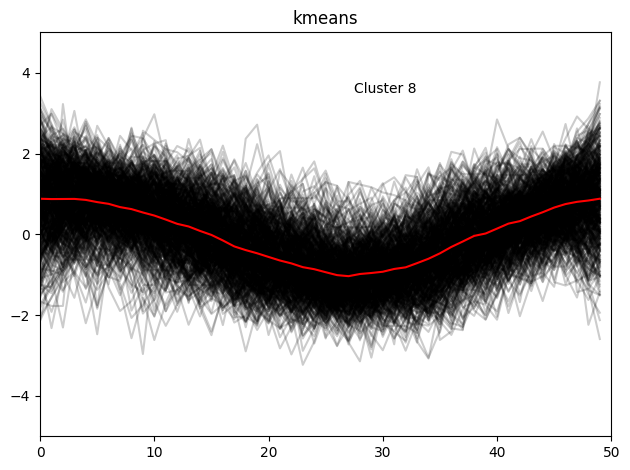

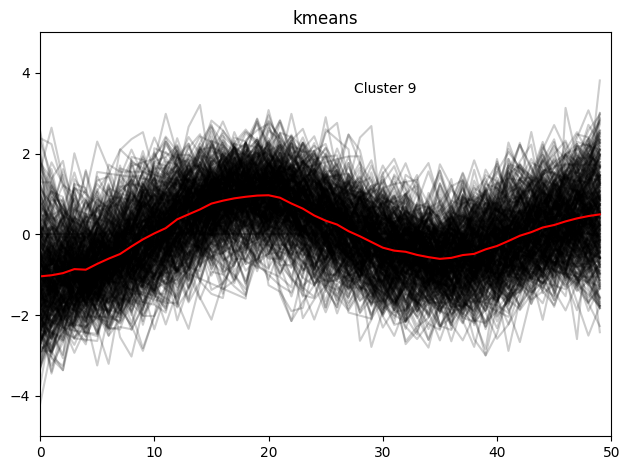

The 13.13% of the observations fall into Cluster 1
The 11.57% of the observations fall into Cluster 2
The 11.03% of the observations fall into Cluster 3
The 9.09% of the observations fall into Cluster 4
The 7.28% of the observations fall into Cluster 5
The 12.83% of the observations fall into Cluster 6
The 19.61% of the observations fall into Cluster 7
The 8.90% of the observations fall into Cluster 8
The 6.57% of the observations fall into Cluster 9


array([6, 8, 6, ..., 7, 1, 8])

In [85]:
kmeans_cluster(9,"kmeans_euclidean_50",X_train,"euclidean")

#### other scoring

In [ ]:
silhoutte=kmeans_silhoutte(X_train,"dtw")
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),silhoutte,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('silhoutte');
plt.title("Silhouette analysis For Optimal K and Optimal Model")

In [ ]:
silhoutte=kmeans_silhoutte(X_train,"softdtw")
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),silhoutte,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('silhoutte');
plt.title("Silhouette analysis For Optimal K and Optimal Model")

In [ ]:
wcss=kmeans_wcsss(X,"euclidean")
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),wcss,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('WCSSS');
plt.title("WCSSS analysis For Optimal K and Optimal Model")

In [ ]:
silhoutte=kmeans_calinski_harabasz(X_train,"dtw")
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),silhoutte,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('calinski harabasz');
plt.title("calinski harabasz For Optimal K and Optimal Model")

In [ ]:
silhoutte=kmeans_calinski_harabasz(X_train,"softdtw")
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),silhoutte,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('calinski harabasz');
plt.title("calinski harabasz For Optimal K and Optimal Model")

In [ ]:
silhoutte=kmeans_calinski_harabasz(X_train,"euclidean")
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),silhoutte,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('calinski harabasz');
plt.title("calinski harabasz For Optimal K and Optimal Model")

## Analyze cluster

In [64]:
df=pd.DataFrame.from_dict(get_samples(players_dict,50,1)).T
largest_len=len(df)

curr_l=1
while True:
    df=pd.DataFrame.from_dict(get_samples(players_dict,50,curr_l)).T
    if len(df)<largest_len:
        break
    curr_l=curr_l+1



In [68]:
print("Largest length is:",curr_l)

Largest length is: 152


In [11]:
df=pd.DataFrame.from_dict(get_samples(players_dict,50,150)).T


In [12]:
df

,0,1,2,3,4,5,6,7,8,9,...,140,141,142,143,144,145,146,147,148,149
alexyao,1539,1527,1541,1530,1545,1530,1522,1522,1528,1521,...,1673,1667,1660,1669,1678,1669,1668,1675,1669,1662
talifhanil,1448,1442,1446,1453,1444,1451,1447,1457,1464,1455,...,1448,1439,1430,1423,1422,1432,1437,1446,1439,1430
lonelyOne,1696,1704,1696,1687,1679,1671,1680,1672,1685,1693,...,1696,1689,1686,1691,1704,1713,1707,1713,1708,1698
neilbrown,1377,1369,1366,1375,1368,1364,1361,1376,1374,1366,...,1389,1398,1396,1385,1395,1393,1408,1401,1397,1389
kjbkjn,1481,1492,1500,1492,1479,1483,1491,1495,1483,1484,...,1782,1785,1795,1797,1805,1812,1816,1818,1824,1832
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
irishrover,1460,1457,1456,1462,1473,1470,1483,1476,1484,1481,...,1570,1580,1587,1598,1589,1583,1575,1573,1566,1560
Franchute,1215,1219,1223,1227,1231,1235,1232,1237,1242,1247,...,1382,1385,1388,1391,1394,1397,1400,1402,1388,1391
MikolaPetrishenko,1501,1501,1494,1496,1496,1494,1494,1480,1467,1457,...,1416,1416,1415,1412,1412,1412,1408,1407,1407,1407
theCassandra,1545,1552,1560,1567,1555,1553,1551,1549,1541,1538,...,1719,1709,1714,1707,1700,1695,1690,1685,1690,1692


In [13]:

# Standardizing (z-score normalization) a dataset involves rescaling the distribution of values
ss = StandardScaler()

scaled_ss = ss.fit_transform(df.T)
df_ss = pd.DataFrame(scaled_ss.T, columns=df.columns, index=df.index)
X_ss = df_ss.values
display(df_ss.head())

# Normalization
mm = MinMaxScaler()
scaled_mm = mm.fit_transform(df.T)
df_mm = pd.DataFrame(scaled_mm.T, columns=df.columns, index=df.index)
X_mm = df_mm.values
display(df_mm.head())


# convert dataframe to time_series_dataset
X = to_time_series_dataset(df.values)

# normalize time series to zero mean and unit variance
X_train = TimeSeriesScalerMeanVariance().fit_transform(X)

print(X.shape, X_train.shape)

,0,1,2,3,4,5,6,7,8,9,...,140,141,142,143,144,145,146,147,148,149
alexyao,-1.733337,-1.955322,-1.696339,-1.899826,-1.622344,-1.899826,-2.047816,-2.047816,-1.936823,-2.066315,...,0.745501,0.634508,0.505017,0.671506,0.837995,0.671506,0.653007,0.782499,0.671506,0.542015
talifhanil,-1.016111,-1.319126,-1.117116,-0.763598,-1.218121,-0.864604,-1.066614,-0.561588,-0.208070,-0.662593,...,-1.016111,-1.470634,-1.925157,-2.278675,-2.329177,-1.824152,-1.571639,-1.117116,-1.470634,-1.925157
lonelyOne,-0.366580,0.233551,-0.366580,-1.041726,-1.641857,-2.241987,-1.566841,-2.166971,-1.191759,-0.591629,...,-0.366580,-0.891694,-1.116743,-0.741661,0.233551,0.908698,0.458600,0.908698,0.533616,-0.216547
neilbrown,0.088210,-0.179093,-0.279331,0.021384,-0.212505,-0.346157,-0.446395,0.054797,-0.012029,-0.279331,...,0.489163,0.789879,0.723053,0.355512,0.689640,0.622815,1.124007,0.890117,0.756466,0.489163
kjbkjn,-0.774859,-0.679233,-0.609687,-0.679233,-0.792245,-0.757472,-0.687926,-0.653153,-0.757472,-0.748779,...,1.841811,1.867891,1.954824,1.972210,2.041756,2.102609,2.137382,2.154769,2.206928,2.276474


,0,1,2,3,4,5,6,7,8,9,...,140,141,142,143,144,145,146,147,148,149
alexyao,0.098361,0.032787,0.109290,0.049180,0.131148,0.049180,0.005464,0.005464,0.038251,0.000000,...,0.830601,0.797814,0.759563,0.808743,0.857923,0.808743,0.803279,0.841530,0.808743,0.770492
talifhanil,0.257426,0.198020,0.237624,0.306931,0.217822,0.287129,0.247525,0.346535,0.415842,0.326733,...,0.257426,0.168317,0.079208,0.009901,0.000000,0.099010,0.148515,0.237624,0.168317,0.079208
lonelyOne,0.413333,0.520000,0.413333,0.293333,0.186667,0.080000,0.200000,0.093333,0.266667,0.373333,...,0.413333,0.320000,0.280000,0.346667,0.520000,0.640000,0.560000,0.640000,0.573333,0.440000
neilbrown,0.488722,0.428571,0.406015,0.473684,0.421053,0.390977,0.368421,0.481203,0.466165,0.406015,...,0.578947,0.646617,0.631579,0.548872,0.624060,0.609023,0.721805,0.669173,0.639098,0.578947
kjbkjn,0.133333,0.160494,0.180247,0.160494,0.128395,0.138272,0.158025,0.167901,0.138272,0.140741,...,0.876543,0.883951,0.908642,0.913580,0.933333,0.950617,0.960494,0.965432,0.980247,1.000000


(4160, 150, 1) (4160, 150, 1)


20.873028486036038
K = 2. Took 452.27 seconds to calculate.
18.052061918228375
K = 3. Took 291.39 seconds to calculate.
15.910843630296746
K = 4. Took 656.14 seconds to calculate.
15.100444985179866
K = 5. Took 564.11 seconds to calculate.
14.203338653391679
K = 6. Took 503.10 seconds to calculate.
13.66744644970144
K = 7. Took 420.30 seconds to calculate.
13.289236798423582
K = 8. Took 1077.56 seconds to calculate.
12.874556693823424
K = 9. Took 1057.68 seconds to calculate.


Text(0.5, 1.0, 'WCSSS analysis For Optimal K and Optimal Model')

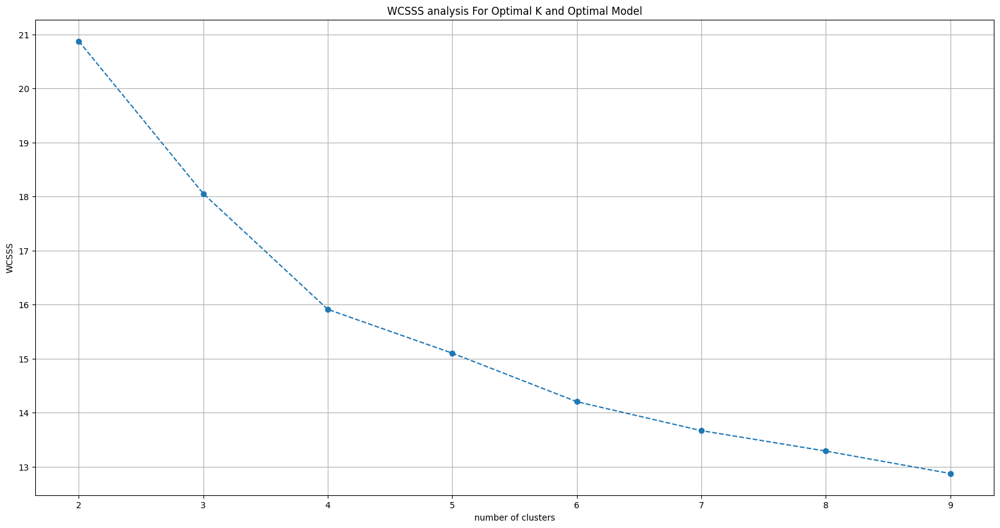

In [60]:
wcss=kmeans_wcsss(X_train,"dtw",10)
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),wcss,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('WCSSS');
plt.title("WCSSS analysis For Optimal K and Optimal Model")

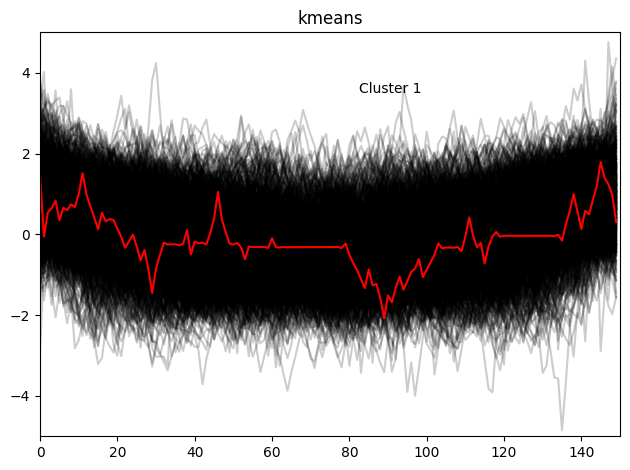

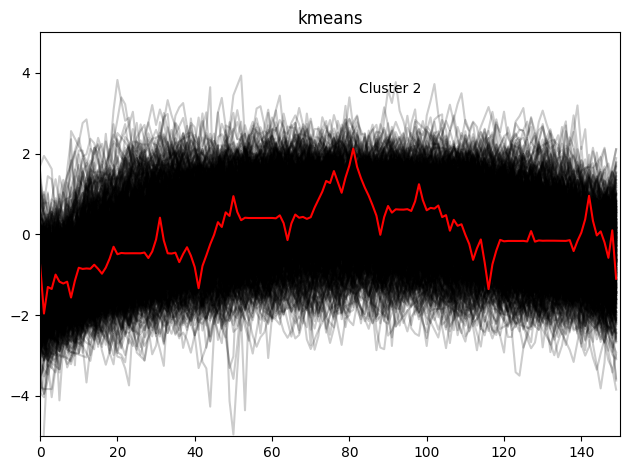

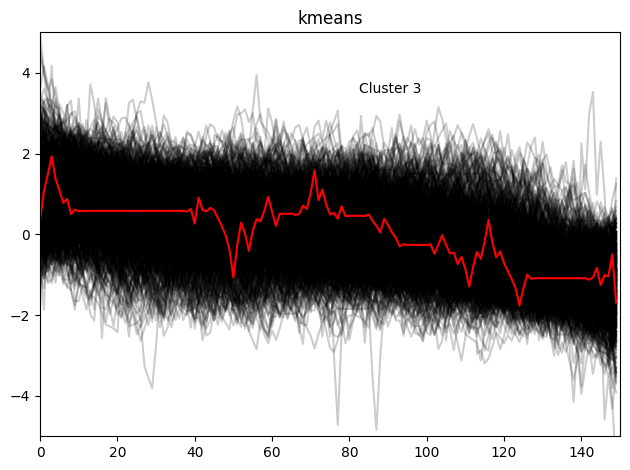

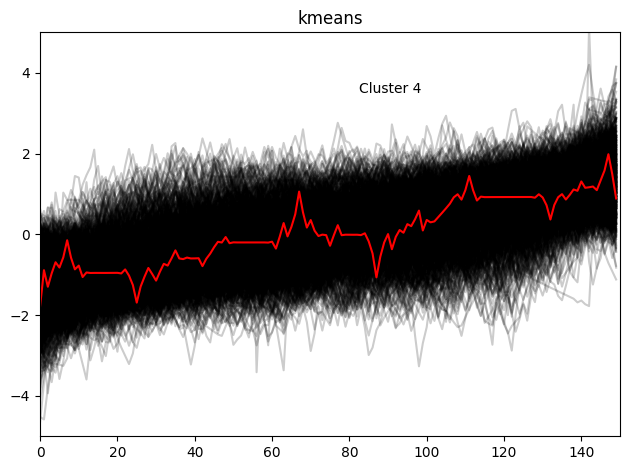

The 23.12% of the observations fall into Cluster 1
The 24.33% of the observations fall into Cluster 2
The 23.05% of the observations fall into Cluster 3
The 29.50% of the observations fall into Cluster 4


array([3, 1, 1, ..., 2, 3, 3])

In [14]:
kmeans_cluster(4,"kmeans_dtw_150",X_train,"dtw")

28031.47210317214
K = 2. Took 1295.34 seconds to calculate.
30582.43531552773
K = 3. Took 1423.72 seconds to calculate.
32754.763350075697
K = 4. Took 1599.05 seconds to calculate.
33874.185223726025
K = 5. Took 1769.38 seconds to calculate.
34681.20237367599
K = 6. Took 1942.20 seconds to calculate.
35492.66738873232
K = 7. Took 2106.19 seconds to calculate.
36029.00479016976
K = 8. Took 2318.15 seconds to calculate.
36640.23343685682
K = 9. Took 2495.28 seconds to calculate.


Text(0.5, 1.0, 'WCSSS analysis For Optimal K and Optimal Model')

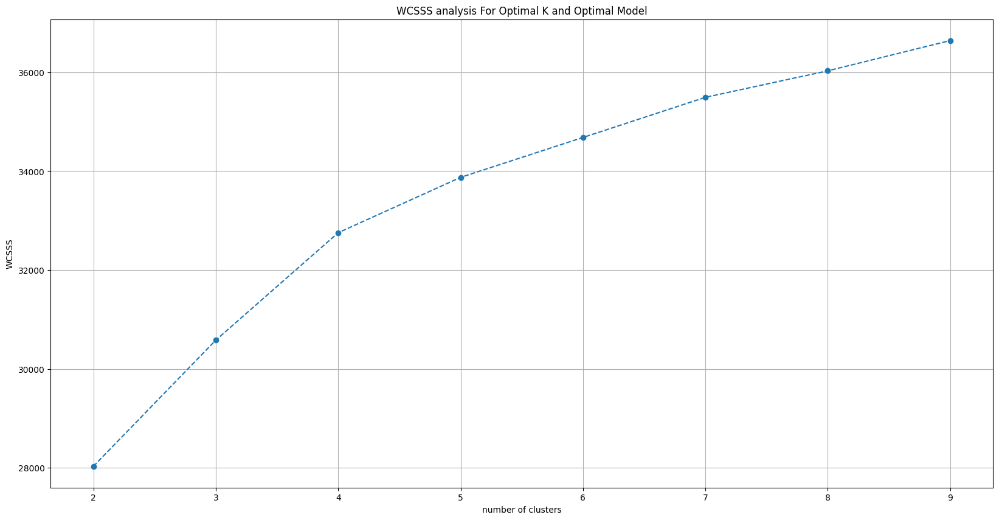

In [61]:
wcss=kmeans_wcsss(X_train,"softdtw",10)
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),wcss,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('WCSSS');
plt.title("WCSSS analysis For Optimal K and Optimal Model")

106.05494572811429
K = 2. Took 1.36 seconds to calculate.
94.46193763461304
K = 3. Took 4.91 seconds to calculate.
86.1490953094596
K = 4. Took 2.12 seconds to calculate.
81.78970751557267
K = 5. Took 2.81 seconds to calculate.
78.42916440462201
K = 6. Took 2.07 seconds to calculate.
75.66878152324425
K = 7. Took 5.25 seconds to calculate.
73.34281472323065
K = 8. Took 5.32 seconds to calculate.
71.5393124359093
K = 9. Took 4.97 seconds to calculate.


Text(0.5, 1.0, 'WCSSS analysis For Optimal K and Optimal Model')

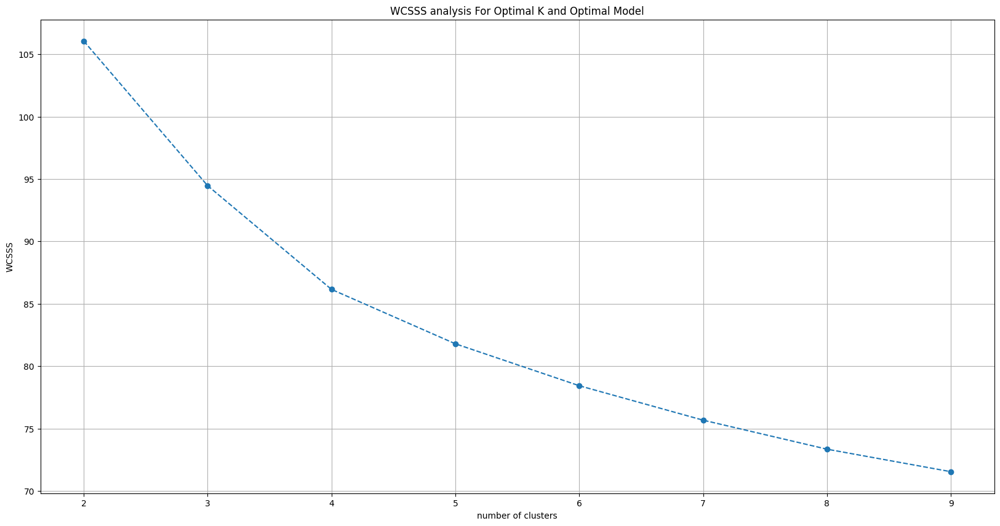

In [54]:
wcss=kmeans_wcsss(X_train,"euclidean",10)
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),wcss,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('WCSSS');
plt.title("WCSSS analysis For Optimal K and Optimal Model")

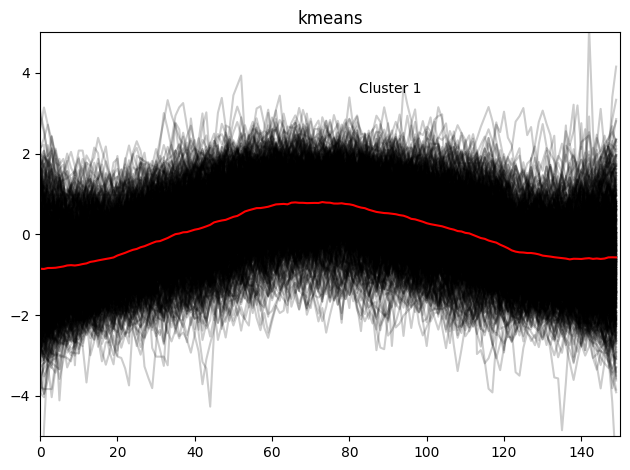

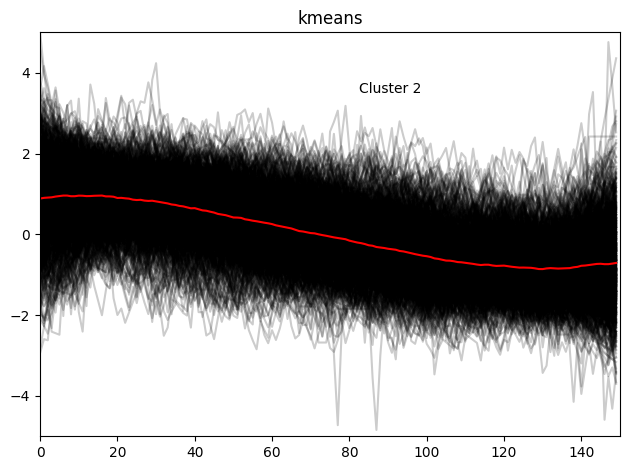

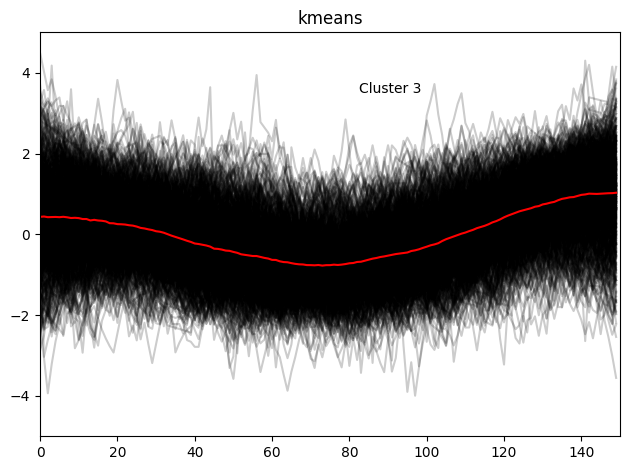

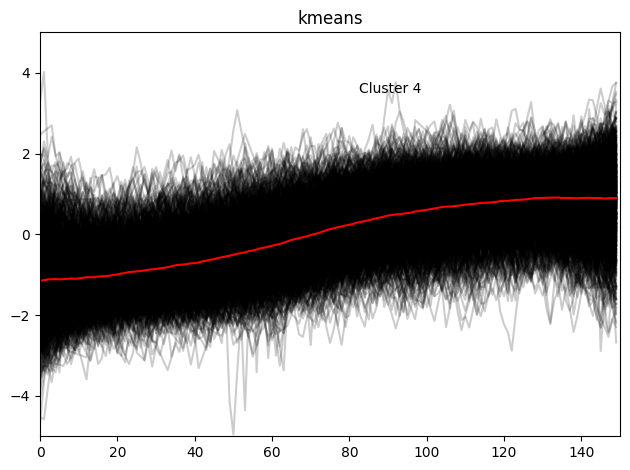

The 19.86% of the observations fall into Cluster 1
The 25.05% of the observations fall into Cluster 2
The 18.80% of the observations fall into Cluster 3
The 36.30% of the observations fall into Cluster 4


array([3, 1, 0, ..., 1, 3, 3])

In [52]:
kmeans_cluster(4,"kmeans_euclidean_150",X_train,"euclidean")

In [99]:
wcss=kmeans_wcsss(X_train,"dtw",16)
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,16),wcss,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('WCSSS');
plt.title("WCSSS analysis For Optimal K and Optimal Model")

K = 2. Took 599.68 seconds to calculate.
K = 3. Took 669.86 seconds to calculate.
K = 4. Took 1632.15 seconds to calculate.


KeyboardInterrupt: 

In [55]:
len(X_train[0])

150

In [ ]:
kmeans_cluster(9,"kmeans_dtw_150",X_train,"dtw")

In [106]:
df=pd.DataFrame.from_dict(get_samples(players_dict,50,50)).T
good_players=list(df.index)

In [101]:
with open("data/fics/dataset_raw/players_dict.pkl", 'rb') as f:
    players_dict=pickle.load( f)

In [108]:
good_players_dict={k:players_dict[k] for k in players_dict if k in good_players}

In [110]:
# order dates
for k,v in tqdm(good_players_dict.items()):
    curr=good_players_dict[k]
    curr["Timestamp"]=(curr["Date"]+" "+curr["Time"]).apply(lambda r:date_to_num(r))
    curr=curr.sort_values(by="Timestamp")
    good_players_dict[k]=curr.reset_index().drop(columns="index")



100%|██████████| 6329/6329 [00:40<00:00, 155.13it/s]


In [113]:
def get_samples_fix(players_dict,offset,num_samples):
    samples={}
    samples_dates={}
    samples_times={}
    samples_timesstamp={}
    for p in players_dict:
        v=players_dict[p]
        samples[p]=list(v[(v.index<=offset+num_samples)&(v.index>=offset)][["Elo"]])
        samples_dates[p]=list(v[(v.index<=offset+num_samples)&(v.index>=offset-1)]["Date"])
        samples_times[p]=list(v[(v.index<=offset+num_samples)&(v.index>=offset-1)]["Time"])
        samples_timesstamp[p]=list(v[(v.index<=offset+num_samples)&(v.index>=offset-1)]["Timestamp"])
    return samples,samples_dates,samples_times,samples_timesstamp


In [115]:
samples,samples_dates,samples_times,samples_timesstamp=get_samples_fix(good_players_dict,0,10)

In [123]:
dts={}
for p in samples:
    T=samples_timesstamp[p]
    dts[p]=[T[i]-T[i-1] for i in range(1,len(T)) ]
    X=list(list(df[df.index=="belberg"].values)[0])
    arr=[X[i]-X[i-1] for i in range(1,len(X)) ]
    arr=[str(x) for x in arr]



In [127]:
df=pd.DataFrame.from_dict(samples).T
df_T=pd.DataFrame.from_dict(dts).T


In [147]:
X=list(list(df[df.index=="belberg"].values)[0])
arr=[X[i]-X[i-1] for i in range(1,len(X)) ]

arr=[str(x) for x in arr]

In [148]:
print(".".join(arr))

15.-19.-10.19.-19.16.10.12.-19.-20


In [146]:
!pip install datasketch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.3/88.3 kB 635.1 kB/s eta 0:00:00a 0:00:01


In [21]:
def dx(x):
    x_array_dx=[x[i]-x[i-1] for i in range(1,len(x))]
    return x_array_dx

def get_samples_dx(players_dict,offset,num_samples):
    samples={}
    for p in players_dict:
        try:
            v=players_dict[p]
            arr=list(v[(v.index<offset+num_samples)&(v.index>=offset)]["Elo"])
            if len(arr)<num_samples:
                continue

            samples[p]=dx(arr)


        except Exception as err:
            print(err)
            pass
   
    
    return samples


In [4]:
df=pd.DataFrame.from_dict(get_samples_dx(players_dict,50,150)).T


NameError: name 'get_samples_dx' is not defined

In [23]:
df

,0,1,2,3,4,5,6,7,8,9,...,139,140,141,142,143,144,145,146,147,148
alexyao,-12,14,-11,15,-15,-8,0,6,-7,12,...,-7,-6,-7,9,9,-9,-1,7,-6,-7
talifhanil,-6,4,7,-9,7,-4,10,7,-9,6,...,-10,-9,-9,-7,-1,10,5,9,-7,-9
lonelyOne,8,-8,-9,-8,-8,9,-8,13,8,-9,...,-9,-7,-3,5,13,9,-6,6,-5,-10
neilbrown,-8,-3,9,-7,-4,-3,15,-2,-8,-3,...,-1,9,-2,-11,10,-2,15,-7,-4,-8
kjbkjn,11,8,-8,-13,4,8,4,-12,1,6,...,11,3,10,2,8,7,4,2,6,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
irishrover,-3,-1,6,11,-3,13,-7,8,-3,-3,...,12,10,7,11,-9,-6,-8,-2,-7,-6
Franchute,4,4,4,4,4,-3,5,5,5,-11,...,3,3,3,3,3,3,3,2,-14,3
MikolaPetrishenko,0,-7,2,0,-2,0,-14,-13,-10,0,...,0,0,-1,-3,0,0,-4,-1,0,0
theCassandra,7,8,7,-12,-2,-2,-2,-8,-3,-7,...,6,-10,5,-7,-7,-5,-5,-5,5,2


In [15]:
players_dict

{'carlchen':      Player   Elo        Date      Time  Year  Month  Day     Timestamp
 0  carlchen  1389  2017.02.19  14:44:00  2017      2   19  1.487515e+09
 1  carlchen  1328  2017.02.21  05:47:00  2017      2   21  1.487656e+09
 2  carlchen  1320  2017.03.01  13:27:00  2017      3    1  1.488375e+09
 3  carlchen  1410  2017.03.01  13:47:00  2017      3    1  1.488376e+09
 4  carlchen  1341  2017.03.02  13:19:00  2017      3    2  1.488461e+09
 5  carlchen  1333  2017.03.02  13:24:00  2017      3    2  1.488461e+09
 6  carlchen  1289  2017.06.02  10:52:00  2017      6    2  1.496401e+09
 7  carlchen  1284  2017.06.02  15:30:00  2017      6    2  1.496417e+09
 8  carlchen  1387  2017.06.03  02:59:00  2017      6    3  1.496459e+09,
 'alexyao':        Player   Elo        Date      Time  Year  Month  Day     Timestamp
 0     alexyao  1465  2016.01.01  15:24:00  2016      1    1  1.451662e+09
 1     alexyao  1460  2016.01.09  09:12:00  2016      1    9  1.452331e+09
 2     alexyao  1471 

In [24]:

%%time

# Standardizing (z-score normalization) a dataset involves rescaling the distribution of values
ss = StandardScaler()

scaled_ss = ss.fit_transform(df.T)
df_ss = pd.DataFrame(scaled_ss.T, columns=df.columns, index=df.index)
X_ss = df_ss.values
display(df_ss.head())

# Normalization
mm = MinMaxScaler()
scaled_mm = mm.fit_transform(df.T)
df_mm = pd.DataFrame(scaled_mm.T, columns=df.columns, index=df.index)
X_mm = df_mm.values
display(df_mm.head())


# convert dataframe to time_series_dataset
X = to_time_series_dataset(df.values)

# normalize time series to zero mean and unit variance
X_train = TimeSeriesScalerMeanVariance().fit_transform(X)

print(X.shape, X_train.shape)

,0,1,2,3,4,5,6,7,8,9,...,139,140,141,142,143,144,145,146,147,148
alexyao,-1.668366,1.713764,-1.538285,1.843846,-2.058612,-1.148039,-0.107383,0.673109,-1.017957,1.453600,...,-1.017957,-0.887875,-1.017957,1.063354,1.063354,-1.278121,-0.237465,0.803191,-0.887875,-1.017957
talifhanil,-0.740676,0.519150,0.897098,-1.118624,0.897098,-0.488711,1.275046,0.897098,-1.118624,0.771115,...,-1.244607,-1.118624,-1.118624,-0.866659,-0.110763,1.275046,0.645132,1.149063,-0.866659,-1.118624
lonelyOne,0.981386,-0.984685,-1.107564,-0.984685,-0.984685,1.104265,-0.984685,1.595783,0.981386,-1.107564,...,-1.107564,-0.861805,-0.370288,0.612748,1.595783,1.104265,-0.738926,0.735627,-0.616046,-1.230444
neilbrown,-1.135390,-0.432844,1.253267,-0.994881,-0.573353,-0.432844,2.096323,-0.292335,-1.135390,-0.432844,...,-0.151825,1.253267,-0.292335,-1.556918,1.393777,-0.292335,2.096323,-0.994881,-0.573353,-1.135390
kjbkjn,1.190166,0.777119,-1.425796,-2.114207,0.226390,0.777119,0.226390,-1.976525,-0.186656,0.501755,...,1.190166,0.088708,1.052483,-0.048974,0.777119,0.639437,0.226390,-0.048974,0.501755,0.777119


,0,1,2,3,4,5,6,7,8,9,...,139,140,141,142,143,144,145,146,147,148
alexyao,0.100000,0.966667,0.133333,1.000000,0.000000,0.233333,0.500000,0.700000,0.266667,0.900000,...,0.266667,0.300000,0.266667,0.800000,0.800000,0.200000,0.466667,0.733333,0.300000,0.266667
talifhanil,0.280000,0.680000,0.800000,0.160000,0.800000,0.360000,0.920000,0.800000,0.160000,0.760000,...,0.120000,0.160000,0.160000,0.240000,0.480000,0.920000,0.720000,0.880000,0.240000,0.160000
lonelyOne,0.782609,0.086957,0.043478,0.086957,0.086957,0.826087,0.086957,1.000000,0.782609,0.043478,...,0.043478,0.130435,0.304348,0.652174,1.000000,0.826087,0.173913,0.695652,0.217391,0.000000
neilbrown,0.115385,0.307692,0.769231,0.153846,0.269231,0.307692,1.000000,0.346154,0.115385,0.307692,...,0.384615,0.769231,0.346154,0.000000,0.807692,0.346154,1.000000,0.153846,0.269231,0.115385
kjbkjn,0.866667,0.766667,0.233333,0.066667,0.633333,0.766667,0.633333,0.100000,0.533333,0.700000,...,0.866667,0.600000,0.833333,0.566667,0.766667,0.733333,0.633333,0.566667,0.700000,0.766667


(4160, 149, 1) (4160, 149, 1)
CPU times: user 369 ms, sys: 15.5 ms, total: 384 ms
Wall time: 393 ms


K = 2. Took 3.26 seconds to calculate.
K = 3. Took 4.11 seconds to calculate.
K = 4. Took 4.90 seconds to calculate.
K = 5. Took 5.16 seconds to calculate.
K = 6. Took 5.02 seconds to calculate.
K = 7. Took 5.12 seconds to calculate.
K = 8. Took 3.96 seconds to calculate.
K = 9. Took 4.05 seconds to calculate.
K = 10. Took 3.81 seconds to calculate.
K = 11. Took 3.95 seconds to calculate.
K = 12. Took 4.56 seconds to calculate.
K = 13. Took 3.90 seconds to calculate.
K = 14. Took 5.13 seconds to calculate.
K = 15. Took 3.84 seconds to calculate.
K = 16. Took 4.20 seconds to calculate.
K = 17. Took 4.74 seconds to calculate.
K = 18. Took 2.94 seconds to calculate.
K = 19. Took 2.39 seconds to calculate.
K = 20. Took 3.89 seconds to calculate.
K = 21. Took 3.79 seconds to calculate.
K = 22. Took 2.82 seconds to calculate.
K = 23. Took 3.06 seconds to calculate.
K = 24. Took 3.47 seconds to calculate.
K = 25. Took 4.51 seconds to calculate.
K = 26. Took 4.72 seconds to calculate.
K = 27. 

Text(0.5, 1.0, 'WCSSS analysis For Optimal K and Optimal Model')

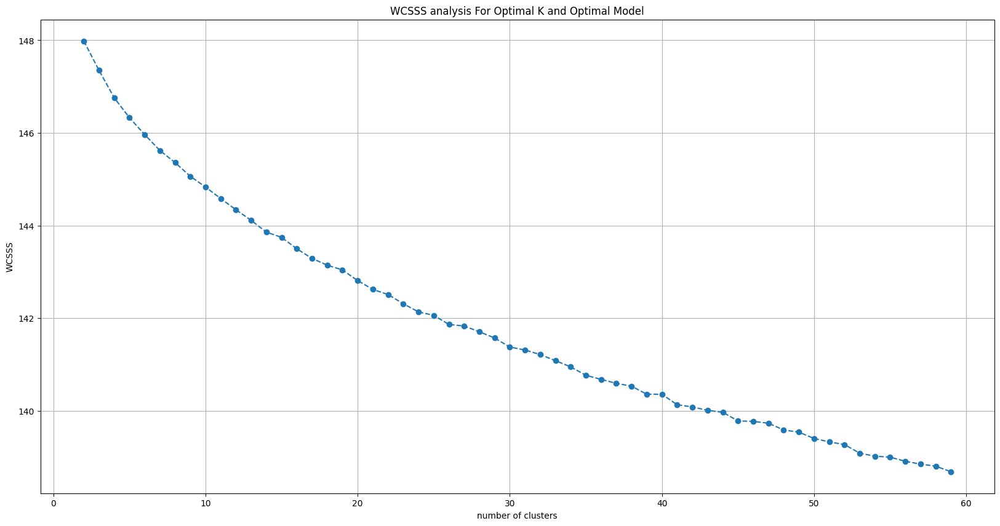

In [27]:
wcss=kmeans_wcsss(X_train,"euclidean",60)
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,60),wcss,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('WCSSS');
plt.title("WCSSS analysis For Optimal K and Optimal Model")

In [ ]:
from scipy.signal import savgol_filter
def get_samples_dx2(players_dict,offset,num_samples):
    samples={}
    for p in players_dict:
        try:
            v=players_dict[p]
            arr=list(v[(v.index<offset+num_samples)&(v.index>=offset)]["Elo"])

            if len(arr)<num_samples:
                continue

            samples[p]=savgol_filter(arr,2,2)


        except Exception as err:
            print(err)
            pass
   
    
    return samples


K = 2. Took 5.09 seconds to calculate.
K = 3. Took 5.56 seconds to calculate.
K = 4. Took 4.48 seconds to calculate.
K = 5. Took 5.58 seconds to calculate.
K = 6. Took 5.05 seconds to calculate.
K = 7. Took 4.73 seconds to calculate.
K = 8. Took 5.57 seconds to calculate.
K = 9. Took 5.31 seconds to calculate.
K = 10. Took 5.11 seconds to calculate.
K = 11. Took 5.35 seconds to calculate.
K = 12. Took 5.48 seconds to calculate.
K = 13. Took 5.49 seconds to calculate.
K = 14. Took 5.33 seconds to calculate.
K = 15. Took 5.33 seconds to calculate.
K = 16. Took 5.47 seconds to calculate.
K = 17. Took 5.50 seconds to calculate.
K = 18. Took 4.99 seconds to calculate.
K = 19. Took 5.37 seconds to calculate.
K = 20. Took 5.34 seconds to calculate.
K = 21. Took 5.05 seconds to calculate.
K = 22. Took 4.84 seconds to calculate.
K = 23. Took 4.71 seconds to calculate.
K = 24. Took 5.23 seconds to calculate.
K = 25. Took 5.95 seconds to calculate.
K = 26. Took 3.73 seconds to calculate.
K = 27. 

Text(0.5, 1.0, 'WCSSS analysis For Optimal K and Optimal Model')

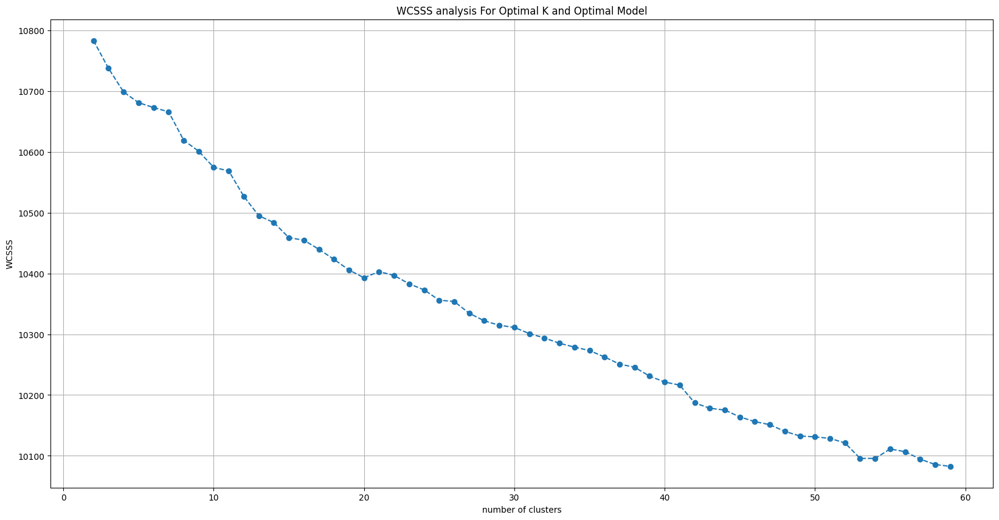

In [28]:
wcss=kmeans_wcsss(X,"euclidean",60)
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,60),wcss,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('WCSSS');
plt.title("WCSSS analysis For Optimal K and Optimal Model")

,0,1,2,3,4,5,6,7,8,9,...,140,141,142,143,144,145,146,147,148,149
alexyao,-1.733337,-1.955322,-1.696339,-1.899826,-1.622344,-1.899826,-2.047816,-2.047816,-1.936823,-2.066315,...,0.745501,0.634508,0.505017,0.671506,0.837995,0.671506,0.653007,0.782499,0.671506,0.542015
talifhanil,-1.016111,-1.319126,-1.117116,-0.763598,-1.218121,-0.864604,-1.066614,-0.561588,-0.208070,-0.662593,...,-1.016111,-1.470634,-1.925157,-2.278675,-2.329177,-1.824152,-1.571639,-1.117116,-1.470634,-1.925157
lonelyOne,-0.366580,0.233551,-0.366580,-1.041726,-1.641857,-2.241987,-1.566841,-2.166971,-1.191759,-0.591629,...,-0.366580,-0.891694,-1.116743,-0.741661,0.233551,0.908698,0.458600,0.908698,0.533616,-0.216547
neilbrown,0.088210,-0.179093,-0.279331,0.021384,-0.212505,-0.346157,-0.446395,0.054797,-0.012029,-0.279331,...,0.489163,0.789879,0.723053,0.355512,0.689640,0.622815,1.124007,0.890117,0.756466,0.489163
kjbkjn,-0.774859,-0.679233,-0.609687,-0.679233,-0.792245,-0.757472,-0.687926,-0.653153,-0.757472,-0.748779,...,1.841811,1.867891,1.954824,1.972210,2.041756,2.102609,2.137382,2.154769,2.206928,2.276474


,0,1,2,3,4,5,6,7,8,9,...,140,141,142,143,144,145,146,147,148,149
alexyao,0.098361,0.032787,0.109290,0.049180,0.131148,0.049180,0.005464,0.005464,0.038251,0.000000,...,0.830601,0.797814,0.759563,0.808743,0.857923,0.808743,0.803279,0.841530,0.808743,0.770492
talifhanil,0.257426,0.198020,0.237624,0.306931,0.217822,0.287129,0.247525,0.346535,0.415842,0.326733,...,0.257426,0.168317,0.079208,0.009901,0.000000,0.099010,0.148515,0.237624,0.168317,0.079208
lonelyOne,0.413333,0.520000,0.413333,0.293333,0.186667,0.080000,0.200000,0.093333,0.266667,0.373333,...,0.413333,0.320000,0.280000,0.346667,0.520000,0.640000,0.560000,0.640000,0.573333,0.440000
neilbrown,0.488722,0.428571,0.406015,0.473684,0.421053,0.390977,0.368421,0.481203,0.466165,0.406015,...,0.578947,0.646617,0.631579,0.548872,0.624060,0.609023,0.721805,0.669173,0.639098,0.578947
kjbkjn,0.133333,0.160494,0.180247,0.160494,0.128395,0.138272,0.158025,0.167901,0.138272,0.140741,...,0.876543,0.883951,0.908642,0.913580,0.933333,0.950617,0.960494,0.965432,0.980247,1.000000


(4160, 150, 1) (4160, 150, 1)
106.05494572811429
K = 2. Took 1.54 seconds to calculate.
94.46193763461304
K = 3. Took 5.00 seconds to calculate.
86.1490953094596
K = 4. Took 2.24 seconds to calculate.
81.78970751557267
K = 5. Took 2.77 seconds to calculate.
78.42916440462201
K = 6. Took 2.07 seconds to calculate.
75.66878152324425
K = 7. Took 4.91 seconds to calculate.
73.34281472323065
K = 8. Took 5.03 seconds to calculate.
71.5393124359093
K = 9. Took 5.09 seconds to calculate.


Text(0.5, 1.0, 'WCSSS analysis For Optimal K and Optimal Model')

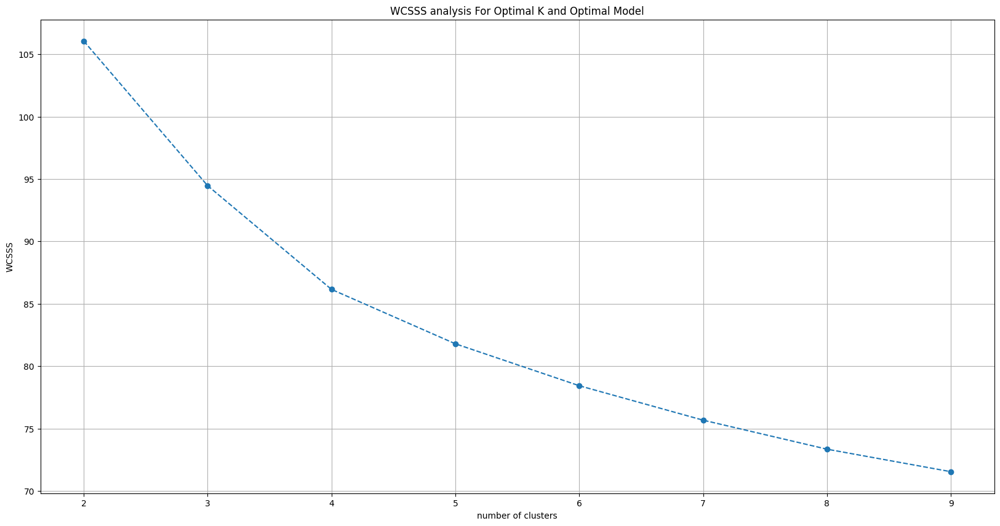

In [48]:
from scipy.signal import savgol_filter
def get_samples_dx2(players_dict,offset,num_samples):
    samples={}
    for p in players_dict:
        try:
            v=players_dict[p]
            arr=list(v[(v.index<offset+num_samples)&(v.index>=offset)]["Elo"])

            if len(arr)<num_samples:
                continue

            samples[p]=savgol_filter(arr,3,2)


        except Exception as err:
            print(err)
            pass
   
    
    return samples

df=pd.DataFrame.from_dict(get_samples_dx2(players_dict,50,150)).T


# Standardizing (z-score normalization) a dataset involves rescaling the distribution of values
ss = StandardScaler()

scaled_ss = ss.fit_transform(df.T)
df_ss = pd.DataFrame(scaled_ss.T, columns=df.columns, index=df.index)
X_ss = df_ss.values
display(df_ss.head())

# Normalization
mm = MinMaxScaler()
scaled_mm = mm.fit_transform(df.T)
df_mm = pd.DataFrame(scaled_mm.T, columns=df.columns, index=df.index)
X_mm = df_mm.values
display(df_mm.head())


# convert dataframe to time_series_dataset
X = to_time_series_dataset(df.values)

# normalize time series to zero mean and unit variance
X_train = TimeSeriesScalerMeanVariance().fit_transform(X)

print(X.shape, X_train.shape)



wcss=kmeans_wcsss(X_train,"euclidean",10)
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),wcss,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('WCSSS');
plt.title("WCSSS analysis For Optimal K and Optimal Model")

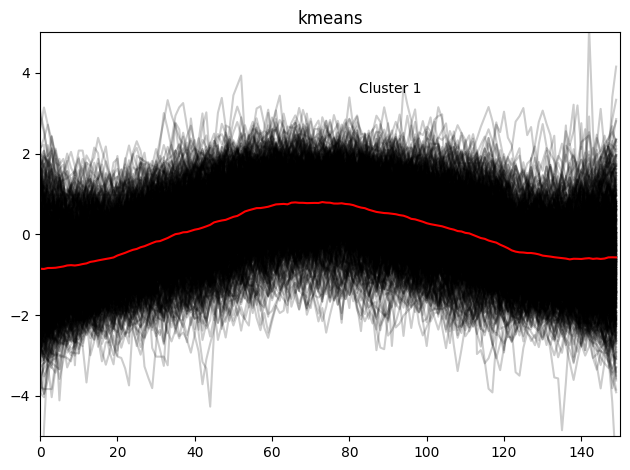

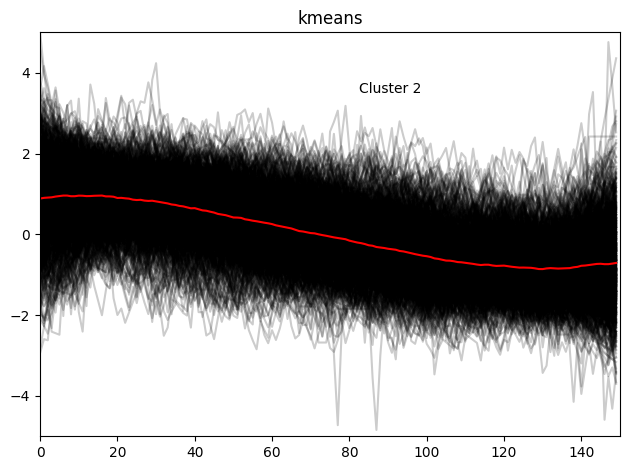

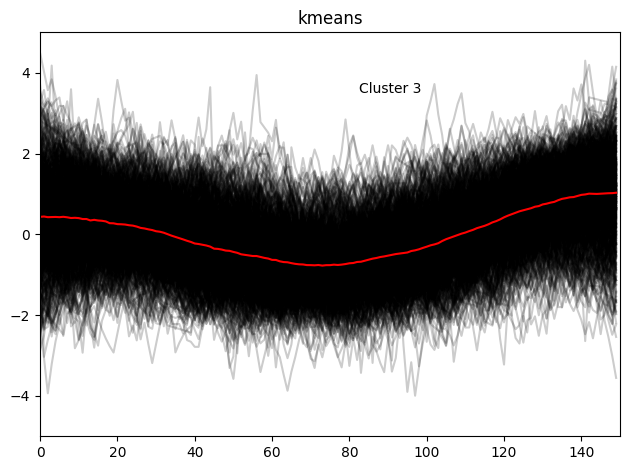

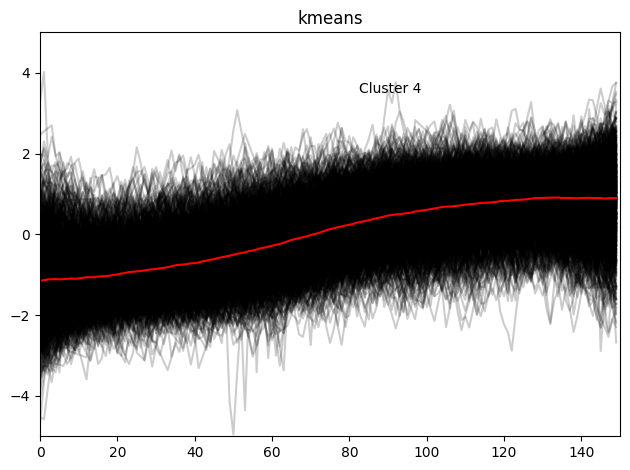

The 19.86% of the observations fall into Cluster 1
The 25.05% of the observations fall into Cluster 2
The 18.80% of the observations fall into Cluster 3
The 36.30% of the observations fall into Cluster 4


array([3, 1, 0, ..., 1, 3, 3])

In [34]:
kmeans_cluster(4,"kmeans_euclidean0",X_train,"euclidean")

,0,1,2,3,4,5,6,7,8,9,...,140,141,142,143,144,145,146,147,148,149
alexyao,-1.756507,-1.849789,-1.821804,-1.784491,-1.784491,-1.999041,-2.073667,-2.017697,-2.027025,-1.980384,...,0.687491,0.566224,0.584880,0.752789,0.752789,0.659506,0.715476,0.724804,0.603537,0.538239
talifhanil,-1.031363,-1.236814,-0.954319,-1.005682,-1.057044,-0.980000,-0.825912,-0.389329,-0.440692,-0.517736,...,-1.262495,-1.724759,-2.135661,-2.341112,-2.109979,-1.724759,-1.365220,-1.313858,-1.724759,-1.955891
lonelyOne,-0.383124,-0.068228,-0.737383,-1.406538,-2.036332,-1.996970,-1.957607,-1.760797,-0.934193,-0.973555,...,-0.658659,-1.052280,-0.973555,-0.265038,0.600928,0.719014,0.719014,0.758376,0.167945,-0.225676
neilbrown,0.086557,-0.232987,-0.132078,-0.098442,-0.283441,-0.401168,-0.199351,0.019285,-0.148896,-0.333895,...,0.641555,0.759282,0.540646,0.523828,0.658373,0.877008,1.011553,0.826554,0.624737,0.490192
kjbkjn,-0.779060,-0.649600,-0.649600,-0.740222,-0.779060,-0.727276,-0.675492,-0.710015,-0.757483,-0.727276,...,1.831712,1.887811,1.939595,1.982748,2.047478,2.094947,2.120838,2.155361,2.215776,2.250298


,0,1,2,3,4,5,6,7,8,9,...,140,141,142,143,144,145,146,147,148,149
alexyao,0.094183,0.066482,0.074792,0.085873,0.085873,0.022161,0.000000,0.016620,0.013850,0.027701,...,0.819945,0.783934,0.789474,0.839335,0.839335,0.811634,0.828255,0.831025,0.795014,0.775623
talifhanil,0.261538,0.220513,0.276923,0.266667,0.256410,0.271795,0.302564,0.389744,0.379487,0.364103,...,0.215385,0.123077,0.041026,0.000000,0.046154,0.123077,0.194872,0.205128,0.123077,0.076923
lonelyOne,0.398496,0.458647,0.330827,0.203008,0.082707,0.090226,0.097744,0.135338,0.293233,0.285714,...,0.345865,0.270677,0.285714,0.421053,0.586466,0.609023,0.609023,0.616541,0.503759,0.428571
neilbrown,0.492187,0.417969,0.441406,0.449219,0.406250,0.378906,0.425781,0.476562,0.437500,0.394531,...,0.621094,0.648438,0.597656,0.593750,0.625000,0.675781,0.707031,0.664062,0.617188,0.585937
kjbkjn,0.126866,0.164179,0.164179,0.138060,0.126866,0.141791,0.156716,0.146766,0.133085,0.141791,...,0.879353,0.895522,0.910448,0.922886,0.941542,0.955224,0.962687,0.972637,0.990050,1.000000


(4160, 150, 1) (4160, 150, 1)
105.33425419717683
K = 2. Took 1.08 seconds to calculate.
94.06080363874429
K = 3. Took 1.09 seconds to calculate.
85.30627743584489
K = 4. Took 4.55 seconds to calculate.
80.61594988073603
K = 5. Took 3.70 seconds to calculate.
76.91459159662429
K = 6. Took 4.27 seconds to calculate.
74.38652503669708
K = 7. Took 5.09 seconds to calculate.
71.65805874297455
K = 8. Took 4.21 seconds to calculate.
70.0842144031147
K = 9. Took 3.73 seconds to calculate.


Text(0.5, 1.0, 'WCSSS analysis For Optimal K and Optimal Model')

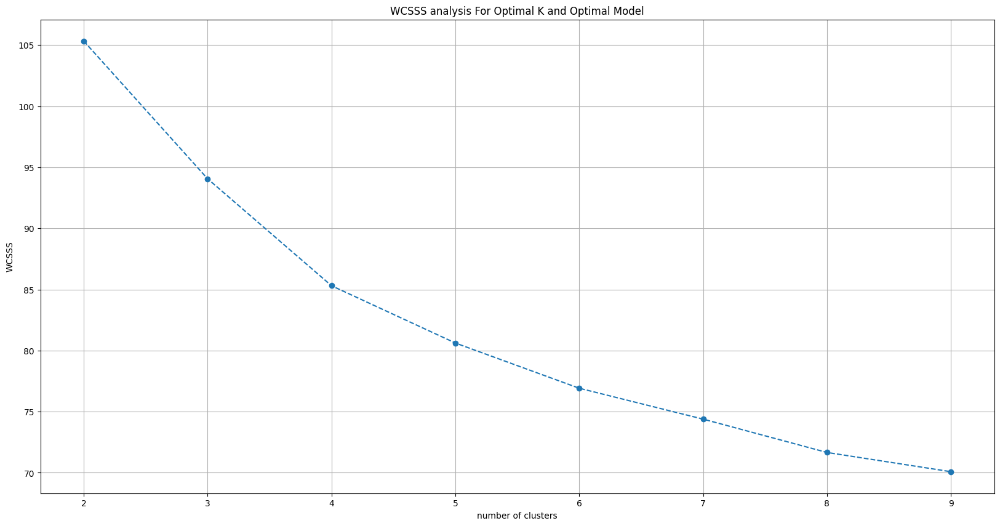

In [45]:
from scipy.signal import savgol_filter
def get_samples_dx2(players_dict,offset,num_samples):
    samples={}
    for p in players_dict:
        try:
            v=players_dict[p]
            arr=list(v[(v.index<offset+num_samples)&(v.index>=offset)]["Elo"])

            if len(arr)<num_samples:
                continue

            samples[p]=savgol_filter(arr,2,1)


        except Exception as err:
            print(err)
            pass
   
    
    return samples

df=pd.DataFrame.from_dict(get_samples_dx2(players_dict,50,150)).T


# Standardizing (z-score normalization) a dataset involves rescaling the distribution of values
ss = StandardScaler()

scaled_ss = ss.fit_transform(df.T)
df_ss = pd.DataFrame(scaled_ss.T, columns=df.columns, index=df.index)
X_ss = df_ss.values
display(df_ss.head())

# Normalization
mm = MinMaxScaler()
scaled_mm = mm.fit_transform(df.T)
df_mm = pd.DataFrame(scaled_mm.T, columns=df.columns, index=df.index)
X_mm = df_mm.values
display(df_mm.head())


# convert dataframe to time_series_dataset
X = to_time_series_dataset(df.values)

# normalize time series to zero mean and unit variance
X_train = TimeSeriesScalerMeanVariance().fit_transform(X)

print(X.shape, X_train.shape)



wcss=kmeans_wcsss(X_train,"euclidean",10)
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),wcss,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('WCSSS');
plt.title("WCSSS analysis For Optimal K and Optimal Model")

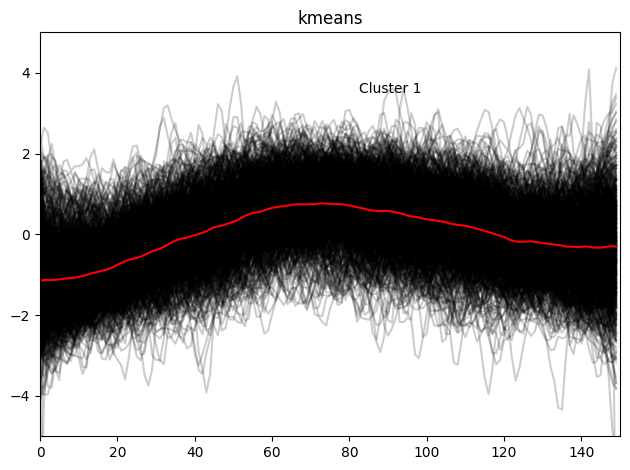

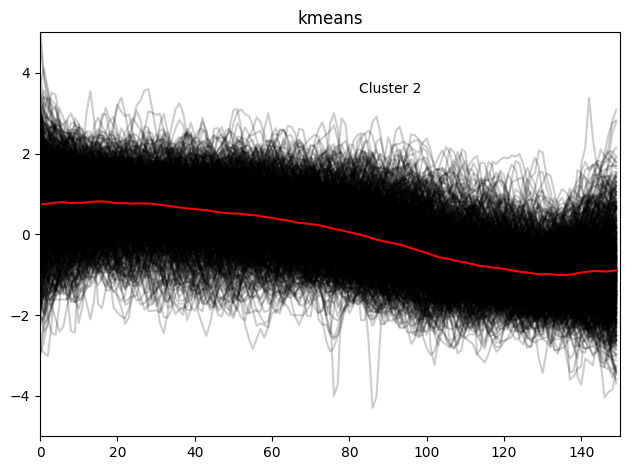

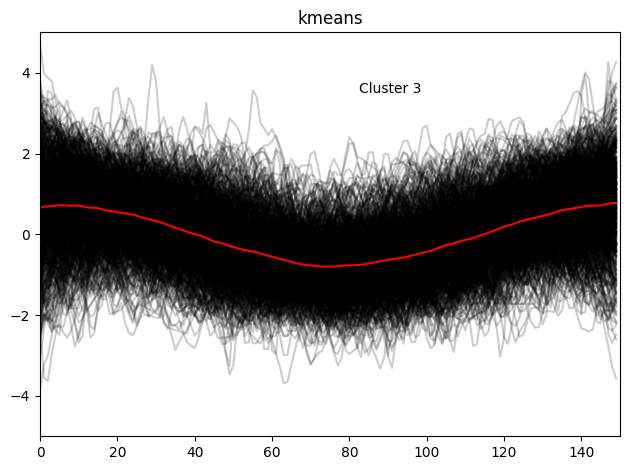

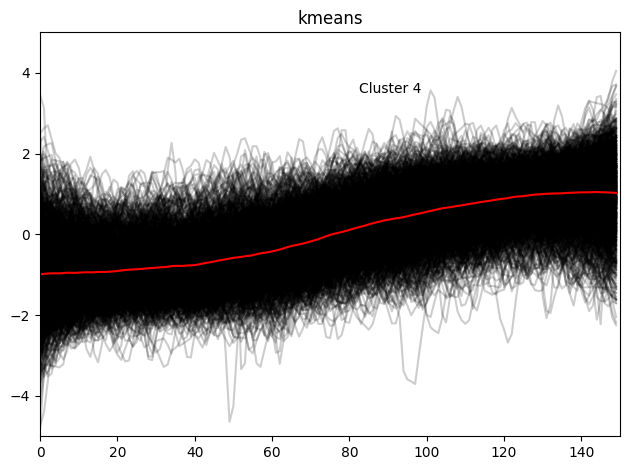

The 21.01% of the observations fall into Cluster 1
The 24.83% of the observations fall into Cluster 2
The 18.56% of the observations fall into Cluster 3
The 35.60% of the observations fall into Cluster 4


array([3, 1, 0, ..., 1, 3, 3])

In [46]:
kmeans_cluster(4,"kmeans_euclidean1",X_train,"euclidean")

In [25]:
from scipy.optimize import curve_fit
from statsmodels.tsa.holtwinters import SimpleExpSmoothing,Holt

def get_samples_dx2(players_dict,offset,num_samples):
    samples={}
    for p in players_dict:
        try:
            v=players_dict[p]
            arr=(v[(v.index<offset+num_samples)&(v.index>=offset)]["Elo"])

            if len(arr)<num_samples:
                continue
            samples[p]=list(SimpleExpSmoothing(arr).fit(smoothing_level=0.2,optimized=False).fittedvalues)


        except Exception as err:
            print(err)
            pass
   
    
    return samples

df=pd.DataFrame.from_dict(get_samples_dx2(players_dict,50,150)).T


# Standardizing (z-score normalization) a dataset involves rescaling the distribution of values
ss = StandardScaler()

scaled_ss = ss.fit_transform(df.T)
df_ss = pd.DataFrame(scaled_ss.T, columns=df.columns, index=df.index)
X_ss = df_ss.values
display(df_ss.head())

# Normalization
mm = MinMaxScaler()
scaled_mm = mm.fit_transform(df.T)
df_mm = pd.DataFrame(scaled_mm.T, columns=df.columns, index=df.index)
X_mm = df_mm.values
display(df_mm.head())


# convert dataframe to time_series_dataset
X = to_time_series_dataset(df.values)

# normalize time series to zero mean and unit variance
X_train = TimeSeriesScalerMeanVariance().fit_transform(X)

print(X.shape, X_train.shape)





,0,1,2,3,4,5,6,7,8,9,...,140,141,142,143,144,145,146,147,148,149
alexyao,-1.621745,-1.621745,-1.665317,-1.649341,-1.676500,-1.643763,-1.672039,-1.723707,-1.765041,-1.776323,...,1.016340,0.975276,0.920639,0.851512,0.828890,0.843471,0.822456,0.802014,0.811077,0.796542
talifhanil,-1.345432,-1.345432,-1.424342,-1.434863,-1.351219,-1.402668,-1.351766,-1.363651,-1.241641,-1.051972,...,-0.365409,-0.561413,-0.836583,-1.175083,-1.537946,-1.841388,-1.952625,-1.975855,-1.876074,-1.888311
lonelyOne,-0.534593,-0.534593,-0.349584,-0.386586,-0.624323,-0.999523,-1.484693,-1.664692,-1.993702,-1.956269,...,0.842928,0.567424,0.185137,-0.190071,-0.374607,-0.221594,0.108952,0.234631,0.473932,0.549742
neilbrown,0.114905,0.114905,0.058228,-0.008367,0.002118,-0.039086,-0.100388,-0.170683,-0.120650,-0.094793,...,0.620995,0.604792,0.655591,0.682062,0.625307,0.650750,0.656934,0.768151,0.807533,0.810699
kjbkjn,-0.739680,-0.739680,-0.718860,-0.687064,-0.676768,-0.693135,-0.698659,-0.687936,-0.671788,-0.681581,...,1.924472,1.961334,1.996501,2.043561,2.084995,2.133283,2.185162,2.234236,2.277281,2.323072


,0,1,2,3,4,5,6,7,8,9,...,140,141,142,143,144,145,146,147,148,149
alexyao,0.061958,0.061958,0.047676,0.052913,0.044010,0.054741,0.045473,0.028537,0.014988,0.011290,...,0.926685,0.913225,0.895316,0.872657,0.865242,0.870021,0.863133,0.856432,0.859403,0.854639
talifhanil,0.141059,0.141059,0.123403,0.121048,0.139764,0.128252,0.139642,0.136983,0.164282,0.206722,...,0.360342,0.316485,0.254915,0.179175,0.097983,0.030087,0.005198,0.000000,0.022326,0.019588
lonelyOne,0.304180,0.304180,0.342749,0.335035,0.285474,0.207256,0.106113,0.068589,0.000000,0.007804,...,0.591351,0.533917,0.454222,0.376002,0.337532,0.369431,0.438340,0.464540,0.514427,0.530231
neilbrown,0.511844,0.511844,0.496028,0.477444,0.480370,0.468872,0.451765,0.432149,0.446111,0.453326,...,0.653071,0.648549,0.662725,0.670112,0.654274,0.661374,0.663100,0.694136,0.705125,0.706009
kjbkjn,0.099694,0.099694,0.105814,0.115161,0.118188,0.113376,0.111753,0.114904,0.119651,0.116773,...,0.882830,0.893666,0.904003,0.917837,0.930016,0.944211,0.959461,0.973886,0.986539,1.000000


(4160, 150, 1) (4160, 150, 1)


99.0107695083468
K = 2. Took 1.06 seconds to calculate.
86.14741795441685
K = 3. Took 2.22 seconds to calculate.
76.73916721685708
K = 4. Took 5.24 seconds to calculate.
71.33488421442212
K = 5. Took 5.03 seconds to calculate.
67.50258785777731
K = 6. Took 5.67 seconds to calculate.
64.33989340996442
K = 7. Took 5.51 seconds to calculate.
61.968974223515424
K = 8. Took 5.57 seconds to calculate.
60.35636077067467
K = 9. Took 5.37 seconds to calculate.


Text(0.5, 1.0, 'WCSSS analysis For Optimal K and Optimal Model')

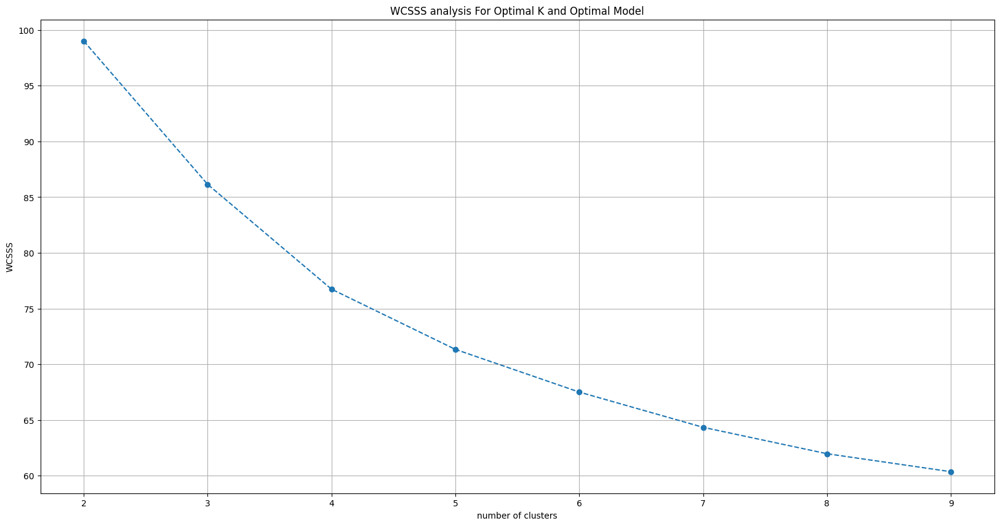

In [26]:

wcss=kmeans_wcsss(X_train,"euclidean",10)
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),wcss,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('WCSSS');
plt.title("WCSSS analysis For Optimal K and Optimal Model")


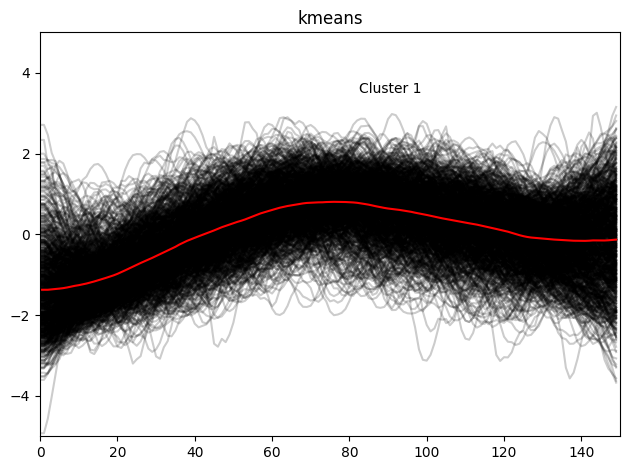

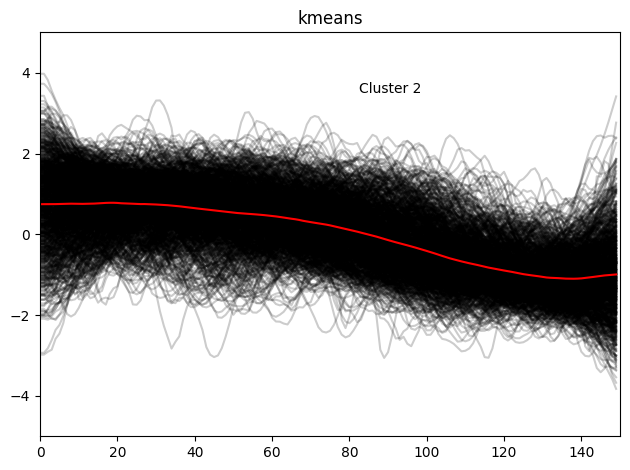

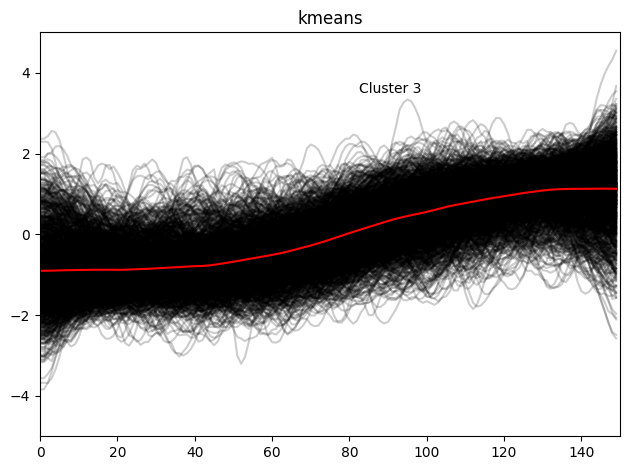

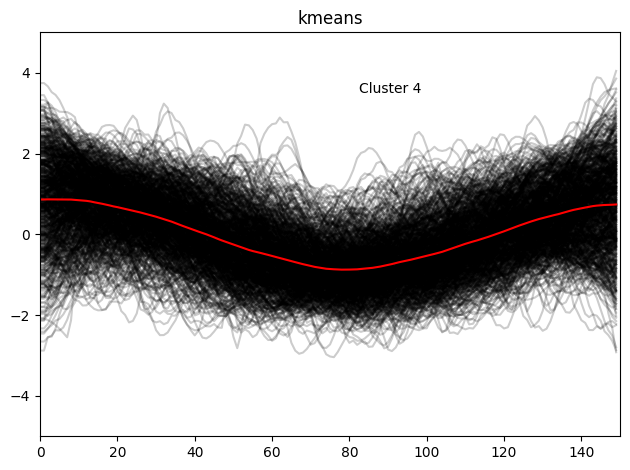

The 21.85% of the observations fall into Cluster 1
The 25.62% of the observations fall into Cluster 2
The 34.81% of the observations fall into Cluster 3
The 17.72% of the observations fall into Cluster 4


array([2, 1, 0, ..., 1, 2, 2])

In [27]:
kmeans_cluster(4,"kmeans_euclidean_smooth_exp",X_train,"euclidean")

16.9595833128189
K = 2. Took 285.09 seconds to calculate.
13.927983675822281
K = 3. Took 460.82 seconds to calculate.
11.499368623338665
K = 4. Took 648.43 seconds to calculate.
10.703618451289616
K = 5. Took 782.39 seconds to calculate.
9.937686264500634
K = 6. Took 824.31 seconds to calculate.
9.149896710571053
K = 7. Took 705.16 seconds to calculate.
8.63611233332384
K = 8. Took 682.67 seconds to calculate.
8.178396999844352
K = 9. Took 463.43 seconds to calculate.


Text(0.5, 1.0, 'WCSSS analysis For Optimal K and Optimal Model')

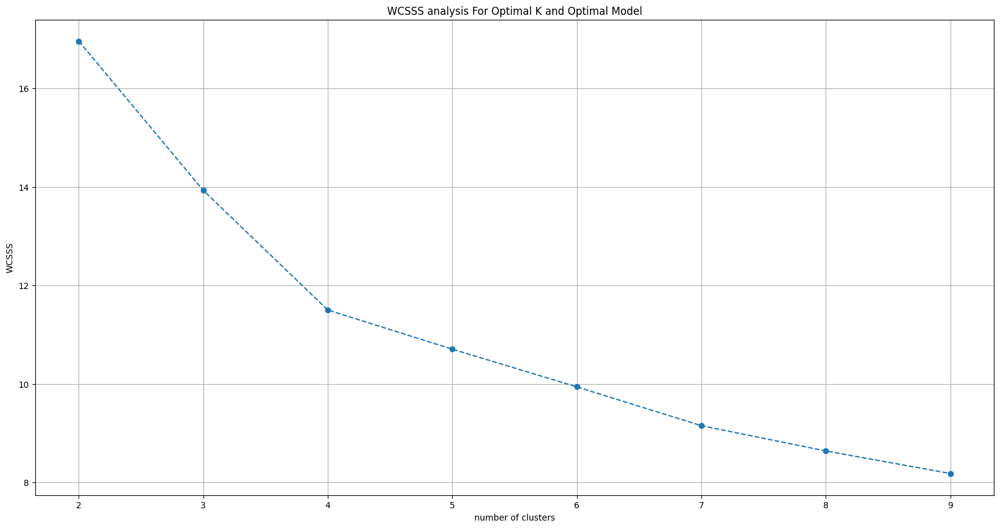

In [29]:
wcss=kmeans_wcsss(X_train,"dtw",10)
plt.figure(figsize=(20,10))
plt.grid()
plt.plot(range(2,10),wcss,marker='o',linestyle='--')
plt.xlabel('number of clusters')
plt.ylabel('WCSSS');
plt.title("WCSSS analysis For Optimal K and Optimal Model")

In [126]:
len(X_train)

4160

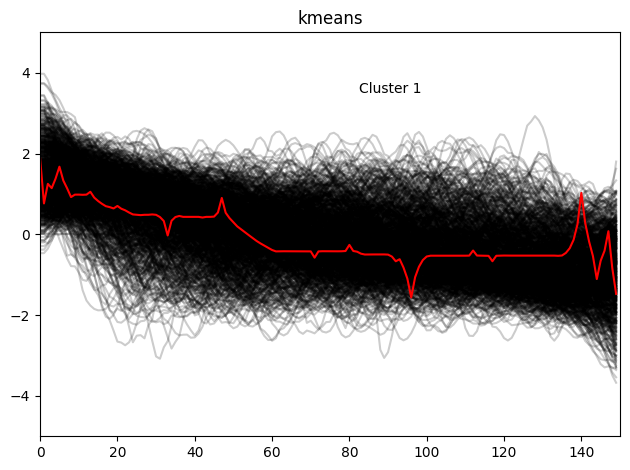

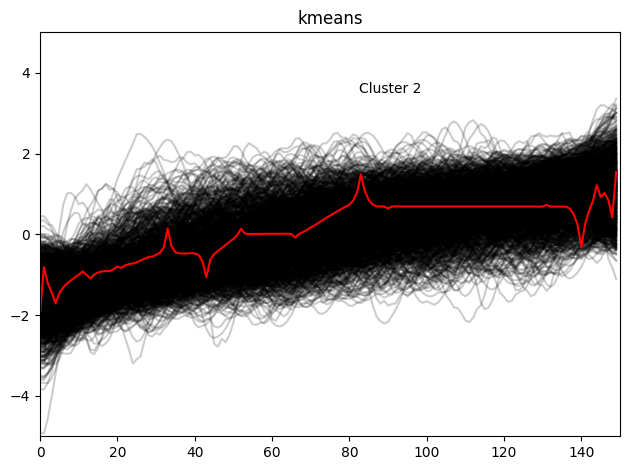

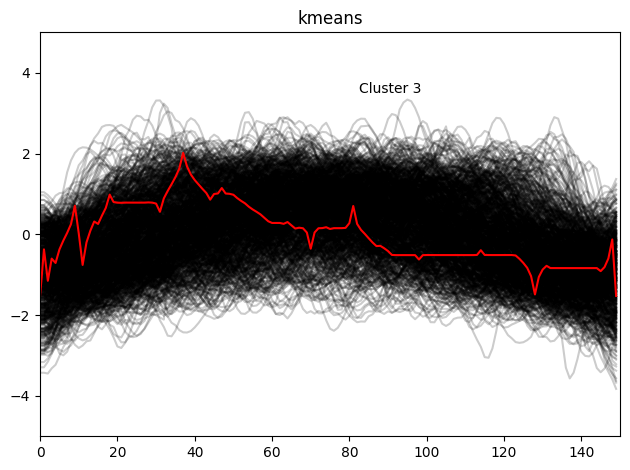

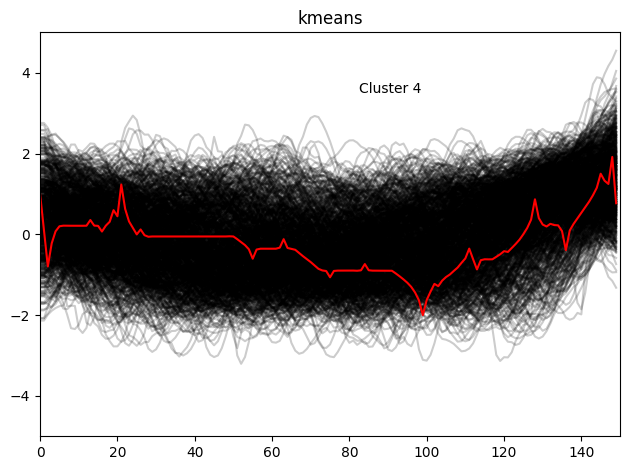

The 23.41% of the observations fall into Cluster 1
The 32.45% of the observations fall into Cluster 2
The 21.44% of the observations fall into Cluster 3
The 22.69% of the observations fall into Cluster 4


array([1, 2, 2, ..., 0, 1, 1])

In [28]:
kmeans_cluster(4,"kmeans_dtw_smooth_exp",X_train,"dtw")

s

In [30]:
%matplotlib inline
%load_ext autoreload
%autoreload 2


In [31]:
df

,0,1,2,3,4,5,6,7,8,9,...,140,141,142,143,144,145,146,147,148,149
alexyao,1539.0,1539.0,1536.6,1537.48,1535.984,1537.7872,1536.22976,1533.383808,1531.107046,1530.485637,...,1684.309323,1682.047458,1679.037967,1675.230373,1673.984299,1674.787439,1673.629951,1672.503961,1673.003169,1672.202535
talifhanil,1448.0,1448.0,1446.8,1446.64,1447.912,1447.1296,1447.90368,1447.722944,1449.578355,1452.462684,...,1462.903335,1459.922668,1455.738134,1450.590507,1445.072406,1440.457925,1438.766340,1438.413072,1439.930457,1439.744366
lonelyOne,1696.0,1696.0,1697.6,1697.28,1695.224,1691.9792,1687.78336,1686.226688,1683.381350,1683.705080,...,1707.913068,1705.530455,1702.224364,1698.979491,1697.383593,1698.706874,1701.565499,1702.652400,1704.721920,1705.377536
neilbrown,1377.0,1377.0,1375.4,1373.52,1373.816,1372.6528,1370.92224,1368.937792,1370.350234,1371.080187,...,1391.287026,1390.829621,1392.263697,1393.010957,1391.408766,1392.127013,1392.301610,1395.441288,1396.553030,1396.642424
kjbkjn,1481.0,1481.0,1483.2,1486.56,1487.648,1485.9184,1485.33472,1486.467776,1488.174221,1487.139377,...,1762.524029,1766.419223,1770.135378,1775.108303,1779.486642,1784.589314,1790.071451,1795.257161,1799.805729,1804.644583
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
irishrover,1460.0,1460.0,1459.4,1458.72,1459.376,1462.1008,1463.68064,1467.544512,1469.235610,1472.188488,...,1543.705043,1548.964034,1555.171228,1561.536982,1568.829586,1572.863668,1574.890935,1574.912748,1574.530198,1572.824159
Franchute,1215.0,1215.0,1215.8,1217.24,1219.192,1221.5536,1224.24288,1225.794304,1228.035443,1230.828355,...,1367.116253,1370.093002,1373.074402,1376.059522,1379.047617,1382.038094,1385.030475,1388.024380,1390.819504,1390.255603
MikolaPetrishenko,1501.0,1501.0,1501.0,1499.60,1498.880,1498.3040,1497.44320,1496.754560,1493.403648,1488.122918,...,1419.230692,1418.584553,1418.067643,1417.454114,1416.363291,1415.490633,1414.792506,1413.434005,1412.147204,1411.117763
theCassandra,1545.0,1545.0,1546.4,1549.12,1552.696,1553.1568,1553.12544,1552.700352,1551.960282,1549.768225,...,1698.910912,1702.928730,1704.142984,1706.114387,1706.291510,1705.033208,1703.026566,1700.421253,1697.337002,1695.869602


In [32]:
import os
import sys
import pandas as pd
import matplotlib.pyplot as plt
from datetime import date, timedelta as td

sys.path.append("..")
from lsh.similarity import TimeSeriesLSH

In [91]:
from scipy.optimize import curve_fit
from statsmodels.tsa.holtwinters import SimpleExpSmoothing,Holt

def to_ts(mystr):
    element = datetime.strptime(mystr, '%Y.%m.%d %H:%M:%S')
    timestamp = datetime.timestamp(element)
    return timestamp
    
def get_samples_timestap(players_dict):
    samples={}
    for p in players_dict:
        try:
            v=players_dict[p]
            # v["timestamp"]=v["Date"]+' '+v["Time"]
            # v["timestamp"]=[to_ts(x) for x in v["timestamp"]]

            v["y"]=v["Elo"]
            arr=(v[["y"]])
            samples[p]=arr

        except Exception as err:
            print(err)
            pass
   
    for p in list(samples.keys()):
        samples[p]=samples[p].reset_index()
    
    return samples

samples_dict=get_samples_timestap(players_dict)

In [92]:
len(samples_dict)

8674

In [111]:
k=list(samples_dict.keys())[0]

example=samples_dict[k]
y_example=list(example["y"])

In [103]:
from datetime import date, timedelta as td
 
import time
import datetime
 

def split_series(series, response_variable = 'y'):
    print()
    larget=len(series["index"])
    number_of_windows = larget//2
    result = []
    
    for w in range(0, number_of_windows):
        for i in range(0,larget-w):
            mask = (series['index'] > i) & (series['index'] <= i+2*w)
            subseries = series.loc[mask]
            if len(subseries)==0:
                continue
            result.append(subseries)
    return result

def find_window_max(windows, response_variable = 'y'):
    max_response = 0
    max_window = None
    max_idx = 0
    for idx, window in enumerate(windows):
        current_max = window[response_variable].max()
        if current_max > max_response:
            max_response = current_max
            max_window = window
            max_idx = idx
    return max_idx, max_window        
 
metric_windows = split_series(example)

In [104]:
hash_index = TimeSeriesLSH(W = 10, shingle_size = 15)

In [105]:
hash_index.fit(metric_windows)

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

In [106]:
from datasketch import MinHash

In [107]:
import numpy as np

m1 = MinHash(num_perm=128)
m1.update_batch(np.random.randint(low=0, high=30, size=10))

m2 = MinHash(num_perm=128)
m2.update_batch(np.random.randint(low=0, high=30, size=10))

# Union m1 and m2.
m = MinHash.union(m1, m2)

In [109]:
for minhash in MinHash.generator(np.random.randint(low=0, high=30, size=10), num_perm=64):
    # do something useful
    minhash

TypeError: 'numpy.int64' object is not iterable

In [122]:

import numpy as np
from sklearn.preprocessing import StandardScaler
 
def to_sax(time_series, window_size, alphabet_size):
    # Normalize the time series data to have a mean of 0 and a standard deviation of 1.
    scaler = StandardScaler()
    normalized_ts = scaler.fit_transform(time_series.reshape(-1, 1)).flatten()
 
    # Define the breakpoints for the bins.
    breakpoints = np.linspace(-np.sqrt(2), np.sqrt(2), alphabet_size - 1)
 
    # Divide the normalized time series into equal-sized segments.
    segments = np.array([normalized_ts[i:i+window_size] for i in range(0, len(normalized_ts) - window_size + 1)])
 
    # Convert each segment to a single letter or symbol.
    symbols = []
    for segment in segments:
        bin_id = np.searchsorted(breakpoints, np.mean(segment))
        symbols.append(chr(97 + bin_id))
 
    return ''.join(symbols)
window_size = 3
alphabet_size = 128

embedding={}
for k in list(samples_dict.keys()):
    example=samples_dict[k]
    y_example=list(example["y"])
    sax_representation = to_sax(np.array(y_example), window_size, alphabet_size)
    embedding[k]=(sax_representation)

In [123]:
(embedding)

{'carlchen': '¤«°µ\x8av\x89',
 'alexyao': 'aaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaaabcddfghfeefhijknoonnorrqpqtwy|\x7f\x82\x83\x83\x84\x85\x84\x83\x84\x86\x89\x8c\x8c\x8b\x8b\x8b\x8b\x8a\x8a\x8c\x8d\x8c\x8a\x87\x86\x86\x86\x84\x83\x80\x80\x80\x81\x80\x80}~|}~\x81\x83\x82\x81\x82\x83\x84\x84\x86\x89\x8a\x8a\x89\x8a\x89\x87\x84\x80\x7f\x80\x83\x86\x89\x8a\x88\x85\x82\x7f\x7f\x80\x81\x81\x81\x81\x80}zz|}\x7f\x80\x81\x83\x82\x83\x84\x87\x88\x87\x86\x87\x88\x89\x89\x8c\x8d\x8c\x89\x89\x88\x89\x8a\x8b\x8a\x87\x86\x86\x89\x8a\x89\x88\x89\x8c\x8f\x90\x8f\x8f\x91\x94\x95\x96\x97\x9a\x9c\x9f\x9f\x9d\x9a\x98\x97\x96\x92\x91\x90\x90\x90\x8f\x8e\x8a\x87\x83\x81\x80\x80\x80\x80\x80\x80\x80\x80\x80\x80\x80\x80\x80\x80\x80\x80\x80\x80\x80\x80\x7f}}}\x7f\x7f\x7f\x7f\x7f\x7f\x7f\x7f~~~~~~~~~~}}}\x7f\x80\x80\x80\x80\x80\x80\x80\x80\x80\x81\x82\x83\x83\x83\x83\x83\x83\x83\x83\x82\x82\x82\x83\x83\x81~{ywvwxyyyz}}{xutssrrrrrqpqttsrrsssuvy|\x7f\x80\x80}{yxv

In [124]:
samples_dict

{'carlchen':    index     y
 0      0  1389
 1      1  1328
 2      2  1320
 3      3  1410
 4      4  1341
 5      5  1333
 6      6  1289
 7      7  1284
 8      8  1387,
 'alexyao':       index     y
 0         0  1465
 1         1  1460
 2         2  1471
 3         3  1462
 4         4  1472
 ...     ...   ...
 1187   1187  1884
 1188   1188  1898
 1189   1189  1885
 1190   1190  1882
 1191   1191  1900
 
 [1192 rows x 2 columns],
 'talifhanil':      index     y
 0        0  1421
 1        1  1430
 2        2  1425
 3        3  1418
 4        4  1410
 ..     ...   ...
 966    966  1527
 967    967  1516
 968    968  1502
 969    969  1513
 970    970  1497
 
 [971 rows x 2 columns],
 'lonelyOne':      index     y
 0        0  1813
 1        1  1832
 2        2  1845
 3        3  1803
 4        4  1767
 ..     ...   ...
 388    388  1791
 389    389  1780
 390    390  1769
 391    391  1763
 392    392  1755
 
 [393 rows x 2 columns],
 'fleskfleskarn':    index     y
 0      0  142